In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('Customers_Orders_Data (1).csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 15 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   Unnamed: 0               1648824 non-null  int64  
 1   fsn_id                   1648824 non-null  object 
 2   order_date               1648824 non-null  object 
 3   order_id                 1648824 non-null  float64
 4   order_item_id            1648824 non-null  float64
 5   gmv                      1648824 non-null  object 
 6   units                    1648824 non-null  int64  
 7   deliverybdays            1648824 non-null  object 
 8   deliverycdays            1648824 non-null  object 
 9   order_payment_type       1648824 non-null  object 
 10  sla                      1648824 non-null  int64  
 11  cust_id                  1648824 non-null  object 
 12  pincode                  1648824 non-null  object 
 13  product_mrp              1648824 non-null 

In [ ]:
#Replace all \N values with 0 and convert numerical strings into numeric data type.
df["deliverybdays"].replace("\\N",0,inplace=True)
df["deliverycdays"].replace("\\N",0,inplace=True)


df[["deliverybdays","deliverycdays"]] = df[["deliverybdays","deliverycdays"]].astype(int,errors="ignore")
df["gmv"] = pd.to_numeric(df["gmv"], errors='coerce')

Alot of integer and float values are represented by strings here lets fix that first by converting them into the right form.

First lets sort by date and set the date column as the index.

In [ ]:
df['order_date'] = pd.to_datetime(df['order_date']).dt.date
df.sort_values(by=["order_date"],inplace=True)
df.reset_index(drop=True,inplace=True)

df.head()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_mrp,product_procurement_sla
0,1376093,ACCDVZ83VBHCWFFA,2023-05-19,146499482.0,188485029.0,3149.0,1,0,0,COD,6,-6.14850311678963E+018,-3.21775258155408E+018,6990,4
1,1436634,VGLE4VR7XSQKYFG7,2023-06-11,155827856.0,198823138.0,275.0,1,0,0,COD,8,1.58583155812679E+018,-3.70342091330123E+017,600,2
2,1398258,ACCE6VGHYKYFX4WB,2023-06-24,161931009.0,205976637.0,188.0,1,0,0,COD,8,-4.88207864623487E+018,2.04427084691886E+018,310,-1
3,1385002,ACCE2V5DUDZVGFRK,2023-06-25,163016530.0,207267972.0,250.0,1,0,0,COD,7,-4.27261305168723E+018,6.14822284391839E+018,400,4
4,1429828,PPRD7SGNCSGSEWDN,2023-06-26,163409423.0,207711935.0,350.0,1,0,0,COD,5,7.81569135848536E+018,5.8510313294317E+017,399,3


In [ ]:
#Lets look at the date-range of the data given.

total_date_range = df["order_date"].max()-df["order_date"].min()
print("The order_date ranges from :",df["order_date"].min()," to ",df["order_date"].max())
print("The number of days is",total_date_range)

The order_date ranges from : 2023-05-19  to  2024-07-25
The number of days is 433 days, 0:00:00


In [ ]:
#The average expected time for delivery and procurement
print("The average expected time for delivery is ",df["sla"].mean()," days")
print("The average expected time for procurement is ",df["product_procurement_sla"].mean()," days")

The average expected time for delivery is  5.687832054846363  days
The average expected time for procurement is  5.403451187027845  days


In [ ]:
code_columns = ["order_id","cust_id","pincode"]
for x in code_columns:
  print("The number of unique values of ",x," is" ,len(df[x].unique()))

The number of unique values of  order_id  is 1501177
The number of unique values of  cust_id  is 1265011
The number of unique values of  pincode  is 17289


There are around 17,000 unique pincodes.
A couple of customers have returned and ordered from the store multiple times.

In [ ]:
df["total_gmv"] = df["gmv"]*df["units"]
# Group by order_date and calculate the sum of gmv for each date
daily_gmv = df.groupby('order_date')['total_gmv'].sum()

# Merge the daily gmv sum back into the original DataFrame
df = df.merge(daily_gmv.rename('daily_total_gmv'), left_on='order_date', right_index=True)

df.head()

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_mrp,product_procurement_sla,total_gmv,daily_total_gmv
0,1376093,ACCDVZ83VBHCWFFA,2023-05-19,146499482.0,188485029.0,3149.0,1,0,0,COD,6,-6.14850311678963E+018,-3.21775258155408E+018,6990,4,3149.0,3149.0
1,1436634,VGLE4VR7XSQKYFG7,2023-06-11,155827856.0,198823138.0,275.0,1,0,0,COD,8,1.58583155812679E+018,-3.70342091330123E+017,600,2,275.0,275.0
2,1398258,ACCE6VGHYKYFX4WB,2023-06-24,161931009.0,205976637.0,188.0,1,0,0,COD,8,-4.88207864623487E+018,2.04427084691886E+018,310,-1,188.0,188.0
3,1385002,ACCE2V5DUDZVGFRK,2023-06-25,163016530.0,207267972.0,250.0,1,0,0,COD,7,-4.27261305168723E+018,6.14822284391839E+018,400,4,250.0,250.0
4,1429828,PPRD7SGNCSGSEWDN,2023-06-26,163409423.0,207711935.0,350.0,1,0,0,COD,5,7.81569135848536E+018,5.8510313294317E+017,399,3,350.0,4269.0


In [ ]:
# Customer Segmentation Analysis

```python
# Calculate customer-level metrics
customer_metrics = df.groupby('cust_id').agg({
    'order_id': 'count',  # Number of orders
    'total_gmv': 'sum',   # Total spend
    'pincode': 'nunique'  # Number of delivery locations
}).rename(columns={
    'order_id': 'order_count',
    'total_gmv': 'total_spend',
    'pincode': 'location_count'
})

# Calculate average order value
customer_metrics['avg_order_value'] = customer_metrics['total_spend'] / customer_metrics['order_count']

print("Customer Segmentation Metrics:")
print("\nOrder Frequency Distribution:")
print(customer_metrics['order_count'].value_counts().sort_index().head())

print("\nSpend Distribution:")
print(f"Min Spend: ₹{customer_metrics['total_spend'].min():,.2f}")
print(f"Max Spend: ₹{customer_metrics['total_spend'].max():,.2f}")
print(f"Mean Spend: ₹{customer_metrics['total_spend'].mean():,.2f}")

# Create customer segmentation plots
plt.figure(figsize=(15, 5))

# Order frequency distribution
plt.subplot(1, 3, 1)
sns.histplot(data=customer_metrics, x='order_count', bins=30)
plt.title('Distribution of Orders per Customer')
plt.xlabel('Number of Orders')
plt.ylabel('Count')

# Total spend distribution
plt.subplot(1, 3, 2)
sns.histplot(data=customer_metrics, x='total_spend', bins=30)
plt.title('Distribution of Customer Total Spend')
plt.xlabel('Total Spend (₹)')
plt.ylabel('Count')

# Average order value distribution
plt.subplot(1, 3, 3)
sns.histplot(data=customer_metrics, x='avg_order_value', bins=30)
plt.title('Distribution of Average Order Value')
plt.xlabel('Average Order Value (₹)')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# Identify top customers
top_customers = customer_metrics.nlargest(10, 'total_spend')
print("\nTop 10 Customers by Total Spend:")
print(top_customers[['total_spend', 'order_count', 'avg_order_value']])
```

,Unnamed: 0,fsn_id,order_date,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,order_payment_type,sla,cust_id,pincode,product_mrp,product_procurement_sla,total_gmv,daily_total_gmv
4,1429828,PPRD7SGNCSGSEWDN,2023-06-26,163409423.0,207711935.0,350.0,1,0,0,COD,5,7.81569135848536E+018,5.8510313294317E+017,399,3,350.0,4269.0
5,1402659,ACCE8G8BFKZRU3MW,2023-06-26,163411313.0,207714163.0,2800.0,1,0,0,COD,11,5.80459991910742E+018,3.91454170274896E+018,3000,3,2800.0,4269.0
6,1358453,ACCDFZEJ6ZGSWRMK,2023-06-26,163400507.0,207701702.0,1119.0,1,0,0,COD,28,-7.47222175673193E+018,-9.779010321304E+017,2500,3,1119.0,4269.0


In [ ]:
daily_revenue = pd.DataFrame()
daily_revenue["gmv"] = df.groupby('order_date')['total_gmv'].sum()
daily_revenue

,gmv
order_date,
2023-05-19,3149.0
2023-06-11,275.0
2023-06-24,188.0
2023-06-25,250.0
2023-06-26,4269.0
...,...
2024-07-19,307.0
2024-07-20,2081.0
2024-07-22,21495.0


In [ ]:
import pandas as pd

daily_revenue.index = pd.to_datetime(daily_revenue.index)


monthly_revenue = daily_revenue.resample('M').sum()
monthly_revenue = monthly_revenue.reset_index()


monthly_revenue = monthly_revenue.rename(columns={'order_date': 'Month', 'gmv': 'Total Revenue'})
monthly_revenue["Year"] = pd.to_datetime(monthly_revenue["Month"]).dt.year
monthly_revenue["Month"] = pd.to_datetime(monthly_revenue["Month"]).dt.month
monthly_revenue["Time"] = monthly_revenue["Year"].astype(str)+"-"+monthly_revenue["Month"].astype(str)
monthly_revenue.drop(columns=["Year","Month"],inplace=True)

monthly_revenue


,Total Revenue,Time
0,3.149000e+03,2023-5
1,4.982000e+03,2023-6
2,1.803764e+08,2023-7
3,4.274280e+05,2023-8
4,4.374705e+08,2023-9
5,5.254696e+08,2023-10
6,3.458700e+08,2023-11
7,4.774328e+08,2023-12
8,4.078491e+08,2024-1
9,3.448515e+08,2024-2


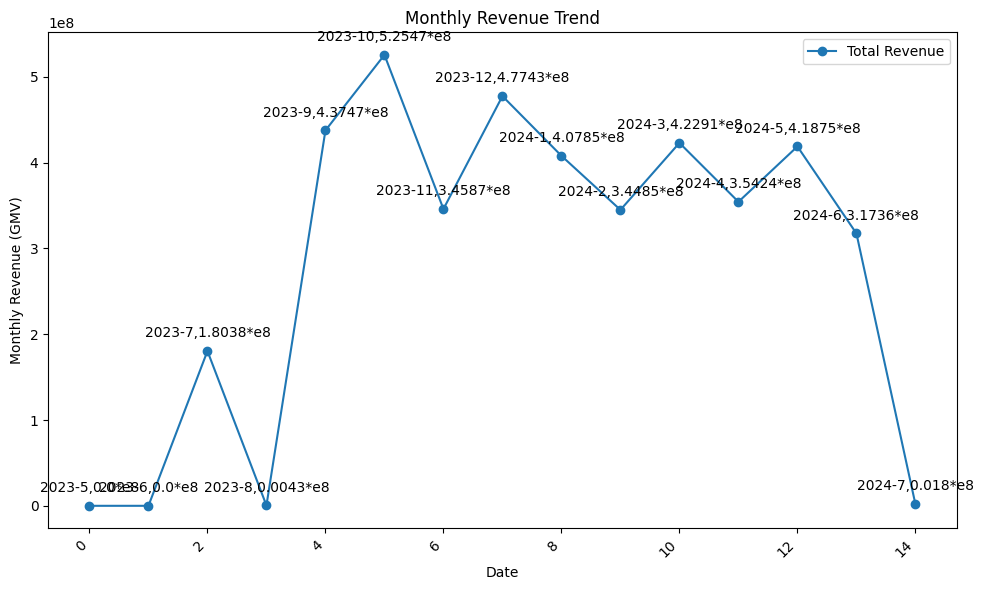

In [14]:
import matplotlib.pyplot as plt




monthly_revenue.plot(kind='line', figsize=(10, 6), marker='o')

# Annotate peak points
peak_indices = monthly_revenue.index

for date in peak_indices:
    value = monthly_revenue.loc[date, 'Total Revenue']
    plt.annotate(f"{monthly_revenue.loc[date,'Time']},{round(value/1e4)/1e4}*e8", (date, value), textcoords="offset points", xytext=(0, 10), ha='center')


plt.xlabel('Date')
plt.ylabel('Monthly Revenue (GMV)')
plt.title('Monthly Revenue Trend')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()



plt.show()


Seasonal Revenue Peaks: October and December 2023 show significant revenue spikes, likely driven by seasonal promotions like Black Friday and holiday sales.

Revenue Stabilization: From January to May 2024, revenue stabilizes between $3.42 × 10^8 and $4.18 × 10^8, indicating consistent performance post-holiday season.

Sharp Decline in June and July: Revenue drops drastically in June and hits its lowest point in July suggesting reduced marketing activity or external disruptions during these months.

In [16]:
media_data = pd.read_excel("Media data-Sale Calendar-NPS Scores_Data.xlsx",index_col=[0])
media_data = media_data.iloc[1:]

media_data.columns = media_data.iloc[0]
media_data = media_data.iloc[1:]
media_data.reset_index(drop=True,inplace=True)

media_data

nan,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2023,7,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2023,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2023,9,96.25438,3.879504,1.356528,62.787651,0.610292,16.37999,5.038266,6.202149,NaN,NaN
3,2023,10,170.156297,6.144711,12.62248,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2023,11,51.21622,4.22063,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN
5,2023,12,106.745312,5.397502,3.06336,56.705419,1.067307,22.503756,6.826938,11.18103,NaN,NaN
6,2024,1,74.196,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09
7,2024,2,48.052,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.87363,NaN,NaN
8,2024,3,100.024621,9.3,2.1,41.59,0.37,18.437818,6.217667,5.193591,0.87,15.945545
9,2024,4,56.848241,5.205196,0.871892,24.308354,0.034876,16.51451,5.693456,4.219958,NaN,NaN


In [17]:
monthly_revenue.reset_index(drop=True,inplace=True)
combined_monthly = pd.concat([media_data,monthly_revenue],axis=1)
combined_monthly.drop(columns=[combined_monthly.columns[0],combined_monthly.columns[1]],inplace=True)
combined_monthly

,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,Total Revenue,Time
0,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,NaN,NaN,3.149000e+03,2023-5
1,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN,4.982000e+03,2023-6
2,96.25438,3.879504,1.356528,62.787651,0.610292,16.37999,5.038266,6.202149,NaN,NaN,1.803764e+08,2023-7
3,170.156297,6.144711,12.62248,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN,4.274280e+05,2023-8
4,51.21622,4.22063,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN,4.374705e+08,2023-9
5,106.745312,5.397502,3.06336,56.705419,1.067307,22.503756,6.826938,11.18103,NaN,NaN,5.254696e+08,2023-10
6,74.196,4.38,0.456,4.2,0.9,22.9,7.37,4.2,2.7,27.09,3.458700e+08,2023-11
7,48.052,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.87363,NaN,NaN,4.774328e+08,2023-12
8,100.024621,9.3,2.1,41.59,0.37,18.437818,6.217667,5.193591,0.87,15.945545,4.078491e+08,2024-1
9,56.848241,5.205196,0.871892,24.308354,0.034876,16.51451,5.693456,4.219958,NaN,NaN,3.448515e+08,2024-2


In [18]:
combined_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Total Investment   12 non-null     object 
 1   TV                 12 non-null     object 
 2   Digital            12 non-null     object 
 3   Sponsorship        12 non-null     object 
 4   Content Marketing  12 non-null     object 
 5   Online marketing   12 non-null     object 
 6    Affiliates        12 non-null     object 
 7   SEM                12 non-null     object 
 8   Radio              3 non-null      object 
 9   Other              3 non-null      object 
 10  Total Revenue      15 non-null     float64
 11  Time               15 non-null     object 
dtypes: float64(1), object(11)
memory usage: 1.5+ KB


In [19]:
columns_to_convert = ['Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing',
       'Online marketing', ' Affiliates', 'SEM', 'Radio', 'Other'
       ]

combined_monthly.fillna(0, inplace=True)

combined_monthly[columns_to_convert] = combined_monthly[columns_to_convert].apply(pd.to_numeric)

In [20]:
corr = combined_monthly.corr(numeric_only=True)
corr["Total Revenue"].sort_values(ascending=False)

Total Revenue        1.000000
 Affiliates          0.485440
Online marketing     0.449383
TV                   0.309664
Radio                0.216648
Other                0.209769
Total Investment     0.106894
Sponsorship         -0.015810
Content Marketing   -0.171996
SEM                 -0.233638
Digital             -0.349067
Name: Total Revenue, dtype: float64

<Axes: xlabel='Time'>

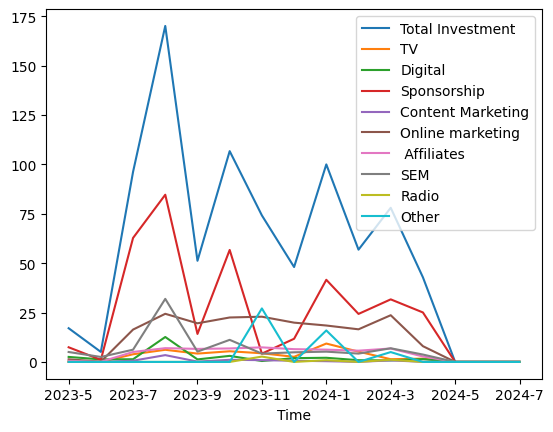

In [21]:
combined_monthly.drop("Total Revenue",axis=1).plot(x="Time")

**Insights from the Marketing Investment Graph**

1. **Total Investment Peaks**: The total marketing investment peaked in July 2023, driven primarily by Sponsorship advertising, which also showed a significant spike during this period.

2. **Channel Contributions**: Spomsorship advertising almost consistently contributed the highest to total investment, followed by Digital and Sponsorship channels, indicating their importance in driving marketing efforts.

3. **Decline in Investments**: After March 2024, total investment dropped sharply across all channels, suggesting reduced marketing activity or a shift in strategy during this period.



In [22]:
daily_revenue["gmv"].describe()

count    3.880000e+02
mean     1.091447e+07
std      1.202652e+07
min      1.880000e+02
25%      6.999164e+06
50%      9.978612e+06
75%      1.177843e+07
max      1.661163e+08
Name: gmv, dtype: float64

<Axes: xlabel='order_date'>

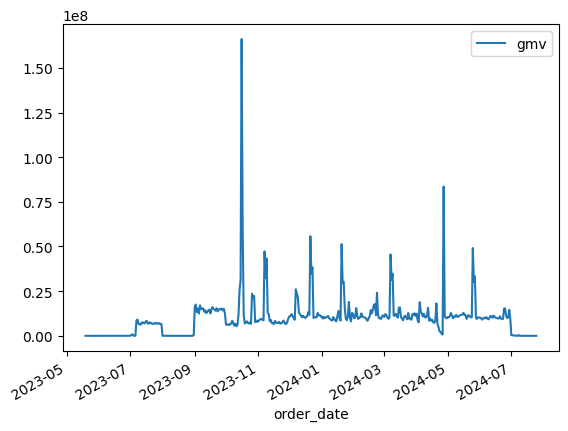

In [23]:
daily_revenue.plot()

 **Insights from the Daily Revenue Plot**

1. **Revenue Spikes**: Large revenue spikes are observed in November 2023 and May 2024, indicating high-impact promotional events or seasonal sales during these periods.

2. **Stable Revenue Periods**: Between December 2023 and April 2024, revenue remains relatively stable with smaller fluctuations, suggesting consistent sales performance during non-promotional periods.

3. **Low Revenue Days**: Several days show near-zero revenue, especially toward July 2024, which could indicate reduced customer activity or insufficient marketing efforts during these times.


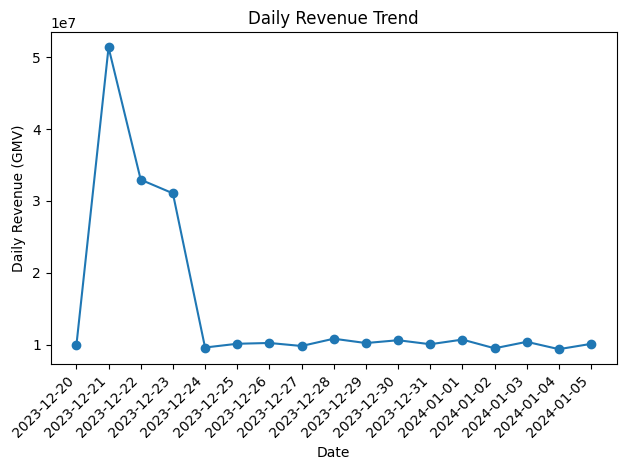

In [24]:
import matplotlib.pyplot as plt

df['order_date'] = pd.to_datetime(df['order_date'])

def plot_revenue_for_range(start_date,end_date):
  start_date = pd.to_datetime(start_date)
  end_date = pd.to_datetime(end_date)
  filtered_df = df[(df['order_date'] >= start_date) & (df['order_date'] <= end_date)]
  daily_revenue_in_range = filtered_df.groupby('order_date')['gmv'].sum().reset_index()
  # Convert 'order_date' to matplotlib-compatible numeric representation
  daily_revenue_in_range['order_date_num'] = daily_revenue_in_range['order_date'].apply(lambda date: date.toordinal())

  # Plot using the numeric representation
  plt.plot(daily_revenue_in_range['order_date_num'], daily_revenue_in_range['gmv'], marker='o')

  # Set x-axis labels to original dates
  plt.xticks(daily_revenue_in_range['order_date_num'], daily_revenue_in_range['order_date'].dt.strftime('%Y-%m-%d'), rotation=45, ha='right')

  plt.xlabel('Date')
  plt.ylabel('Daily Revenue (GMV)')
  plt.title('Daily Revenue Trend')
  plt.tight_layout()

  plt.show()

  return daily_revenue_in_range

def average_revenue_in_range(start_date,end_date):
  start_date = pd.to_datetime(start_date)
  end_date = pd.to_datetime(end_date)
  filtered_df = df[(df['order_date'] >= start_date) & (df['order_date'] <= end_date)]
  daily_revenue_in_range = filtered_df.groupby('order_date')['gmv'].sum().reset_index()

  return daily_revenue_in_range,daily_revenue_in_range["gmv"].mean()



start_date = '2023-12-20'
end_date = '2024-01-05'

x=plot_revenue_for_range(start_date,end_date)

**Insights from the Daily Revenue Trend Graph**

1. **Revenue Spike**: A significant revenue peak is observed on December 21, 2023, indicating a high-impact promotional event or holiday sales.

2. **Rapid Decline**: Revenue drops sharply after December 22, 2023, suggesting the end of a major sale or promotion.

3. **Stable Revenue**: From December 24, 2023, onwards, revenue stabilizes at lower levels, indicating consistent but reduced daily sales activity.


In [25]:

#Lets look at how much sale was done per day on average and compare it to per day on days of sale.
sale_start_date = ["2023-7-18","2023-8-17","2023-8-28","2023-10-15","2023-11-7","2023-12-25","2024-1-20","2024-2-1","2024-2-14","2024-2-20","2024-3-7","2024-5-25"]
sale_end_date = ["2023-7-19","2023-8-17","2023-8-30","2023-10-17","2023-11-14","2024-1-3","2024-1-22","2024-2-2","2024-2-15","2024-2-21","2024-3-9","2024-5-27"]
sum = 0
max=0

for i in range(len(sale_start_date)):
  start_date = sale_start_date[i]
  end_date = sale_end_date[i]

  daily_revenue_in_range,average_revenue = average_revenue_in_range(start_date,end_date)
  sum += average_revenue

  if average_revenue>max:
    max=average_revenue
    best_sale = [start_date,end_date]
average_revenue_during_sales = sum/len(sale_start_date)

print("The average revenue per day during sales is ",average_revenue_during_sales)
print("The average revenue per day is ", daily_revenue["gmv"].mean())

print("The increase in revenue during sales is ",(average_revenue_during_sales-daily_revenue["gmv"].mean())/daily_revenue["gmv"].mean()*100,"%")

print("The most successful sale was the one from ",best_sale[0]," to ",best_sale[1])

The average revenue per day during sales is  21810259.14894902
The average revenue per day is  10914473.269327495
The increase in revenue during sales is  99.82878340305723 %
The most successful sale was the one from  2023-10-15  to  2023-10-17


In [26]:
len(df["order_id"].unique())

1501177

In [27]:
len(df["order_item_id"].unique())

1480765

The percentage of orders that are COD is  72.26016845945959
The percentage of orders that are Prepaid is 27.739831540540408 



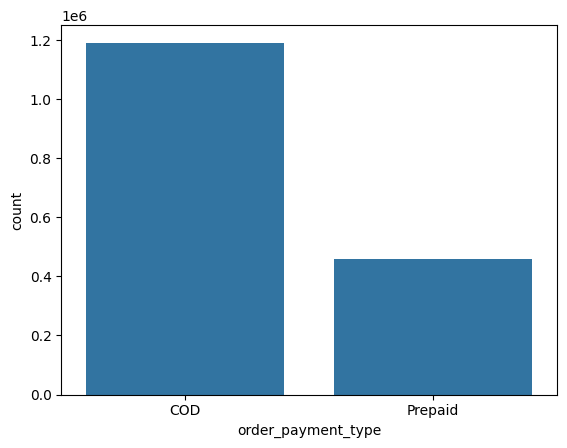

In [28]:
import seaborn as sns

sns.barplot(df["order_payment_type"].value_counts())
m = df[df["order_payment_type"]=="COD"].shape[0]

print("The percentage of orders that are COD is ",m*100/df.shape[0])
print("The percentage of orders that are Prepaid is",(df.shape[0]-m)*100/df.shape[0],"\n")

**Insights from the Order Payment Type Graph**

**Preference for COD**: Cash on Delivery (COD) is the most preferred payment method, with significantly higher usage compared to prepaid payments.

**Prepaid Payments Underutilized**: Prepaid payments are much less common, indicating potential customer hesitancy or lack of incentives for prepaid options.

**Opportunity for Prepaid Growth**: The gap between COD and prepaid usage suggests an opportunity to promote prepaid payments through discounts or loyalty programs.

In [29]:
prepaid = df[df["order_payment_type"]=="Prepaid"]
cod = df[df["order_payment_type"]=="COD"]

You can see alot of differences in values of means and variances of different features based on whether it was prepaid or COD.
Lets look at the revenue.

The average price of an item ordered with Prepaid payment is  3704.798559905195
The average price of an item ordered with COD payment is  1988.8110431822452 



<BarContainer object of 2 artists>

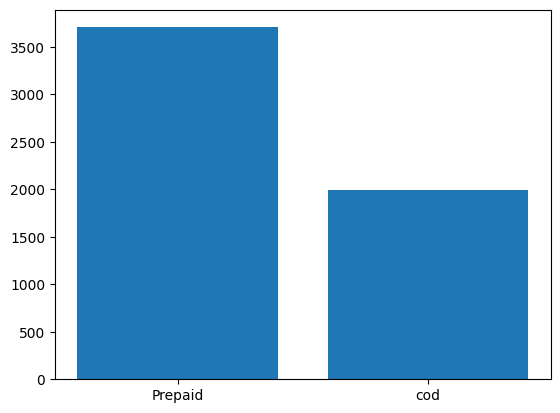

In [30]:
print("The average price of an item ordered with Prepaid payment is ",prepaid["gmv"].mean())
print("The average price of an item ordered with COD payment is ",cod["gmv"].mean(),"\n")

plt.bar(x=["Prepaid","cod"],height=[3704.7985,1988.81])

Prepaid method is used less than cod method but its used to order
relatively costlier products than cod method.

In [31]:
daily_prepaid = pd.DataFrame()
daily_prepaid["gmv"] = prepaid.groupby(by="order_date")["total_gmv"].sum()

daily_cod = pd.DataFrame()
daily_cod["gmv"] = cod.groupby(by="order_date")["total_gmv"].sum()

The mean and std deviation of daily revenue of prepaid orders is 
 4823976.551297507 6803193.375386431 

The mean and std deviation of daily revenue of cod orders is 
 6553330.1856941255 5956980.941236972 



Text(0.5, 1.0, 'Mean daily revenue of prepaid and cod orders')

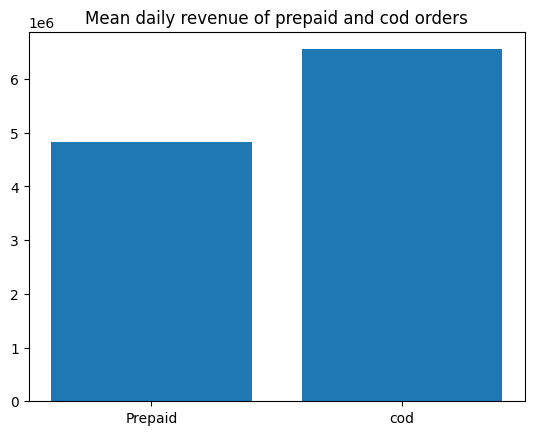

In [32]:
print("The mean and std deviation of daily revenue of prepaid orders is \n", daily_prepaid["gmv"].mean(),daily_prepaid["gmv"].std(),"\n")
print("The mean and std deviation of daily revenue of cod orders is \n", daily_cod["gmv"].mean(),daily_cod["gmv"].std(),"\n")

plt.bar(x=["Prepaid","cod"],height=[daily_prepaid["gmv"].mean(),daily_cod["gmv"].mean()])
plt.title("Mean daily revenue of prepaid and cod orders")


In [33]:
#How much of total revenue comes from both segments
print("The percentage of total revenue from prepaid orders is ",daily_prepaid["gmv"].sum()*100/daily_revenue["gmv"].sum())
print("The percentage of total revenue from cod orders is ",daily_cod["gmv"].sum()*100/daily_revenue["gmv"].sum())



The percentage of total revenue from prepaid orders is  41.350170626947296
The percentage of total revenue from cod orders is  58.64982937305272


In [34]:

#Make a dataframe just containing data of revenue during sales(all sales concatenated vertically.)

sale_start_date = ["2023-7-18","2023-8-15","2023-8-28","2023-10-15","2023-11-7","2023-12-25","2024-1-20","2024-2-1","2024-2-14","2024-2-20","2024-3-7","2024-5-25"]
sale_end_date = ["2023-7-19","2023-8-17","2023-8-30","2023-10-17","2023-11-14","2024-1-3","2024-1-22","2024-2-2","2024-2-15","2024-2-21","2024-3-9","2024-5-27"]
sale_revenue = pd.DataFrame()
total_time = pd.Timedelta(0)

for i in range(len(sale_start_date)):
  start_date = pd.to_datetime(sale_start_date[i])
  end_date = pd.to_datetime(sale_end_date[i])
  time = end_date - start_date

  total_time += time
  temp = df[(df['order_date'] >= start_date) & (df['order_date'] <= end_date)]
  sale_revenue = pd.concat([sale_revenue,temp],axis=0)

daily_sale_revenue = pd.DataFrame()
daily_sale_revenue["gmv"] = sale_revenue.groupby(by="order_date")["total_gmv"].sum()

total_revenue_during_sales = daily_sale_revenue["gmv"].sum()
total_revenue = daily_revenue["gmv"].sum()



print("The total number of days a sale was happening in the store : ",total_time)
print("The percentage of days a sale was on:",total_time*100/total_date_range,"%\n")

print("The total revenue during sales is ",total_revenue_during_sales)
print("The total revenue is ",total_revenue)
print("The percentage of revenue during sales is ",total_revenue_during_sales*100/total_revenue,"%\n")


print("The number of items sold during sales",sale_revenue["units"].sum())
print("The total number of items sold through-out the year",df["units"].sum())
print("The percentage of items sold during sales is ",sale_revenue["units"].sum()*100/df["units"].sum(),"%")

print("About 18% of the items were sold and 22.65% of the total revenue was generated in just 7.4% of the days of the store being active")

The total number of days a sale was happening in the store :  32 days 00:00:00
The percentage of days a sale was on: 7.390300230946882 %

The total revenue during sales is  960281796.7124352
The total revenue is  4234815628.4990683
The percentage of revenue during sales is  22.67588204430956 %

The number of items sold during sales 301737
The total number of items sold through-out the year 1685242
The percentage of items sold during sales is  17.90466888435014 %
About 18% of the items were sold and 22.65% of the total revenue was generated in just 7.4% of the days of the store being active


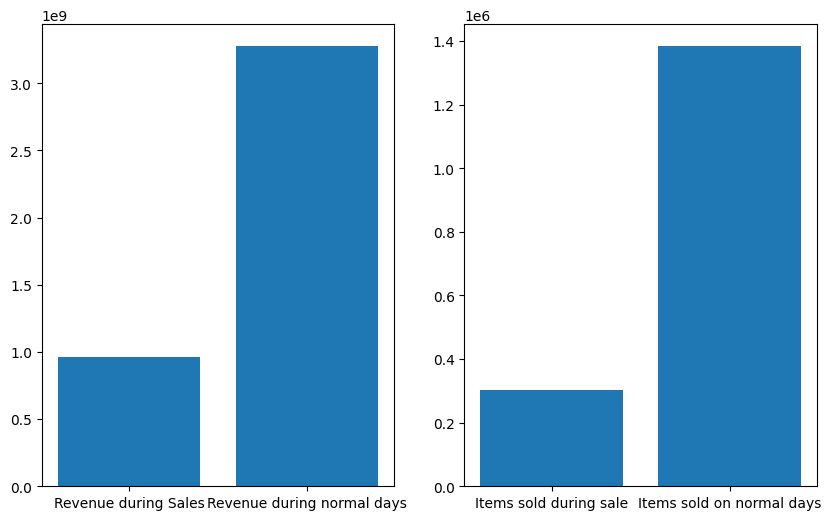

In [35]:
#Lets generate some plots for better understanding.
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
plt.bar(x=["Revenue during Sales","Revenue during normal days"],height=[total_revenue_during_sales,total_revenue-total_revenue_during_sales])

plt.subplot(1,2,2)
plt.bar(x=["Items sold during sale","Items sold on normal days"],height=[sale_revenue["units"].sum(),df["units"].sum()-sale_revenue["units"].sum()])

plt.show()

Insights:
About 18% of the items were sold and 22.65% of the total revenue was generated in just 7.4% of the days(32 days) of the store being active.


Detailed:

The total number of days a sale was happening in the store :  32 days The percentage of days a sale was on: 7.390300230946882 %

The total revenue during sales is  960281796.7124352
The total revenue is  4234815628.4990683
The percentage of total revenue that came during sales is  22.67588204430956 %

The number of items sold during sales 301737
The total number of items sold through-out the year 1685242
The percentage of items sold during sales is  17.90466888435014 %


The percentage of prepaid orders during sale is  26.877352412600455
The percentage of cod orders during sale is  73.12264758739954
This has no change to what the normal was 


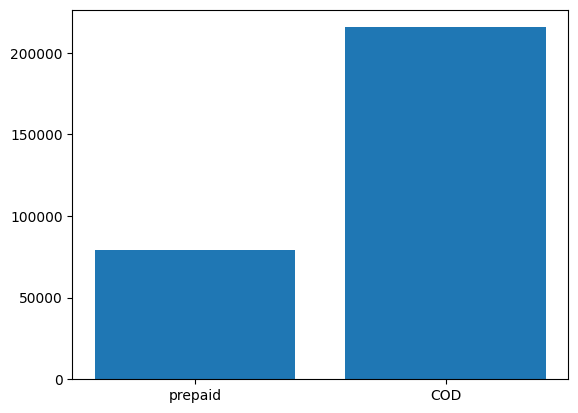

In [36]:
#Lets look at how the order_payment varies on sale days.

temp = sale_revenue["order_payment_type"].value_counts()
print("The percentage of prepaid orders during sale is ",temp["Prepaid"]*100/sale_revenue.shape[0])
print("The percentage of cod orders during sale is ",temp["COD"]*100/sale_revenue.shape[0])

plt.bar(x=["prepaid","COD"],height = [temp["Prepaid"],temp["COD"]])

print("This has no change to what the normal was ")


In [37]:
print("The average amount of expected time to deliver prepaid orders is",prepaid["sla"].mean()," days")
print("The average amount of expected time to deliver cod orders is ",cod["sla"].mean()," days")
print("The average amount of expected time to deliver an order is ",df["sla"].mean()," days\n")

print("The average amount of expected time to procure prepaid orders is",prepaid["product_procurement_sla"].mean()," days")
print("The average amount of expected time to procure cod orders is ",cod["product_procurement_sla"].mean()," days")
print("The average amount of expected time to procure an order is ",df["product_procurement_sla"].mean()," days")

print("It takes about",cod["product_procurement_sla"].mean() + cod["sla"].mean()-prepaid["sla"].mean()-prepaid["product_procurement_sla"].mean(), "days longer in total to both deliver and procure products when booked using COD method!")

The average amount of expected time to deliver prepaid orders is 5.220107525236072  days
The average amount of expected time to deliver cod orders is  5.867386018466683  days
The average amount of expected time to deliver an order is  5.687832054846363  days

The average amount of expected time to procure prepaid orders is 5.017713897166694  days
The average amount of expected time to procure cod orders is  5.5515312104733505  days
The average amount of expected time to procure an order is  5.403451187027845  days
It takes about 1.1810958065372672 days longer in total to both deliver and procure products when booked using COD method!


In [38]:
# prompt: print("The average amount of time actually taken to deliver a product using prepaid method is")

print("The average amount of time actually taken to deliver a product using prepaid method is", prepaid["deliverybdays"].mean() + prepaid["deliverycdays"].mean(), "days")
print("The average amount of time actually taken to deliver a product when using COD method is ",cod["deliverybdays"].mean()+cod["deliverycdays"].mean(),"days")

print("The average COD product is delivered",prepaid["deliverybdays"].mean() + prepaid["deliverycdays"].mean()- cod["deliverybdays"].mean()-cod["deliverycdays"].mean()," days before an average Prepaid product")

The average amount of time actually taken to deliver a product using prepaid method is 3.2092172608831584 days
The average amount of time actually taken to deliver a product when using COD method is  1.5371822235725923 days
The average COD product is delivered 1.6720350373105661  days before an average Prepaid product


Text(0.5, 1.0, 'The average time taken to deliver a product to customer.')

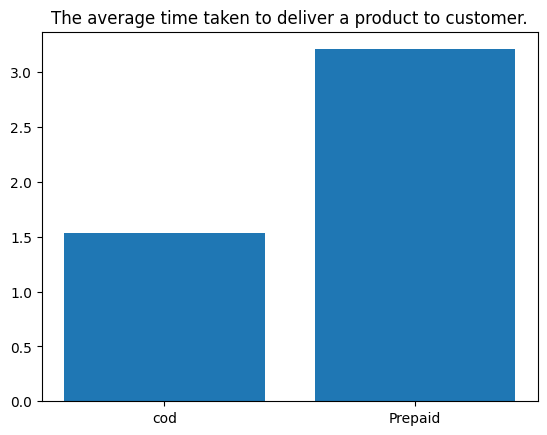

In [39]:
plt.bar(x=["cod","Prepaid"],height=[cod["deliverybdays"].mean()+cod["deliverycdays"].mean(),prepaid["deliverybdays"].mean() + prepaid["deliverycdays"].mean()])
plt.title("The average time taken to deliver a product to customer.")

The average time it takes to deliver a product during a sale 0.6548709775863824  days
The average time it takes to deliver a product during a normal day 2.001001926221355  days


<BarContainer object of 2 artists>

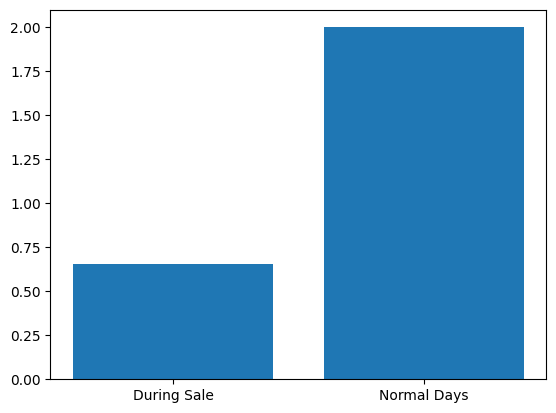

In [40]:
print("The average time it takes to deliver a product during a sale",sale_revenue["deliverybdays"].mean()+sale_revenue["deliverycdays"].mean()," days")
print("The average time it takes to deliver a product during a normal day",df["deliverybdays"].mean()+df["deliverycdays"].mean()," days")

plt.bar(x=["During Sale","Normal Days"], height=[sale_revenue["deliverybdays"].mean()+sale_revenue["deliverycdays"].mean(),df["deliverybdays"].mean()+df["deliverycdays"].mean()])

In [41]:


# Calculate average delivery time for COD and prepaid orders during sales
sale_revenue_cod = sale_revenue[sale_revenue["order_payment_type"] == "COD"]
sale_revenue_prepaid = sale_revenue[sale_revenue["order_payment_type"] == "Prepaid"]

avg_delivery_time_cod_sale = sale_revenue_cod["deliverybdays"].mean() + sale_revenue_cod["deliverycdays"].mean()
avg_delivery_time_prepaid_sale = sale_revenue_prepaid["deliverybdays"].mean() + sale_revenue_prepaid["deliverycdays"].mean()

print("Average delivery time for COD orders during sales:", avg_delivery_time_cod_sale, "days")
print("Average delivery time for prepaid orders during sales:", avg_delivery_time_prepaid_sale, "days")


Average delivery time for COD orders during sales: 0.6167793513443328 days
Average delivery time for prepaid orders during sales: 0.7585032297133629 days


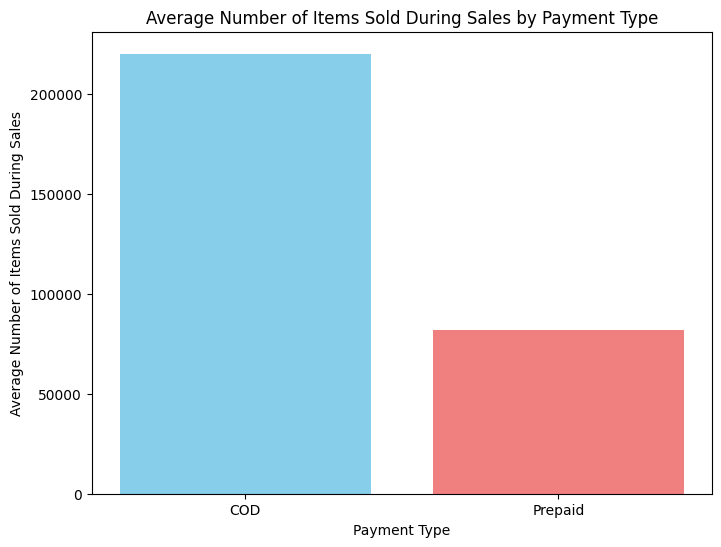

The percentage of items being bought using COD is 72.9025608394065


In [42]:

import matplotlib.pyplot as plt

# Calculate average items sold during sales for COD and prepaid
items_sold_cod_sale = sale_revenue_cod["units"].sum()
items_sold_prepaid_sale = sale_revenue_prepaid["units"].sum()

# Create the bar graph
plt.figure(figsize=(8, 6))
plt.bar(["COD", "Prepaid"], height=[items_sold_cod_sale, items_sold_prepaid_sale], color=['skyblue', 'lightcoral'])
plt.xlabel("Payment Type")
plt.ylabel("Average Number of Items Sold During Sales")
plt.title("Average Number of Items Sold During Sales by Payment Type")
plt.show()

print("The percentage of items being bought using COD is",items_sold_cod_sale*100/sale_revenue["units"].sum())

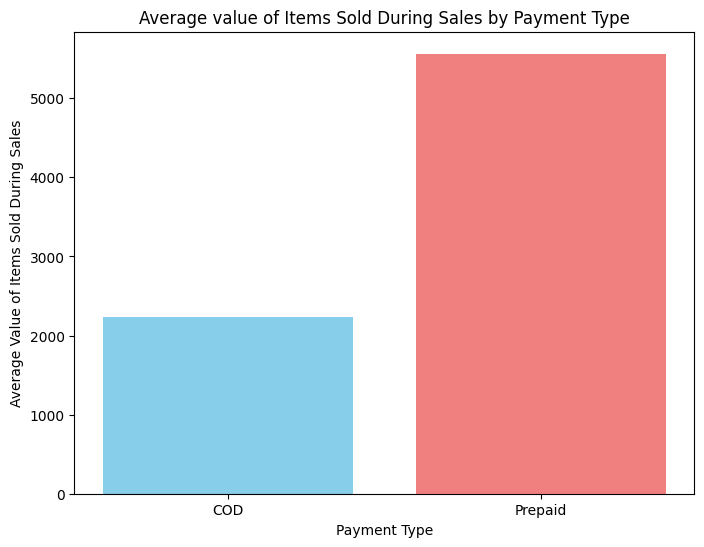

The average cost of items being bought using COD during sale is 2236.3113819170444 
% change to normal days 0.12444638196436215
The average cost of items being bought using Prepaid during sale is 5562.936283963944 
% change to normal days :  0.5015489220300007


In [43]:
items_sold_value_cod_sale = sale_revenue_cod["gmv"].mean()
items_sold_value_prepaid_sale = sale_revenue_prepaid["gmv"].mean()

# Create the bar graph
plt.figure(figsize=(8, 6))
plt.bar(["COD", "Prepaid"], height=[items_sold_value_cod_sale, items_sold_value_prepaid_sale], color=['skyblue', 'lightcoral'])
plt.xlabel("Payment Type")
plt.ylabel("Average Value of Items Sold During Sales")
plt.title("Average value of Items Sold During Sales by Payment Type")
plt.show()

print("The average cost of items being bought using COD during sale is",items_sold_value_cod_sale ,"\n% change to normal days",(items_sold_value_cod_sale-cod["gmv"].mean())/cod["gmv"].mean())
print("The average cost of items being bought using Prepaid during sale is",items_sold_value_prepaid_sale,"\n% change to normal days : ",(items_sold_value_prepaid_sale-prepaid["gmv"].mean())/prepaid["gmv"].mean())

Insights:
The average value of item bought during sale using prepaid method has 50% increase! Goes from 3700 to 5560!

Details:

The average cost of items being bought using COD during sale is 2236.3113819170444
% change to normal days 0.12444638196436215

The average cost of items being bought using Prepaid during sale is 5562.936283963944
% change to normal days :  0.5015489220300007


The amount of revenue that comes from COD during a sale is 508406284.980512
The amount of revenue that comes from Prepaid during a sale is 451875511.7319232
The percentage of revenue that comes from COD during a sale is 52.943447092412036
The percentage of revenue that comes from Prepaid during a sale is  47.056552907587964


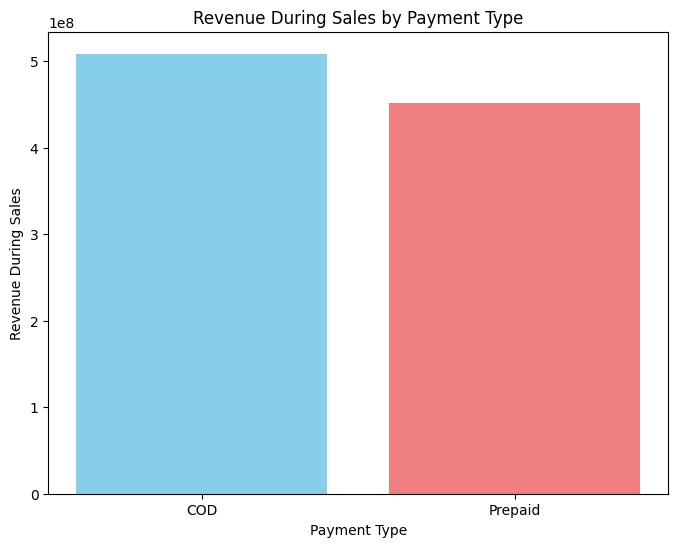

In [44]:
print("The amount of revenue that comes from COD during a sale is",sale_revenue_cod["total_gmv"].sum())
print("The amount of revenue that comes from Prepaid during a sale is",sale_revenue_prepaid["total_gmv"].sum())
print("The percentage of revenue that comes from COD during a sale is",sale_revenue_cod["total_gmv"].sum()*100/sale_revenue["total_gmv"].sum())
print("The percentage of revenue that comes from Prepaid during a sale is ",100-sale_revenue_cod["total_gmv"].sum()*100/sale_revenue["total_gmv"].sum())

plt.figure(figsize=(8, 6))
plt.bar(["COD", "Prepaid"], height=[sale_revenue_cod["total_gmv"].sum(),sale_revenue_prepaid["total_gmv"].sum()], color=['skyblue', 'lightcoral'])
plt.xlabel("Payment Type")
plt.ylabel("Revenue During Sales")
plt.title("Revenue During Sales by Payment Type")
plt.show()

Insights:

The percentage of revenue that comes from COD during a sale is 52.943447092412036%
The percentage of revenue that comes from Prepaid during a sale is  47.056552907587964%

This is different from Normal days:

The percentage of total revenue from prepaid orders is  :41.350170626947296%
The percentage of total revenue from cod orders is  :58.64982937305272%


Lets look at what happens during april 27 which has a very un-explained jump in sales.


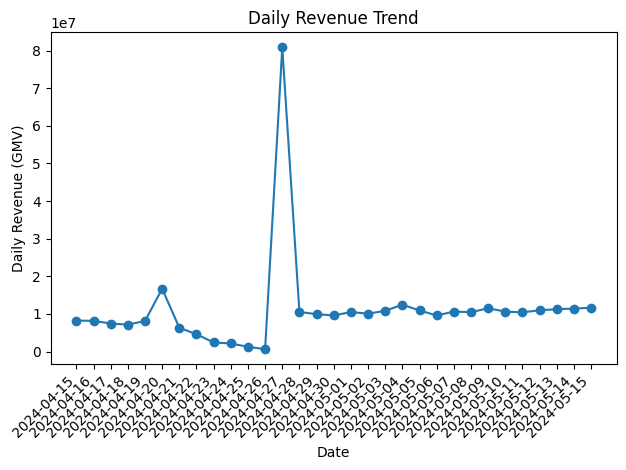

In [45]:
anomaly = plot_revenue_for_range("2024-4-15","2024-5-15")

**Revenue Fluctuations Before the Spike:** Before the peak, there are smaller fluctuations in revenue, with one noticeable increase preceding the major spike. This suggests some preparatory activity or smaller-scale events leading up to the significant revenue day.

In [46]:
anomaly = df[df["order_date"]==pd.to_datetime("2024-4-27")]

In [47]:
anomaly["gmv"].sum()

80859281.08001459

## eda 2

Loading datasets...
Daily data shape: (361, 52)
Monthly data shape: (12, 28)
Marketing columns found: ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'SEM', 'Radio', 'Other']

Generating visualizations...
Number of outliers detected: 60
Saved daily_gmv_trend.png
Saved monthly_gmv_trend.png
Saved gmv_rolling_stats.png
Saved discount_vs_gmv.png
Saved weekend_effect.png
Saved seasonal_patterns.png
Saved marketing_vs_gmv.png
Saved gmv_outliers.png
Saved seasonal_decomposition.png
Saved units_trend.png
Saved correlation_heatmap.png
Interactive dashboard saved as ecommerce_dashboard.html

Time series analysis visualization complete!
All visualizations saved to your Google Drive.

Performing marketing ROI analysis...
Saved marketing_roi_comparison.png
Saved marketing_roi_over_time.png


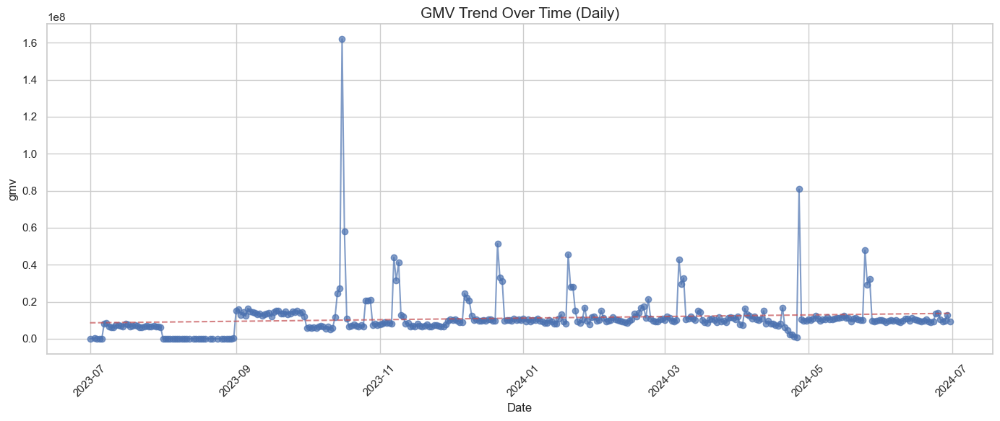

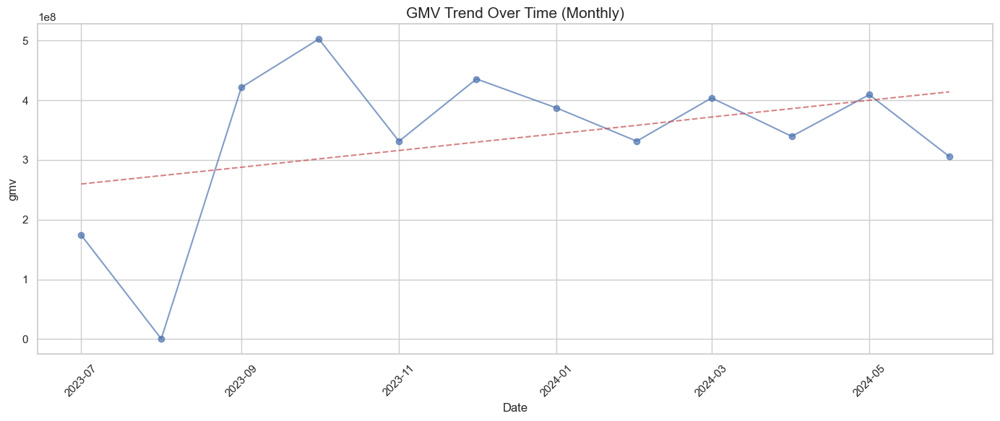

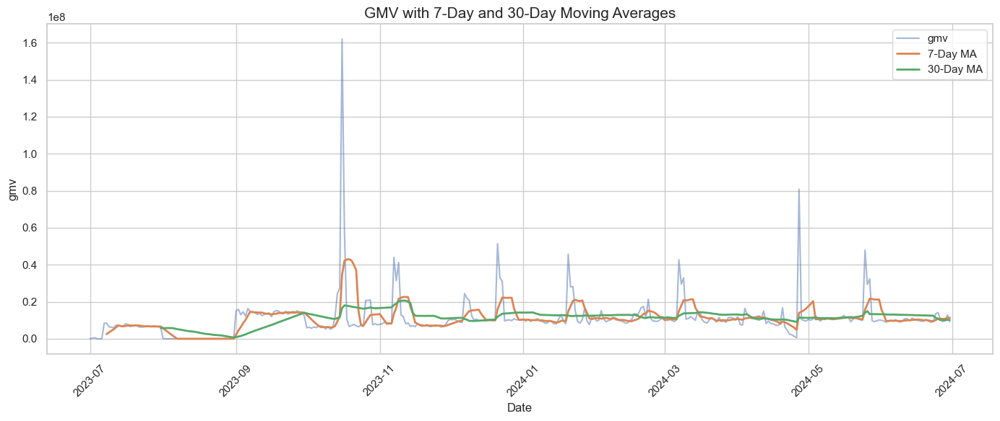

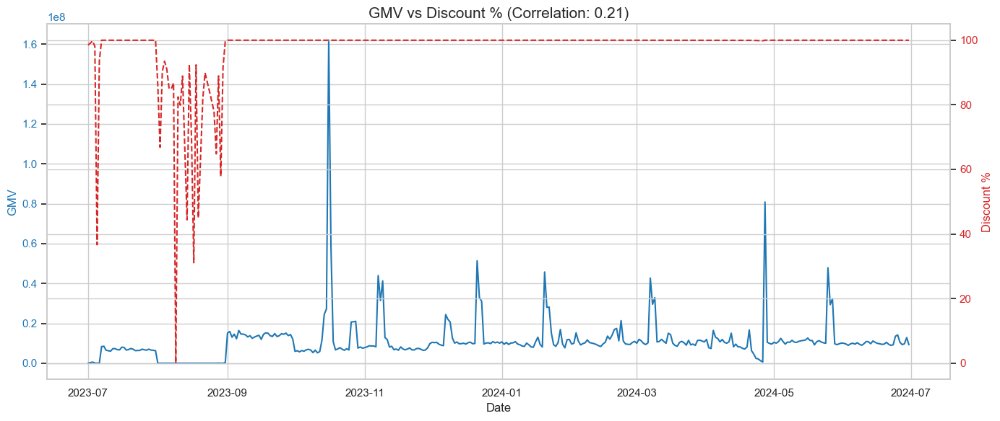

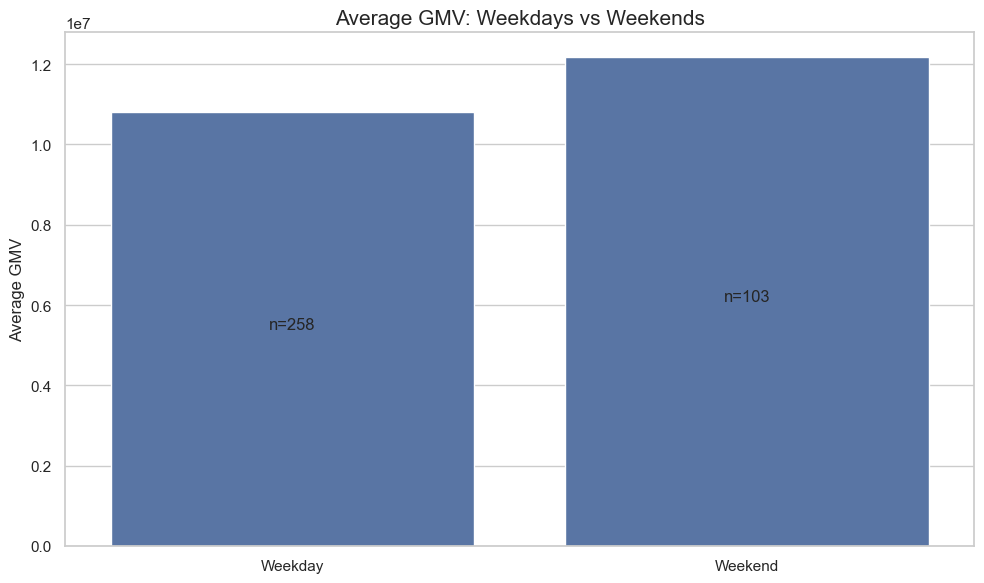

...

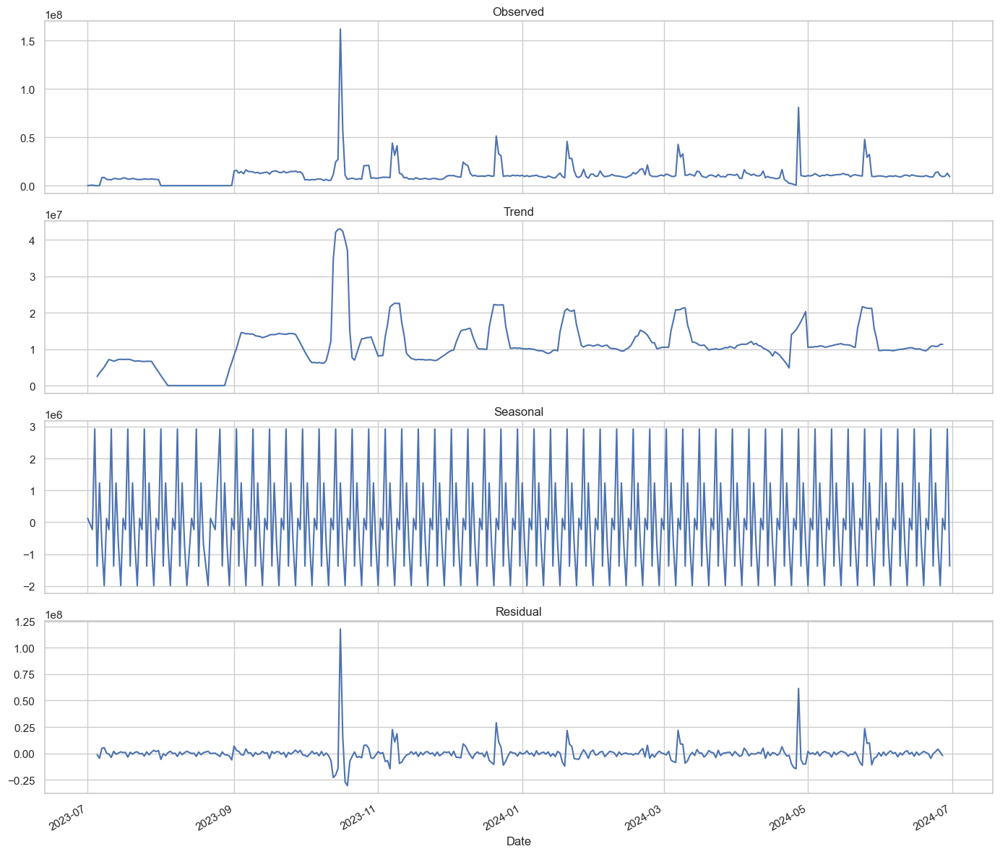

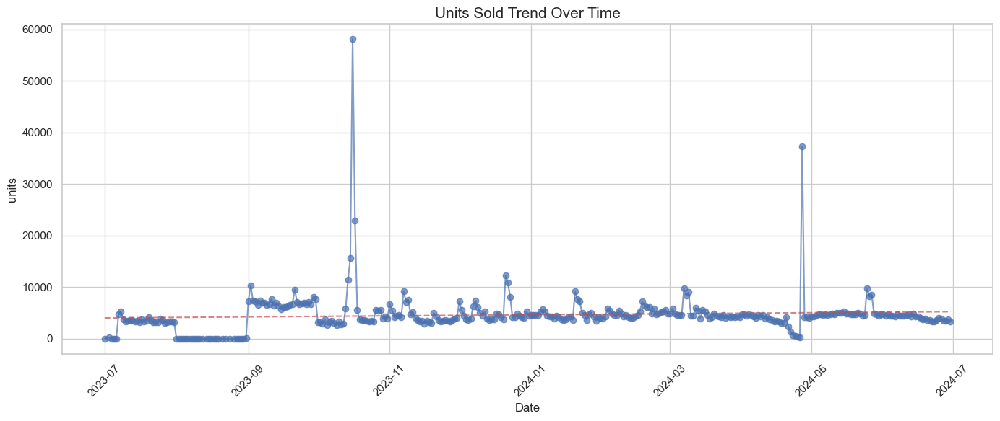

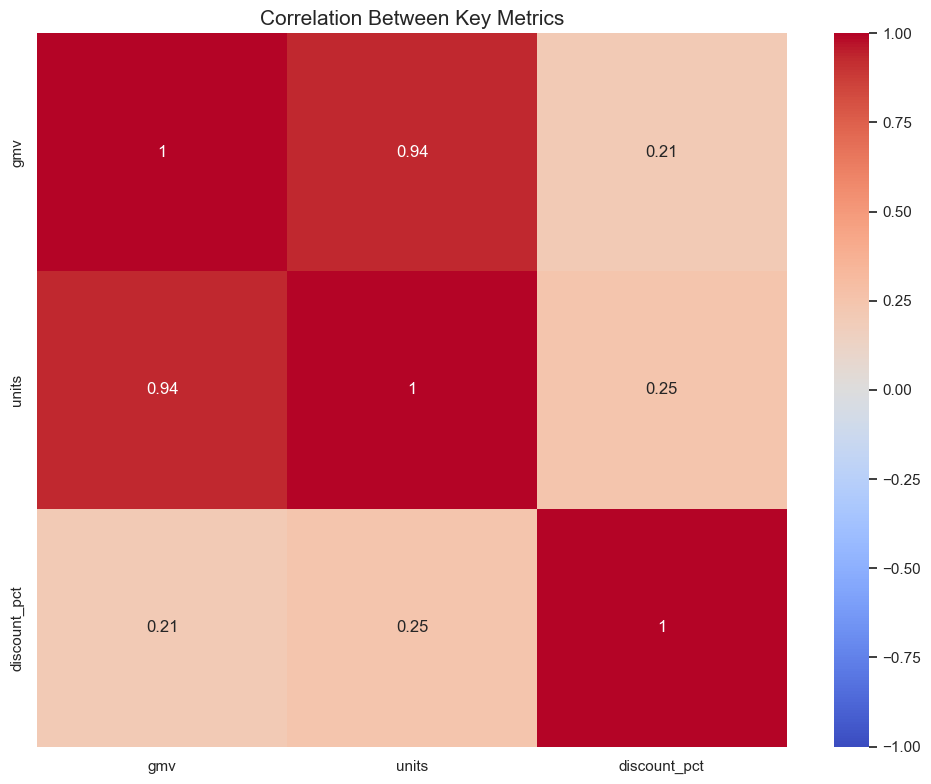

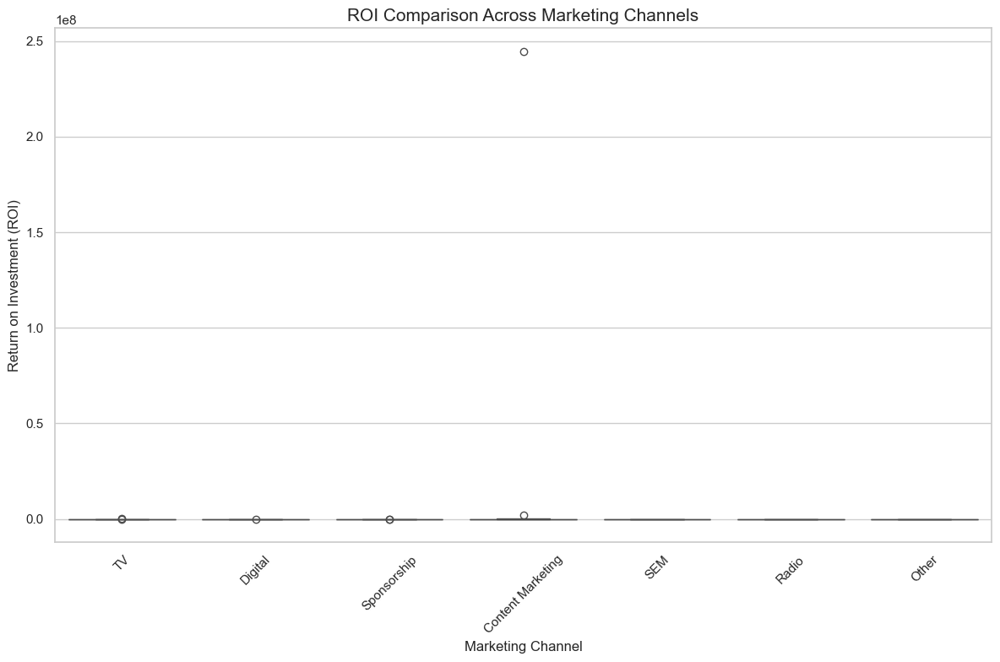

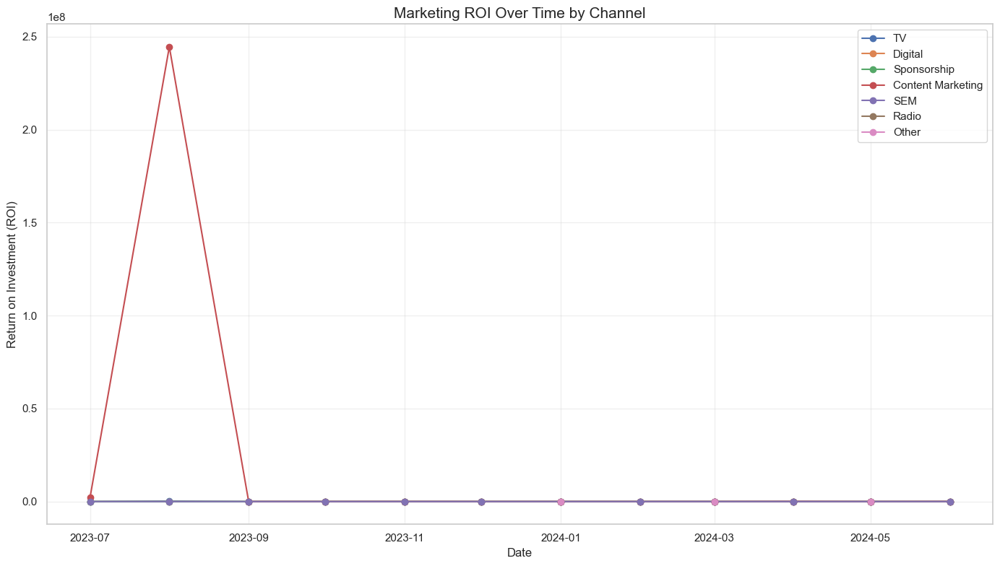

In [56]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
warnings.filterwarnings('ignore')

# Set style
plt.style.use('ggplot')
sns.set(style="whitegrid")

# File paths
DAILY_FILE = 'daily_data_enhanced (1).csv'
MONTHLY_FILE = 'monthly_data_enhanced.csv'
DAILY_AGG_FILE = 'daily_aggregated_data.csv'
MONTHLY_AGG_FILE = 'monthly_aggregated_data.csv'

# 1. Load the datasets
print("Loading datasets...")
daily_df = pd.read_csv(DAILY_FILE)
monthly_df = pd.read_csv(MONTHLY_FILE)

# Convert date columns to datetime
if 'Date' in daily_df.columns:
    daily_df['Date'] = pd.to_datetime(daily_df['Date'])

# Create a date column for monthly data if not present
if 'Year' in monthly_df.columns and 'Month' in monthly_df.columns:
    monthly_df['Date'] = pd.to_datetime(monthly_df[['Year', 'Month']].assign(day=1))

# Load media spend data if available (assuming it's in the monthly data)
# Check for marketing columns
marketing_cols = [col for col in monthly_df.columns if col in
                ['TV', 'Digital', 'Sponsorship', 'Content Marketing',
                 'Affiliates', 'SEM', 'Radio', 'Other', 'total_marketing_spend']]

print(f"Daily data shape: {daily_df.shape}")
print(f"Monthly data shape: {monthly_df.shape}")
print(f"Marketing columns found: {marketing_cols}")

# 2. Time Series Visualization Functions

def plot_time_series(df, date_col, value_col, title, ax=None):
    """Plot a time series with trend line"""
    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 6))

    df_sorted = df.sort_values(date_col)
    ax.plot(df_sorted[date_col], df_sorted[value_col], marker='o', linestyle='-', alpha=0.7)

    # Add trend line
    z = np.polyfit(range(len(df_sorted)), df_sorted[value_col], 1)
    p = np.poly1d(z)
    ax.plot(df_sorted[date_col], p(range(len(df_sorted))), "r--", alpha=0.7)

    ax.set_title(title, fontsize=15)
    ax.set_xlabel('Date')
    ax.set_ylabel(value_col)
    plt.xticks(rotation=45)
    return ax

def plot_marketing_vs_gmv(monthly_data, marketing_cols):
    """Plot marketing spend vs GMV"""
    if not marketing_cols or 'gmv' not in monthly_data.columns:
        print("Marketing columns or GMV not found in monthly data")
        return

    # Create a figure with subplots for each marketing channel
    fig, axes = plt.subplots(len(marketing_cols), 1, figsize=(14, 4*len(marketing_cols)))

    if len(marketing_cols) == 1:
        axes = [axes]

    for i, col in enumerate(marketing_cols):
        ax = axes[i]
        monthly_data.sort_values('Date').plot(x='Date', y=[col, 'gmv'], secondary_y='gmv', ax=ax)
        ax.set_title(f'{col} vs GMV', fontsize=14)
        ax.set_ylabel(col)
        ax.right_ax.set_ylabel('GMV')

    plt.tight_layout()
    return fig

def plot_rolling_statistics(df, date_col, value_col, windows=[7, 30], title=None):
    """Plot a time series with its rolling statistics"""
    df_sorted = df.sort_values(date_col).copy()

    # Create rolling statistics
    for window in windows:
        df_sorted[f'{value_col}_MA{window}'] = df_sorted[value_col].rolling(window=window).mean()
        df_sorted[f'{value_col}_STD{window}'] = df_sorted[value_col].rolling(window=window).std()

    # Plot
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.plot(df_sorted[date_col], df_sorted[value_col], label=value_col, alpha=0.5)

    for window in windows:
        ax.plot(df_sorted[date_col], df_sorted[f'{value_col}_MA{window}'],
                label=f'{window}-Day MA', linewidth=2)

    ax.set_title(title or f'{value_col} with Rolling Statistics', fontsize=15)
    ax.set_xlabel('Date')
    ax.set_ylabel(value_col)
    ax.legend()
    plt.xticks(rotation=45)
    return fig

def plot_seasonal_decomposition(df, date_col, value_col, period, model='additive'):
    """Plot seasonal decomposition of time series"""
    df_sorted = df.sort_values(date_col).copy()
    df_sorted = df_sorted.set_index(date_col)

    # Handle missing values for decomposition
    series = df_sorted[value_col].fillna(df_sorted[value_col].mean())

    # Perform decomposition
    result = seasonal_decompose(series, model=model, period=period)

    # Plot
    fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)
    result.observed.plot(ax=axes[0], title='Observed')
    result.trend.plot(ax=axes[1], title='Trend')
    result.seasonal.plot(ax=axes[2], title='Seasonal')
    result.resid.plot(ax=axes[3], title='Residual')

    plt.tight_layout()
    return fig

def plot_discount_vs_gmv(df, date_col='Date'):
    """Plot discount percentage vs GMV over time"""
    if 'discount_pct' not in df.columns or 'gmv' not in df.columns:
        print("Discount percentage or GMV not found in data")
        return

    # Create a copy and sort by date
    df_sorted = df.sort_values(date_col).copy()

    # Calculate correlation
    corr = df_sorted['discount_pct'].corr(df_sorted['gmv'])

    # Create plot
    fig, ax1 = plt.subplots(figsize=(14, 6))

    # Plot GMV
    color = 'tab:blue'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('GMV', color=color)
    ax1.plot(df_sorted[date_col], df_sorted['gmv'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    # Create second y-axis for discount
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Discount %', color=color)
    ax2.plot(df_sorted[date_col], df_sorted['discount_pct'], color=color, linestyle='--')
    ax2.tick_params(axis='y', labelcolor=color)

    # Add title with correlation
    plt.title(f'GMV vs Discount % (Correlation: {corr:.2f})', fontsize=15)

    plt.xticks(rotation=45)
    fig.tight_layout()
    return fig

def plot_weekend_effect(df, date_col='Date'):
    """Plot weekend vs weekday GMV comparison"""
    if 'is_weekend' not in df.columns or 'gmv' not in df.columns:
        print("Weekend indicator or GMV not found in data")
        return

    # Group by weekend flag and calculate mean GMV
    weekend_impact = df.groupby('is_weekend')['gmv'].agg(['mean', 'median', 'count']).reset_index()
    weekend_impact['is_weekend'] = weekend_impact['is_weekend'].map({0: 'Weekday', 1: 'Weekend'})

    # Create plot
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.barplot(x='is_weekend', y='mean', data=weekend_impact, ax=ax)
    ax.set_title('Average GMV: Weekdays vs Weekends', fontsize=15)
    ax.set_ylabel('Average GMV')
    ax.set_xlabel('')

    # Add text with count
    for i, row in weekend_impact.iterrows():
        ax.text(i, row['mean']/2, f"n={row['count']}", ha='center', fontsize=12)

    return fig

def plot_seasonal_patterns(df, date_col='Date'):
    """Plot seasonal patterns in GMV"""
    if 'gmv' not in df.columns:
        print("GMV not found in data")
        return

    # Convert date to datetime if not already
    if not pd.api.types.is_datetime64_any_dtype(df[date_col]):
        df[date_col] = pd.to_datetime(df[date_col])

    # Extract date components
    df_copy = df.copy()
    df_copy['month'] = df_copy[date_col].dt.month
    df_copy['quarter'] = df_copy[date_col].dt.quarter
    df_copy['day_of_week'] = df_copy[date_col].dt.dayofweek

    # Create seasonal plots
    fig, axes = plt.subplots(3, 1, figsize=(14, 15))

    # Monthly pattern
    monthly_gmv = df_copy.groupby('month')['gmv'].mean().reset_index()
    sns.barplot(x='month', y='gmv', data=monthly_gmv, ax=axes[0])
    axes[0].set_title('Average GMV by Month', fontsize=15)
    axes[0].set_xlabel('Month')
    axes[0].set_ylabel('Average GMV')

    # Quarterly pattern
    quarterly_gmv = df_copy.groupby('quarter')['gmv'].mean().reset_index()
    sns.barplot(x='quarter', y='gmv', data=quarterly_gmv, ax=axes[1])
    axes[1].set_title('Average GMV by Quarter', fontsize=15)
    axes[1].set_xlabel('Quarter')
    axes[1].set_ylabel('Average GMV')

    # Day of week pattern
    day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    df_copy['day_name'] = df_copy['day_of_week'].map(dict(enumerate(day_names)))
    day_gmv = df_copy.groupby('day_name')['gmv'].mean().reset_index()
    day_gmv['day_order'] = day_gmv['day_name'].map({d: i for i, d in enumerate(day_names)})
    day_gmv = day_gmv.sort_values('day_order')

    sns.barplot(x='day_name', y='gmv', data=day_gmv, ax=axes[2])
    axes[2].set_title('Average GMV by Day of Week', fontsize=15)
    axes[2].set_xlabel('Day of Week')
    axes[2].set_ylabel('Average GMV')
    axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45)

    plt.tight_layout()
    return fig

def detect_and_plot_outliers(df, value_col='gmv', date_col='Date', threshold=1.5):
    """Detect and plot outliers in the time series"""
    if value_col not in df.columns:
        print(f"{value_col} not found in data")
        return

    # Calculate IQR
    Q1 = df[value_col].quantile(0.25)
    Q3 = df[value_col].quantile(0.75)
    IQR = Q3 - Q1

    # Define outlier bounds
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR

    # Identify outliers
    outliers = df[(df[value_col] < lower_bound) | (df[value_col] > upper_bound)]

    # Create plot
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.plot(df[date_col], df[value_col], marker='o', linestyle='-', alpha=0.7, label='Normal Data')
    ax.scatter(outliers[date_col], outliers[value_col], color='red', s=100, label='Outliers')

    # Add horizontal lines for bounds
    ax.axhline(y=upper_bound, color='r', linestyle='--', alpha=0.3, label='Upper Bound')
    ax.axhline(y=lower_bound, color='r', linestyle='--', alpha=0.3, label='Lower Bound')

    ax.set_title(f'Outlier Detection for {value_col} (IQR Method)', fontsize=15)
    ax.set_xlabel('Date')
    ax.set_ylabel(value_col)
    ax.legend()
    plt.xticks(rotation=45)

    print(f"Number of outliers detected: {len(outliers)}")
    return fig, outliers

# 3. Generate visualizations

# Check if daily data has date column
if 'Date' not in daily_df.columns:
    print("No Date column found in daily data, checking for other date-related columns...")
    date_cols = [col for col in daily_df.columns if 'date' in col.lower()]
    if date_cols:
        print(f"Found potential date columns: {date_cols}")
        # Rename first date column to 'Date'
        daily_df['Date'] = pd.to_datetime(daily_df[date_cols[0]])
    else:
        print("No date columns found. Cannot proceed with time series visualization.")

# Main visualization function
def generate_time_series_visualizations():
    """Generate all visualizations for time series analysis"""
    print("\nGenerating visualizations...")
    visualizations = {}

    # 1. GMV Trend over time (daily)
    if 'Date' in daily_df.columns and 'gmv' in daily_df.columns:
        fig, ax = plt.subplots(figsize=(14, 6))
        plot_time_series(daily_df, 'Date', 'gmv', 'GMV Trend Over Time (Daily)', ax)
        visualizations['daily_gmv_trend'] = fig

    # 2. GMV Trend over time (monthly)
    if 'Date' in monthly_df.columns and 'gmv' in monthly_df.columns:
        fig, ax = plt.subplots(figsize=(14, 6))
        plot_time_series(monthly_df, 'Date', 'gmv', 'GMV Trend Over Time (Monthly)', ax)
        visualizations['monthly_gmv_trend'] = fig

    # 3. Rolling statistics for GMV (daily)
    if 'Date' in daily_df.columns and 'gmv' in daily_df.columns:
        fig = plot_rolling_statistics(daily_df, 'Date', 'gmv', windows=[7, 30],
                                    title='GMV with 7-Day and 30-Day Moving Averages')
        visualizations['gmv_rolling_stats'] = fig

    # 4. Discount percentage vs GMV
    if 'discount_pct' in daily_df.columns and 'gmv' in daily_df.columns:
        fig = plot_discount_vs_gmv(daily_df)
        visualizations['discount_vs_gmv'] = fig

    # 5. Weekend effect on GMV
    if 'is_weekend' in daily_df.columns and 'gmv' in daily_df.columns:
        fig = plot_weekend_effect(daily_df)
        visualizations['weekend_effect'] = fig

    # 6. Seasonal patterns in GMV
    if 'Date' in daily_df.columns and 'gmv' in daily_df.columns:
        fig = plot_seasonal_patterns(daily_df)
        visualizations['seasonal_patterns'] = fig

    # 7. Marketing spend vs GMV (if marketing columns exist)
    if marketing_cols and 'gmv' in monthly_df.columns and 'Date' in monthly_df.columns:
        fig = plot_marketing_vs_gmv(monthly_df, marketing_cols)
        visualizations['marketing_vs_gmv'] = fig

    # 8. Detect outliers in GMV
    if 'Date' in daily_df.columns and 'gmv' in daily_df.columns:
        fig, outliers = detect_and_plot_outliers(daily_df)
        visualizations['gmv_outliers'] = fig

    # 9. Seasonal decomposition (if enough data points)
    if 'Date' in daily_df.columns and 'gmv' in daily_df.columns and len(daily_df) >= 14:
        try:
            # Attempt with a 7-day period (weekly seasonality)
            fig = plot_seasonal_decomposition(daily_df, 'Date', 'gmv', period=7)
            visualizations['seasonal_decomposition'] = fig
        except Exception as e:
            print(f"Error in seasonal decomposition: {e}")

    # 10. Units sold trend
    if 'Date' in daily_df.columns and 'units' in daily_df.columns:
        fig, ax = plt.subplots(figsize=(14, 6))
        plot_time_series(daily_df, 'Date', 'units', 'Units Sold Trend Over Time', ax)
        visualizations['units_trend'] = fig

    # 11. Correlation heatmap for key metrics
    key_metrics = ['gmv', 'units', 'discount_pct']
    key_metrics = [col for col in key_metrics if col in daily_df.columns]

    if len(key_metrics) > 1:
        plt.figure(figsize=(10, 8))
        corr_matrix = daily_df[key_metrics].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title('Correlation Between Key Metrics', fontsize=15)
        visualizations['correlation_heatmap'] = plt.gcf()

    return visualizations

# Run all visualizations
visualizations = generate_time_series_visualizations()

# Show visualizations (in a notebook environment, these would display)
for name, fig in visualizations.items():
    plt.figure(fig.number)
    plt.tight_layout()
    plt.savefig(f"{name}.png", dpi=300, bbox_inches='tight')
    print(f"Saved {name}.png")

# Bonus: Create an interactive dashboard with Plotly for time series analysis
def create_interactive_dashboard():
    """Create an interactive dashboard with Plotly for time series analysis"""

    if 'Date' not in daily_df.columns or 'gmv' not in daily_df.columns:
        print("Required columns not found for interactive dashboard")
        return

    # Prepare data
    df_sorted = daily_df.sort_values('Date').copy()

    # Add rolling averages
    df_sorted['gmv_ma7'] = df_sorted['gmv'].rolling(window=7).mean()
    df_sorted['gmv_ma30'] = df_sorted['gmv'].rolling(window=30).mean()

    # Create interactive dashboard
    fig = make_subplots(
        rows=3, cols=1,
        subplot_titles=('GMV Over Time with Trend Lines',
                       'GMV: Actual vs 7-Day Moving Average',
                       'GMV Distribution by Day of Week'),
        vertical_spacing=0.15,
        specs=[[{"type": "scatter"}],
               [{"type": "scatter"}],
               [{"type": "bar"}]]
    )

    # Plot 1: GMV over time
    fig.add_trace(
        go.Scatter(x=df_sorted['Date'], y=df_sorted['gmv'], mode='lines', name='GMV'),
        row=1, col=1
    )

    # Add trend line
    z = np.polyfit(range(len(df_sorted)), df_sorted['gmv'], 1)
    p = np.poly1d(z)
    fig.add_trace(
        go.Scatter(x=df_sorted['Date'], y=p(range(len(df_sorted))),
                  mode='lines', name='Trend', line=dict(dash='dash')),
        row=1, col=1
    )

    # Plot 2: Actual vs Moving average
    fig.add_trace(
        go.Scatter(x=df_sorted['Date'], y=df_sorted['gmv'], mode='lines', name='Actual GMV'),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(x=df_sorted['Date'], y=df_sorted['gmv_ma7'], mode='lines',
                  name='7-Day MA', line=dict(width=3)),
        row=2, col=1
    )

    # Plot 3: Day of week distribution
    df_sorted['day_of_week'] = df_sorted['Date'].dt.dayofweek
    day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    df_sorted['day_name'] = df_sorted['day_of_week'].map(dict(enumerate(day_names)))

    day_gmv = df_sorted.groupby('day_name')['gmv'].mean().reset_index()
    day_gmv['day_order'] = day_gmv['day_name'].map({d: i for i, d in enumerate(day_names)})
    day_gmv = day_gmv.sort_values('day_order')

    fig.add_trace(
        go.Bar(x=day_gmv['day_name'], y=day_gmv['gmv'], name='Avg GMV by Day'),
        row=3, col=1
    )

    # Update layout
    fig.update_layout(
        height=1000,
        title_text="ElectroMart E-commerce Sales Analysis Dashboard",
        showlegend=True,
        legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
        template="plotly_white"
    )

    # Save as HTML
    fig.write_html("ecommerce_dashboard.html")
    print("Interactive dashboard saved as ecommerce_dashboard.html")
    return fig

# Create interactive dashboard
interactive_dashboard = create_interactive_dashboard()

# Print completion message
print("\nTime series analysis visualization complete!")
print("All visualizations saved to your Google Drive.")

# Additional marketing ROI analysis if marketing data is available
if marketing_cols and len(marketing_cols) > 0 and 'gmv' in monthly_df.columns:
    print("\nPerforming marketing ROI analysis...")

    # Calculate simple ROI for each marketing channel
    for col in marketing_cols:
        if col != 'total_marketing_spend':
            roi_col = f"{col}_roi"
            if roi_col not in monthly_df.columns:
                # Calculate ROI if column doesn't already exist
                monthly_df[roi_col] = np.where(
                    monthly_df[col] > 0,
                    monthly_df['gmv'] / monthly_df[col],
                    np.nan
                )

    # Create ROI comparison chart
    roi_cols = [col for col in monthly_df.columns if col.endswith('_roi')]

    if roi_cols:
        plt.figure(figsize=(12, 8))

        # Melt the dataframe for easier plotting
        roi_data = monthly_df.melt(
            id_vars=['Date'],
            value_vars=roi_cols,
            var_name='Channel',
            value_name='ROI'
        )

        # Clean channel names for display
        roi_data['Channel'] = roi_data['Channel'].str.replace('_roi', '')

        # Create box plot
        sns.boxplot(x='Channel', y='ROI', data=roi_data)
        plt.title('ROI Comparison Across Marketing Channels', fontsize=15)
        plt.xlabel('Marketing Channel')
        plt.ylabel('Return on Investment (ROI)')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig("marketing_roi_comparison.png", dpi=300, bbox_inches='tight')
        print("Saved marketing_roi_comparison.png")

        # Create ROI over time line chart
        plt.figure(figsize=(14, 8))

        for col in roi_cols:
            channel = col.replace('_roi', '')
            plt.plot(monthly_df['Date'], monthly_df[col], marker='o', linestyle='-', label=channel)

        plt.title('Marketing ROI Over Time by Channel', fontsize=15)
        plt.xlabel('Date')
        plt.ylabel('Return on Investment (ROI)')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.savefig("marketing_roi_over_time.png", dpi=300, bbox_inches='tight')
        print("Saved marketing_roi_over_time.png")

# 1.GMV Trend Over Time (Daily)
### The plot shows significant spikes in GMV on specific days, suggesting promotional events or sales campaigns. These spikes are likely tied to special sale days, as indicated in the Sale Calendar file.

# 2.GMV Trend Over Time (Monthly)
### The red dashed line indicates a positive trend in GMV over time, suggesting that revenue is gradually increasing on average across the months. This could reflect improvements in marketing strategies or customer engagement.

### GMV fluctuates significantly month-to-month, with notable peaks in September 2023 and November 2023. These spikes might correspond to major promotional events or holiday sales, as indicated by the Sale Calendar file.

### A sharp dip is observed in August 2023, which might represent a period of lower consumer demand or reduced marketing activity.

### The peak in November 2023 aligns with holiday seasons, indicating that promotions during this period were highly effective in driving revenue. This highlights the importance of timing campaigns around key events.

### From January to May 2024, GMV shows relatively stable fluctuations compared to earlier months. This could indicate consistent marketing efforts or a plateau in promotional effectiveness.

### GMV drops significantly in May 2024, which might signal reduced marketing spend, lower consumer interest, or external factors such as weather or economic conditions affecting sales.

# 3.GMV with 7-Day and 30-Day Moving Averages
### The blue line (daily GMV) shows sharp spikes during specific days, indicating that sales campaigns significantly impact revenue generation.

### The largest spike occurs in November 2023, likely aligning with a major holiday sale (e.g., Black Friday).

### Spikes in GMV occur periodically, indicating seasonality in customer purchasing behavior—especially around November and December (holiday season).

### After each promotional spike, GMV drops significantly, suggesting that promotions temporarily shift demand rather than sustaining long-term growth.

# 4.GMV vs Discount %

## 1.Low Correlation Between GMV and Discounts:
### The correlation (0.21) indicates a weak positive relationship between discounts and GMV. This suggests that discounts alone are not a strong driver of revenue growth.

## 2.Baseline GMV Stability:
### Outside of promotional periods, GMV remains relatively stable despite fluctuations in discount percentages, indicating that regular sales are not heavily influenced by discounting strategies.

## 3.Discount Saturation:
### Prolonged periods of high discounts (e.g., July–August 2023) do not consistently lead to sustained increases in GMV, suggesting diminishing returns from frequent or excessive discounting.

# 5.Average GMV - Weekdays vs Weekends

## 1.Higher GMV on Weekends:
### The average GMV is slightly higher on weekends compared to weekdays. This suggests that customer activity and purchasing behavior are more robust during weekends.

## 2.Customer Behavior Patterns:
### Weekends might be preferred shopping days due to customers having more free time, aligning with typical e-commerce trends where weekend sales often outperform weekday sales.

## 3.Marketing Opportunity:
### The higher weekend GMV highlights an opportunity to focus marketing efforts, such as targeted promotions or advertisements, during weekends to maximize revenue.

# 6.Average GMV by Month

## 1.Seasonal Peaks in GMV:
###October shows the highest average GMV, likely due to major promotional events or holiday sales during this period.

## 2.Low GMV Periods:
### July has the lowest average GMV, indicating a potential off-season or reduced customer activity during this time.

# 7.Average GMV by Month

### Peak GMV Months:

### October has the highest average GMV, likely due to significant promotional events or seasonal demand (e.g., holiday sales).

# 8.Average GMV by Quarter

## Strong Performance in Q4:
### Quarter 4 (Q4) has the highest average GMV, indicating strong sales during this period. This is likely driven by holiday shopping and end-of-year promotions.

## Lowest GMV in Q3:
### Quarter 3 (Q3) has the lowest average GMV, suggesting it might be an off-season or a period with fewer promotional activities.

# 9.Average GMV by Day of Week

## 1.Higher GMV on Monday and Saturday:
### Monday and Saturday have the highest average GMV, suggesting these days are critical for revenue generation.

## 2.Lower GMV on Tuesday and Sunday:
### Tuesday and Sunday exhibit relatively lower average GMV compared to other days, indicating reduced customer activity or purchasing behavior on these days.

# 10.TV Spend vs GMV

## 1.Both TV spend and GMV show peaks in October 2023 and March 2024, suggesting that increased TV advertising during these months may have contributed to higher revenues.

## 2.Low TV Spend Periods:
### TV spend is minimal or zero in July, August, and June, corresponding to relatively lower GMV during these months. This suggests that reduced TV advertising may result in lower sales.

## 3.March 2024 Spike:
### Both TV spend and GMV peak significantly in March 2024, indicating a strong correlation between advertising investment and revenue during this period.

# 11.Digital Spend vs GMV

## 1.Weak Correlation Between Digital Spend and GMV:
### There is no strong correlation between digital advertising spend and GMV.

## 2.High Digital Spend in October:
### October 2023 shows the highest digital spend

## 3.Stable GMV Despite Low Digital Spend:
###From December 2023 to May 2024, GMV remains relatively stable despite consistently low digital advertising spend.

## 4.inefficiencies in Spending:
### In certain months (e.g., August and October 2023), high digital spending does not yield proportionate increases in GMV,

# 12.Radio Spend vs GMV

## Radio Spend Peaks in January:
### The highest radio advertising spend occurs in January 2024. However, GMV does not show a proportional increase during this period, suggesting limited effectiveness of radio ads in driving revenue.

# 13.Other vs GMV
### GMV does not show a proportional increase during this period, suggesting limited effectiveness of other in driving revenue.

# 14.Outlier Detection for GMV (IQR Method)

## 1.Presence of Outliers:
### Significant spikes in GMV are identified as outliers (red points). These correspond to days with unusually high sales, likely driven by major promotional events or holiday sales.

## 2.Baseline GMV Stability:
###The majority of GMV values (blue points) fall within a consistent range below the upper bound, suggesting stable revenue trends on regular days without promotions.

# 15.Observed GMV vs Trend

##Observed GMV Spikes:
### The top plot highlights sharp spikes in GMV on specific dates, which likely correspond to promotional events or seasonal sales campaigns.

# 16. Heatmap GMV (Gross Merchandise Value), Units Sold, and Discount Percentage.

## 1.Strong Correlation Between GMV and Units Sold:
### The correlation coefficient between GMV and units sold is 0.94, indicating a very strong positive relationship.

## 2.Weak Correlation Between GMV and Discount Percentage:
### The correlation coefficient between GMV and discount percentage is 0.21, indicating a weak positive relationship.

## 3.Weak Correlation Between Units Sold and Discount Percentage:
### The correlation coefficient between units sold and discount percentage is 0.25, which is also weak.

# 17.Marketing ROI Over Time by Channel

## 1.Content Marketing ROI Spike:
### Content Marketing exhibits a massive spike in ROI during July 2023, far surpassing all other channels. This suggests that a specific campaign or strategy executed via content marketing during this period was highly effective in driving returns.

### The ROI for Content Marketing reaches approximately 2.5 × 10⁸, indicating an exceptional impact.

## 2.Flat ROI for Other Channels:
### Channels like TV, Digital, SEM, Sponsorship, and Radio show consistently low or negligible ROI throughout the observed period.

### This indicates that these channels may not have been effective at driving significant returns during the given timeframe.





Saved online_marketing_vs_gmv.png


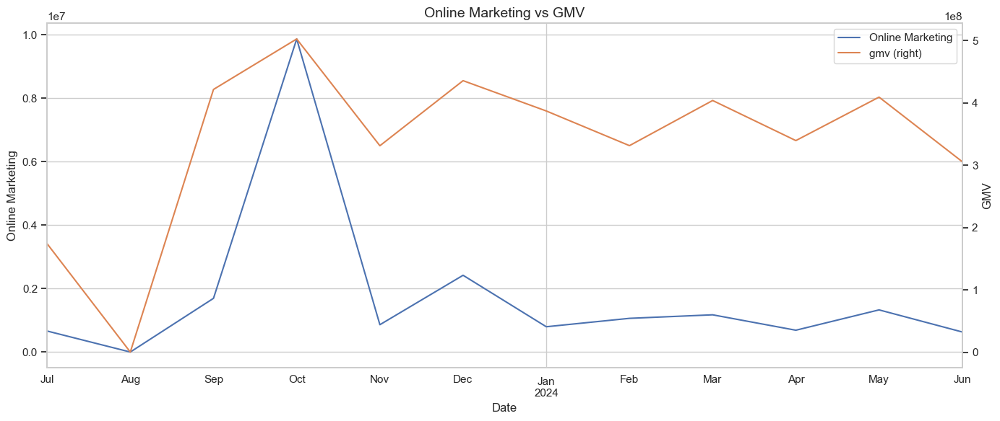

In [58]:
# Plot Online Marketing vs GMV specifically
if 'Online Marketing' not in monthly_df.columns:
    # Check if Digital or other online marketing channels exist
    digital_channels = ['Digital', 'SEM', 'Affiliates', 'Content Marketing']
    available_channels = [ch for ch in digital_channels if ch in monthly_df.columns]

    if available_channels:
        # Create Online Marketing column
        monthly_df['Online Marketing'] = monthly_df[available_channels].sum(axis=1)
        print(f"Created 'Online Marketing' column by combining: {available_channels}")
    else:
        print("Required digital marketing channels not found in data")

# Create the plot
if 'Online Marketing' in monthly_df.columns and 'gmv' in monthly_df.columns:
    fig, ax = plt.subplots(figsize=(14, 6))
    monthly_df.sort_values('Date').plot(x='Date', y=['Online Marketing', 'gmv'],
                                      secondary_y='gmv', ax=ax)
    ax.set_title('Online Marketing vs GMV', fontsize=14)
    ax.set_ylabel('Online Marketing')
    ax.right_ax.set_ylabel('GMV')
    plt.tight_layout()
    plt.savefig("online_marketing_vs_gmv.png", dpi=300, bbox_inches='tight')
    print("Saved online_marketing_vs_gmv.png")
    plt.show()
else:
    print("Cannot create plot: 'Online Marketing' or 'gmv' column not available")

Based on the provided graph, holiday data, and sales calendar, here are three insights:

1. **October Marketing and GMV Surge Linked to Thanksgiving and Halloween**: The graph shows a sharp increase in *Online Marketing* and *GMV* during October 2023. This aligns with major holidays like Thanksgiving (October 12) and Halloween (October 31), as well as the sales campaign from October 17-15. These events likely drove higher consumer engagement and purchases, explaining the spike.

2. **December Sales Impact on GMV Stability**: Despite a drop in *Online Marketing* during December 2023, *GMV* remains relatively high. This stability corresponds with Christmas (December 25), Boxing Day (December 26), and the extended sales campaign from December 25 to January 3, which likely sustained consumer spending even with reduced marketing efforts.

3. **February Marketing Efforts Yield Limited GMV Growth**: In February 2024, there is an increase in *Online Marketing*, coinciding with Valentine's Day (February 14) and multiple holidays like Islander Day and Family Day (February 15). However, the corresponding GMV growth is modest compared to October or December. This suggests that while marketing efforts were heightened, they did not generate a proportional impact on sales during this period.



Saved online_marketing_vs_gmv.png


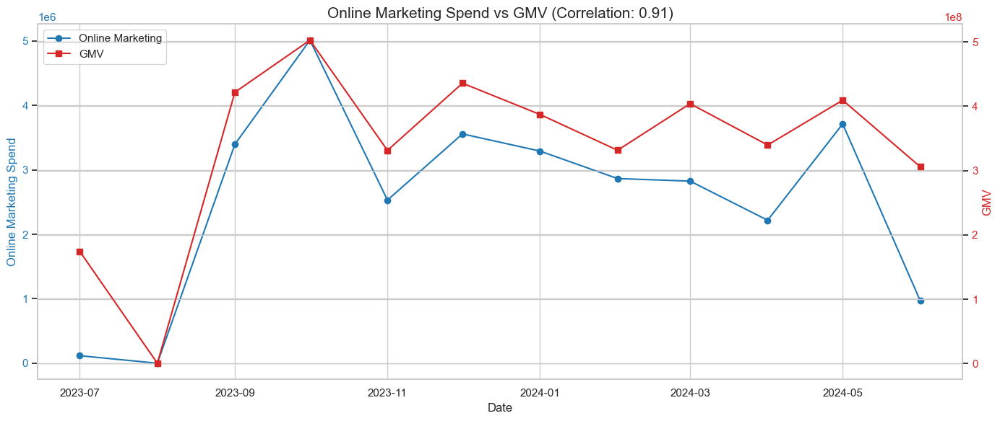

In [60]:
def plot_online_marketing_vs_gmv(monthly_file_path):
    """Plot Online Marketing spend vs GMV using data from the specified file path"""
    # Load the data directly from the specified file
    monthly_data = pd.read_csv(monthly_file_path)

    # Check for required columns - using the correct column name "Online marketing"
    if 'Online marketing' not in monthly_data.columns or 'gmv' not in monthly_data.columns:
        print(f"Columns found in file: {monthly_data.columns.tolist()}")
        print("Required columns not found in monthly data")
        return

    # Create a date column if not present
    if 'Date' not in monthly_data.columns:
        if 'Year' in monthly_data.columns and 'Month' in monthly_data.columns:
            monthly_data['Date'] = pd.to_datetime(monthly_data[['Year', 'Month']].assign(day=1))
        else:
            print("Cannot create Date column - Year/Month columns not found")
            return
    else:
        # Ensure Date is in datetime format
        monthly_data['Date'] = pd.to_datetime(monthly_data['Date'])

    # Create a figure
    fig, ax = plt.subplots(figsize=(14, 6))

    # Sort data by date
    monthly_data_sorted = monthly_data.sort_values('Date')

    # Plot Online Marketing on primary y-axis - using the correct column name
    color1 = 'tab:blue'
    ax.set_xlabel('Date')
    ax.set_ylabel('Online Marketing Spend', color=color1)
    ax.plot(monthly_data_sorted['Date'], monthly_data_sorted['Online marketing'],
            color=color1, marker='o', linestyle='-', label='Online Marketing')
    ax.tick_params(axis='y', labelcolor=color1)

    # Create secondary y-axis for GMV
    ax2 = ax.twinx()
    color2 = 'tab:red'
    ax2.set_ylabel('GMV', color=color2)
    ax2.plot(monthly_data_sorted['Date'], monthly_data_sorted['gmv'],
             color=color2, marker='s', linestyle='-', label='GMV')
    ax2.tick_params(axis='y', labelcolor=color2)

    # Create custom legend
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

    # Calculate correlation
    corr = monthly_data['Online marketing'].corr(monthly_data['gmv'])

    # Set title with correlation
    plt.title(f'Online Marketing Spend vs GMV (Correlation: {corr:.2f})', fontsize=15)

    plt.xticks(rotation=45)
    plt.tight_layout()

    # Save the figure
    plt.savefig("online_marketing_vs_gmv.png", dpi=300, bbox_inches='tight')
    print("Saved online_marketing_vs_gmv.png")

    return fig

# Use the correct file path directly
monthly_file_path = 'monthly_data_enhanced.csv'

# Import required libraries if not already imported
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Generate the plot
online_mkt_plot = plot_online_marketing_vs_gmv(monthly_file_path)

**October Marketing and GMV Surge Linked to Thanksgiving and Halloween:** The graph shows a sharp increase in Online Marketing and GMV during October 2023. This aligns with major holidays like Thanksgiving (October 12) and Halloween (October 31), as well as the sales campaign from October 17-15. These events likely drove higher consumer engagement and purchases, explaining the spike.

**December Sales Impact on GMV Stability:** Despite a drop in Online Marketing during December 2023, GMV remains relatively high. This stability corresponds with Christmas (December 25), Boxing Day (December 26), and the extended sales campaign from December 25 to January 3, which likely sustained consumer spending even with reduced marketing efforts.

**February Marketing Efforts Yield Limited GMV Growth:** In February 2024, there is an increase in Online Marketing, coinciding with Valentine's Day (February 14) and multiple holidays like Islander Day and Family Day (February 15). However, the corresponding GMV growth is modest compared to October or December. This suggests that while marketing efforts were heightened, they did not generate a proportional impact on sales during this period.

Correlations with GMV:
 Affiliates: 0.9239
Online marketing: 0.9111
TV: 0.7309
Sponsorship: 0.6822
Content Marketing: 0.5679
SEM: 0.5637
Digital: 0.4747
Radio: 0.2316
Other: 0.2236

Saved correlation heatmap as marketing_gmv_correlation_heatmap.png
Saved correlation bar chart as marketing_gmv_correlation_bars.png


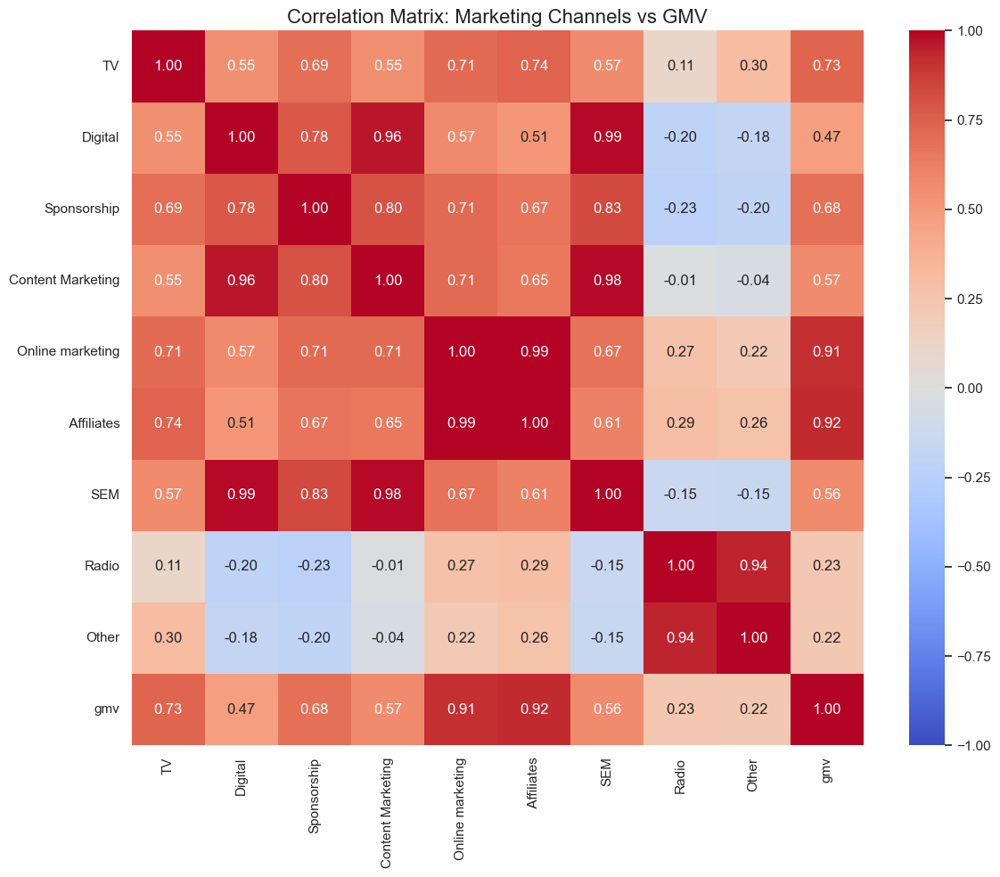

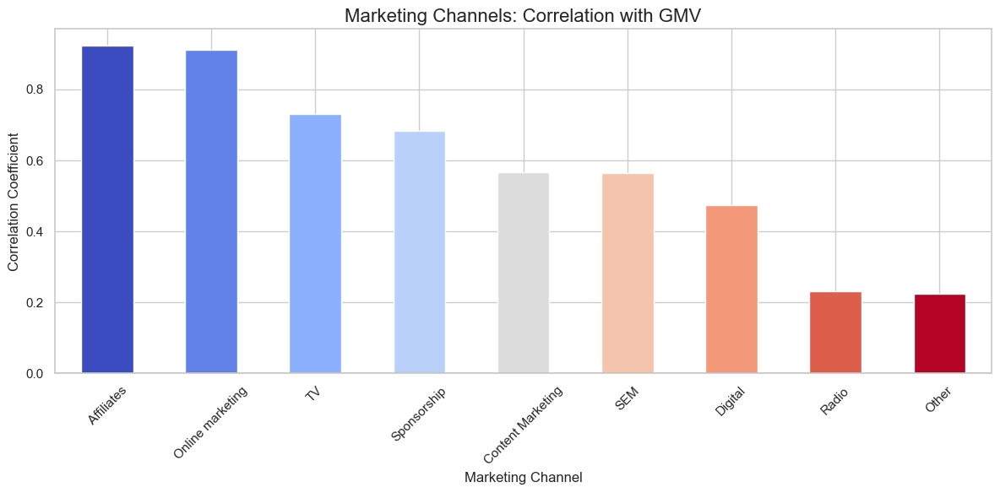

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Load the data
monthly_file_path = 'monthly_data_enhanced.csv'
monthly_data = pd.read_csv(monthly_file_path)

# Define marketing channels and GMV columns
marketing_channels = ['TV', 'Digital', 'Sponsorship', 'Content Marketing',
                      'Online marketing', ' Affiliates', 'SEM', 'Radio', 'Other']

# Select only marketing channels and GMV
correlation_df = monthly_data[marketing_channels + ['gmv']]

# Calculate correlation matrix
correlation_matrix = correlation_df.corr()

# Extract correlations with GMV and sort
gmv_correlations = correlation_matrix['gmv'].drop('gmv').sort_values(ascending=False)

# Print the correlations
print("Correlations with GMV:")
for channel, corr in gmv_correlations.items():
    print(f"{channel}: {corr:.4f}")

# Create correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f')
plt.title('Correlation Matrix: Marketing Channels vs GMV', fontsize=16)
plt.tight_layout()
plt.savefig("marketing_gmv_correlation_heatmap.png", dpi=300, bbox_inches='tight')
print("\nSaved correlation heatmap as marketing_gmv_correlation_heatmap.png")

# Create a bar chart of correlations with GMV
plt.figure(figsize=(12, 6))
gmv_correlations.plot(kind='bar', color=plt.cm.coolwarm(np.linspace(0, 1, len(gmv_correlations))))
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
plt.title('Marketing Channels: Correlation with GMV', fontsize=16)
plt.xlabel('Marketing Channel')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("marketing_gmv_correlation_bars.png", dpi=300, bbox_inches='tight')
print("Saved correlation bar chart as marketing_gmv_correlation_bars.png")

1. High Impact Channels: Online Marketing and Affiliates show the strongest positive correlation with GMV (0.91 and 0.92 respectively), making them crucial for driving sales. TV Advertising and Sponsorship also have significant positive correlations, though less strong.

2. Synergistic Channels: Channels like Digital Marketing, Content Marketing, and SEM have strong inter-correlations, suggesting they often work together effectively. Combining strategies for these channels can enhance efficiency.

3. Optimization Opportunities: Radio has limited effectiveness and synergy with other channels, suggesting a need to reassess its role. Meanwhile, maintaining a moderate focus on TV Advertising and Sponsorship is advisable due to their positive, though moderate, impact on GMV.

## eda 3

In [63]:
df=pd.read_csv('datewise_fsn_data.csv',index_col=[0])

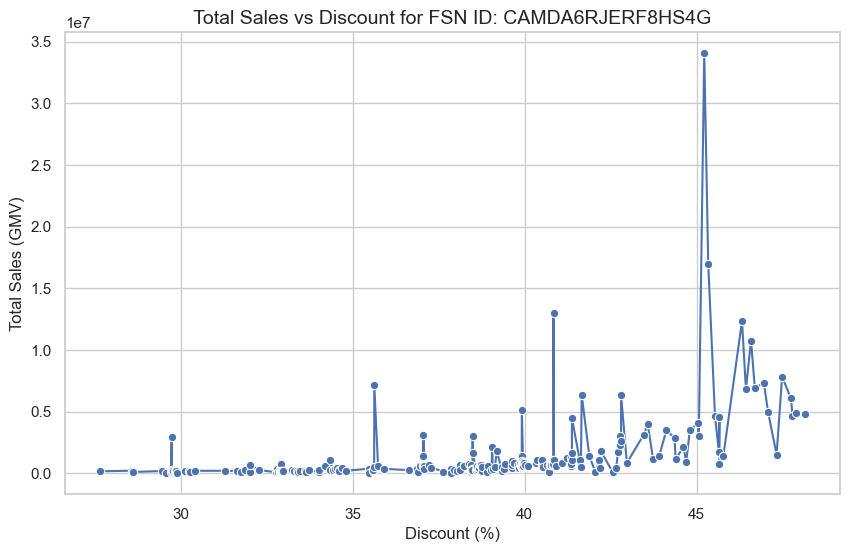

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt

# Choose a specific fsn_id (replace with an actual fsn_id from your dataset)
fsn_id_to_analyze = "CAMDA6RJERF8HS4G"  # Example ID, change as needed

# Filter data for the selected fsn_id
df_fsn = df[df["fsn_id"] == fsn_id_to_analyze]

# Aggregate total sales (GMV) per discount level
df_fsn_grouped = df_fsn.groupby("discount")["gmv"].sum().reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_fsn_grouped, x="discount", y="gmv", marker="o")

# Labels and title
plt.xlabel("Discount (%)", fontsize=12)
plt.ylabel("Total Sales (GMV)", fontsize=12)
plt.title(f"Total Sales vs Discount for FSN ID: {fsn_id_to_analyze}", fontsize=14)

# Show plot
plt.show()



1. Identify Optimal Discount Ranges: Sales tend to increase with higher discounts, particularly around the 40-45% range. This suggests that offering discounts within this range can significantly boost sales.

2. Recognize Sales Spikes: Noticeable spikes in sales occur at specific discount levels, such as around 35% and especially at 45%. These levels may be optimal for maximizing sales or align with promotional events.

3. Analyze Fluctuations Beyond Optimal Ranges: Beyond the 45% discount level, sales exhibit fluctuations, including drops and smaller peaks. This could indicate diminishing returns from further discount increases or be influenced by factors like stock availability and marketing efforts

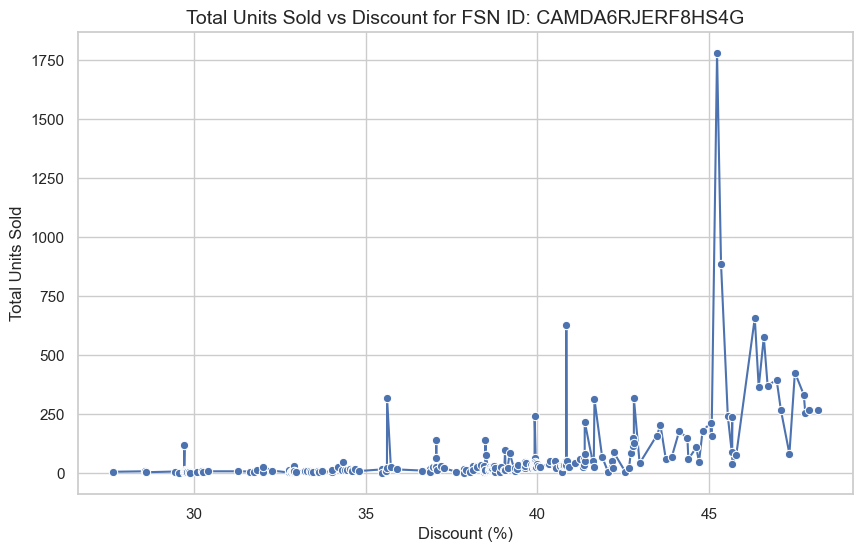

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Choose a specific fsn_id (replace with an actual fsn_id from your dataset)
fsn_id_to_analyze = "CAMDA6RJERF8HS4G"  # Example ID, change as needed

# Filter data for the selected fsn_id
df_fsn = df[df["fsn_id"] == fsn_id_to_analyze]

# Aggregate total units sold per discount level
df_fsn_grouped = df_fsn.groupby("discount")["units"].sum().reset_index()

# Plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_fsn_grouped, x="discount", y="units", marker="o")

# Labels and title
plt.xlabel("Discount (%)", fontsize=12)
plt.ylabel("Total Units Sold", fontsize=12)
plt.title(f"Total Units Sold vs Discount for FSN ID: {fsn_id_to_analyze}", fontsize=14)

# Show plot
plt.show()



In [66]:
df= pd.read_csv("cleaned_data.csv")
df.drop_duplicates(inplace=True)

In [67]:


# Convert order_date to datetime format
df["order_date"] = pd.to_datetime(df["order_date"])

# Extract month and year
df["month_year"] = df["order_date"].dt.to_period("M")

# Count total sale days per month (sum of sale_day where 1 indicates a sale)
sale_days_per_month = df.groupby("month_year")["sale_day"].sum().reset_index()

# Get unique monthly NPS scores (assuming NPS score is constant for the month)
nps_per_month = df.groupby("month_year")["NPS"].mean().reset_index()

# Merge both dataframes
df_monthly_sales_nps = pd.merge(sale_days_per_month, nps_per_month, on="month_year")

# Display the constructed dataframe
print(df_monthly_sales_nps)


   month_year  sale_day        NPS
0     2023-07      6699  54.599588
1     2023-08        11  59.987101
2     2023-09         0  46.925419
3     2023-10     94650  44.398389
4     2023-11     43926  47.000000
5     2023-12     30669  45.800000
6     2024-01     36733  47.093031
7     2024-02     28568  50.327406
8     2024-03     26124  49.020550
9     2024-04         0  51.827605
10    2024-05     26107  47.306951
11    2024-06         0  50.516687


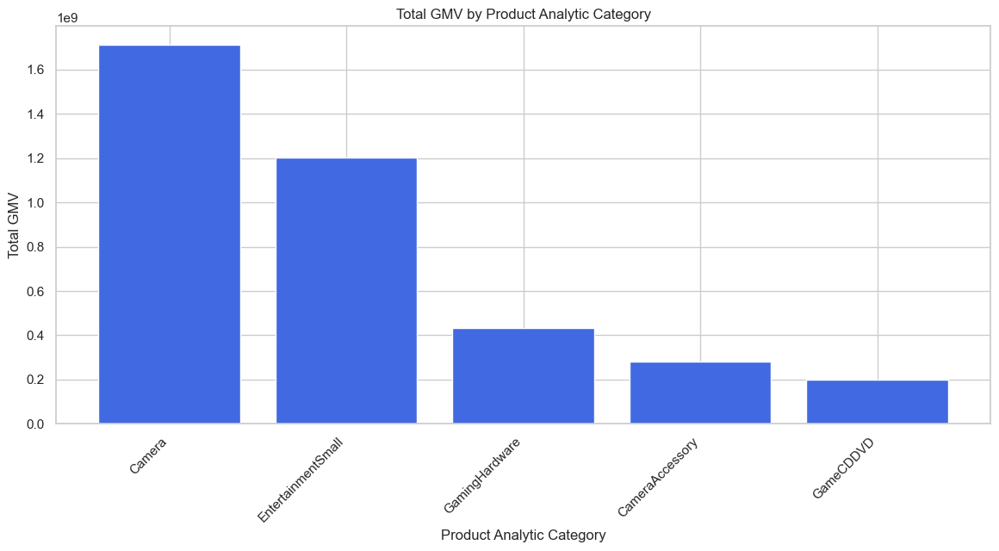

In [68]:
# Group by product_analytic_category and sum the GMV
gmv_by_category = df.groupby("product_analytic_category")["gmv"].sum().reset_index()

# Sort categories by GMV for better visualization
gmv_by_category = gmv_by_category.sort_values(by="gmv", ascending=False)

# Plot the bar chart
plt.figure(figsize=(14, 6))
plt.bar(gmv_by_category["product_analytic_category"], gmv_by_category["gmv"], color='royalblue')

# Add labels and title
plt.xlabel("Product Analytic Category")
plt.ylabel("Total GMV")
plt.title("Total GMV by Product Analytic Category")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability

# Show the plot
plt.show()

1. Highest Revenue Categories: The Camera category leads with a GMV exceeding 1.6 billion, followed by EntertainmentSmall with approximately 1.2 billion. These categories should be prioritized for marketing and inventory management due to their high revenue generation.

2. Moderate and Growth Potential: GamingHardware ranks third, offering moderate profitability and potential for growth through targeted promotions or product diversification. This category could benefit from strategic investments to enhance its revenue contribution.

3. Low Revenue Categories: CameraAccessory and GameCDDVD have the lowest GMVs, indicating a need for strategic interventions such as bundling with high-performing products or offering discounts to boost sales and improve their revenue contribution

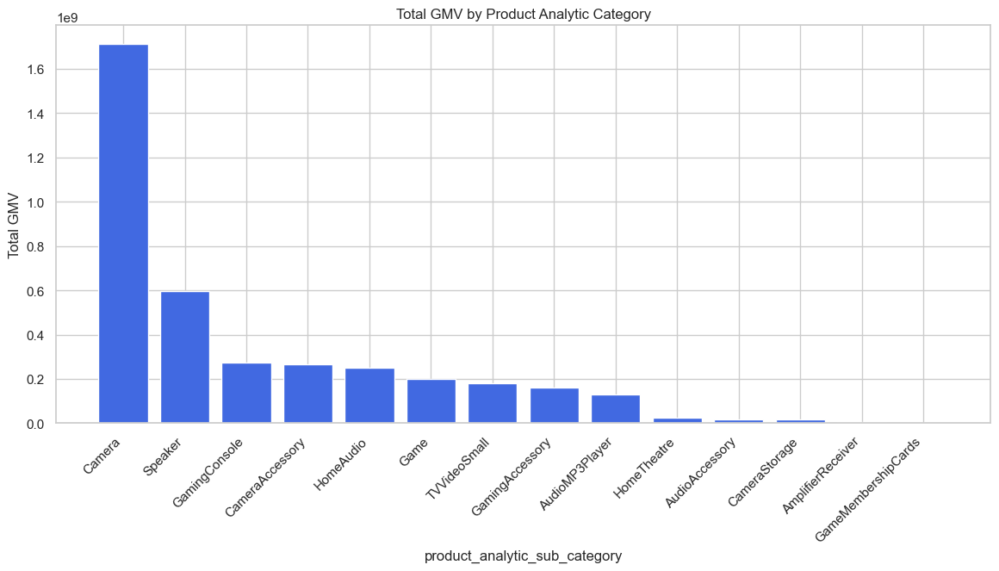

In [69]:
# Group by product_analytic_category and sum the GMV
gmv_by_category = df.groupby("product_analytic_sub_category")["gmv"].sum().reset_index()

# Sort categories by GMV for better visualization
gmv_by_category = gmv_by_category.sort_values(by="gmv", ascending=False)

# Plot the bar chart
plt.figure(figsize=(14, 6))
plt.bar(gmv_by_category["product_analytic_sub_category"], gmv_by_category["gmv"], color='royalblue')

# Add labels and title
plt.xlabel("product_analytic_sub_category")
plt.ylabel("Total GMV")
plt.title("Total GMV by Product Analytic Category")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability

# Show the plot
plt.show()

1. **Dominance of Cameras in GMV:** The "Camera" category significantly outperforms all other product analytic subcategories in terms of Gross Merchandise Value (GMV), contributing over 1.6 billion, making it the most lucrative category by a wide margin.

2. **Speakers as a Secondary Driver:** The "Speaker" category ranks second, with a GMV slightly above 0.6 billion. While it performs well, its contribution is less than half of the "Camera" category's GMV.

3. **Relatively Balanced Mid-Tier Categories:** Categories like "Gaming Console," "Camera Accessory," "Home Audio," and "Game" show similar GMV contributions, clustering around 0.2–0.3 billion. These mid-tier categories collectively form a significant portion of the total GMV but are far behind the top two categories.

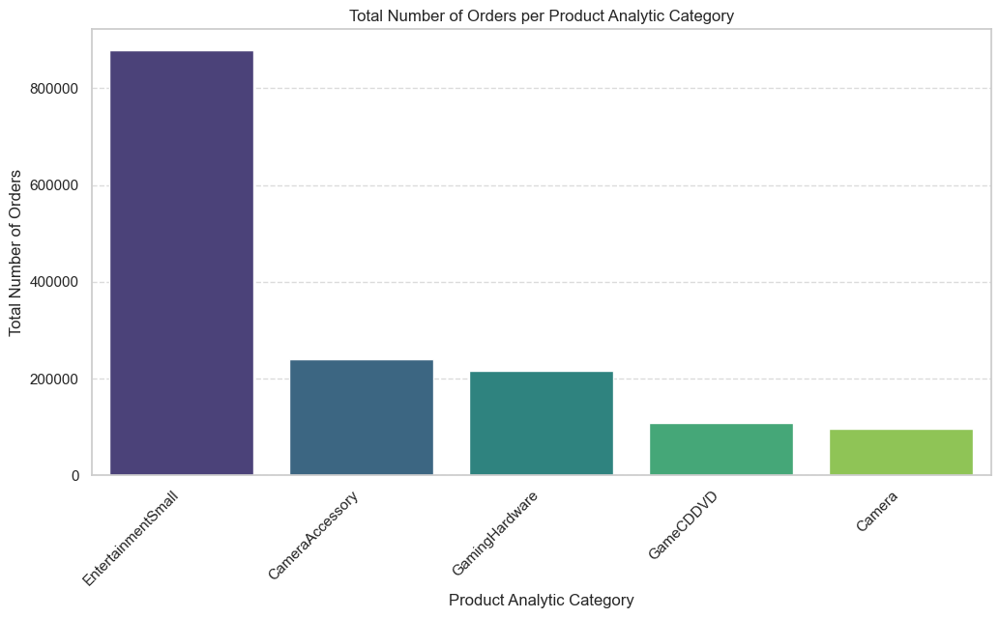

In [70]:
orders_per_category = df.groupby("product_analytic_category")["order_id"].count().reset_index()
orders_per_category = orders_per_category.sort_values(by="order_id", ascending=False)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=orders_per_category["product_analytic_category"], y=orders_per_category["order_id"], palette="viridis")

# Labels and title
plt.xlabel("Product Analytic Category")
plt.ylabel("Total Number of Orders")
plt.title("Total Number of Orders per Product Analytic Category")
plt.xticks(rotation=45, ha="right")  # Rotate x-axis labels for better readability
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

Inference: EntertainmentSmall has most products sold.


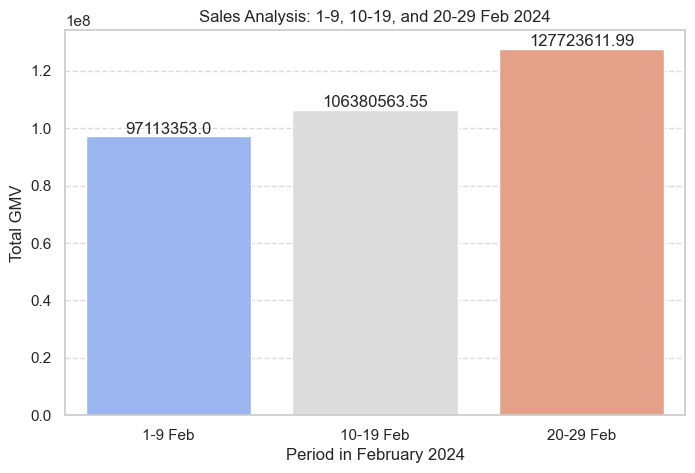

In [71]:
df['order_date'] = pd.to_datetime(df['order_date'])

# Filter for February 2024
feb_sales = df[(df['order_date'].dt.year == 2024) & (df['order_date'].dt.month == 2)]

# Create 'period' column (0-9, 10-19, 20-29)
def assign_period(day):
    if 1 <= day <= 9:
        return '1-9 Feb'
    elif 10 <= day <= 19:
        return '10-19 Feb'
    else:
        return '20-29 Feb'

feb_sales['period'] = feb_sales['order_date'].dt.day.apply(assign_period)

# Group by 'period' and sum GMV
period_sales = feb_sales.groupby('period')['gmv'].sum().reset_index()
period_sales.rename(columns={'gmv': 'total_gmv'}, inplace=True)

# Sorting period to maintain order
period_sales['period'] = pd.Categorical(period_sales['period'], categories=['1-9 Feb', '10-19 Feb', '20-29 Feb'], ordered=True)
period_sales = period_sales.sort_values('period')

# Plotting the sales trend
plt.figure(figsize=(8, 5))
sns.barplot(data=period_sales, x='period', y='total_gmv', palette='coolwarm')

# Annotate values on bars
for index, row in period_sales.iterrows():
    plt.text(index, row.total_gmv, round(row.total_gmv, 2), ha='center', va='bottom', fontsize=12)

plt.xlabel("Period in February 2024")
plt.ylabel("Total GMV")
plt.title("Sales Analysis: 1-9, 10-19, and 20-29 Feb 2024")
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

**Special Case of February:** Sale days were observed 3 times during this month and alongwith this many holidays were also reported this month.
Sale was observed during these days
(1-2 Feb)
(20-21 Feb)
(14-15 Feb)
and holidays on 14,15 and 29Feb


The bar graph compares the total units sold across different product categories during sale days and non-sale days. Here are the key insights:

**1. Higher Sales on Non-Sale Days for Most Categories**
EntertainmentSmall: This category has the highest sales overall, with 716,449 units sold on non-sale days compared to 174,314 units on sale days. This indicates that customers purchase this category more frequently even without discounts.

CameraAccessory: Similarly, non-sale day sales (205,253 units) significantly outpace sale day sales (37,809 units).

GamingHardware: Non-sale day sales (182,738 units) are much higher than sale day sales (40,400 units).

**2. Sale Days Boost Sales in Certain Categories**
GameCDDVD: While non-sale day sales (91,074 units) are higher, the gap between sale day sales (19,319 units) and non-sale day sales is smaller compared to other categories.

Camera: Sale days have a noticeable but smaller impact, with 27,434 units sold during sale days versus 69,100 units on non-sale days.

Inference:
Sale during August was a flop, as total of only 11 units were sold during the sale.


Investments were barely made in TV, ContentMarketing and online marketing.
We witnessed a steep increase in sales of all the product categories as investments increase in ContentMarketing,OnlineMarketing,Digital and TV in month of October.




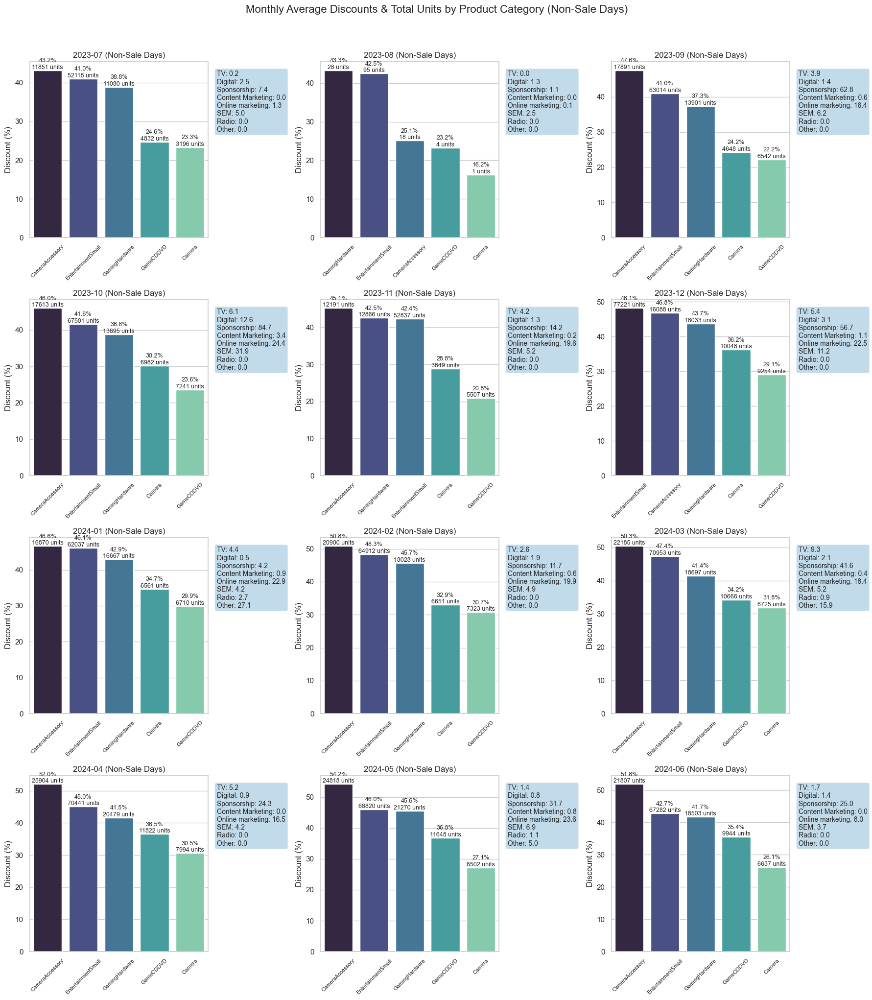

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np



# Convert order_date to datetime
df['order_date'] = pd.to_datetime(df['order_date'])

# Filter dataset for non-sale days
non_sale_days_df = df[df['sale_day'] == 0]  # Adjust this column name if different

# Group by month-year and product_analytic_category, calculate average discount and total units sold
non_sale_monthly_data = non_sale_days_df.groupby(['month_year', 'product_analytic_category']).agg(
    avg_discount=('discount', 'mean'),
    total_units=('units', 'sum')
).reset_index()

# Get unique months for plotting
non_sale_months = sorted(non_sale_monthly_data['month_year'].unique())

# Define grid size
num_non_sale_months = len(non_sale_months)
cols = min(3, num_non_sale_months)  # Maximum 3 columns
rows = (num_non_sale_months + cols - 1) // cols  # Compute required rows

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))

# Flatten axes array for easy iteration
if num_non_sale_months == 1:
    axes = np.array([axes])
axes = axes.flatten()

# Iterate through non-sale months and create plots
for i, month in enumerate(non_sale_months):
    if i < len(axes):
        # Filter data for the current month
        month_data = non_sale_monthly_data[non_sale_monthly_data['month_year'] == month].sort_values('avg_discount', ascending=False)

        # Create bar plot
        ax = sns.barplot(
            x='product_analytic_category', y='avg_discount', data=month_data, palette="mako", ax=axes[i]
        )

        # Set titles and labels
        ax.set_title(f"{month} (Non-Sale Days)")
        ax.set_xlabel("")
        ax.set_ylabel("Discount (%)")

        # Rotate x-axis labels
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=8)

        # Annotate bars with both discount percentage and total units sold
        for p, units in zip(ax.patches, month_data['total_units']):
            ax.annotate(f"{p.get_height():.1f}%\n{int(units)} units",
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='bottom', fontsize=9, rotation=0)

        # Extract and format investment annotations
        investment_cols = ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other']
        investment_row = df[df['month_year'] == month].iloc[0]
        investment_text = "\n".join([f"{inv}: {investment_row[inv]:.1f}" for inv in investment_cols if inv in investment_row])

        # Add investment text to top right corner with extra space
        ax.text(1.05, 0.95, investment_text, transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='left', bbox=dict(boxstyle='round', alpha=0.3))

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Set the main title
plt.suptitle("Monthly Average Discounts & Total Units by Product Category (Non-Sale Days)", fontsize=16, y=1.02)

# Adjust layout and save
plt.tight_layout()
plt.savefig("monthly_discount_units_non_sale_days.png", dpi=300, bbox_inches="tight")
plt.show()

This is the month-wise analysis of sales of different product categories during non-sale days, and how discount and investment channels have driven their sale.


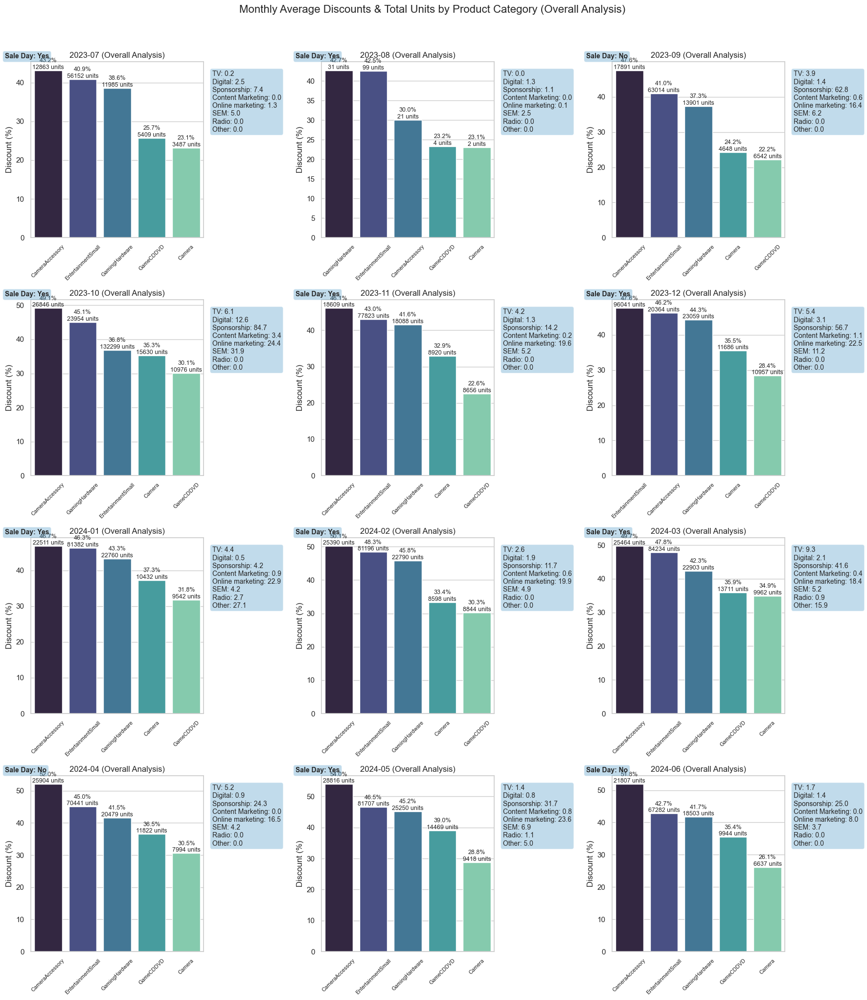

In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np



# Convert order_date to datetime
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract month-year for aggregation
df['month_year'] = df['order_date'].dt.to_period('M').astype(str)

# Group data without distinguishing sale/non-sale days
monthly_data = df.groupby(['month_year', 'product_analytic_category']).agg(
    avg_discount=('discount', 'mean'),
    total_units=('units', 'sum')
).reset_index()

months = sorted(monthly_data['month_year'].unique())
num_months = len(months)
cols = min(3, num_months)  # Maximum 3 columns
rows = (num_months + cols - 1) // cols  # Compute required rows

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
if num_months == 1:
    axes = np.array([axes])
axes = axes.flatten()

for i, month in enumerate(months):
    if i < len(axes):
        month_data = monthly_data[monthly_data['month_year'] == month].sort_values('avg_discount', ascending=False)
        ax = sns.barplot(
            x='product_analytic_category', y='avg_discount', data=month_data, palette="mako", ax=axes[i]
        )
        ax.set_title(f"{month} (Overall Analysis)")
        ax.set_xlabel("")
        ax.set_ylabel("Discount (%)")
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=8)

        for p, units in zip(ax.patches, month_data['total_units']):
            ax.annotate(f"{p.get_height():.1f}%\n{int(units)} units",
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='bottom', fontsize=9, rotation=0)

        investment_cols = ['TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other']
        investment_row = df[df['month_year'] == month].iloc[0]
        investment_text = "\n".join([f"{inv}: {investment_row[inv]:.1f}" for inv in investment_cols if inv in investment_row])
        ax.text(1.05, 0.95, investment_text, transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='left', bbox=dict(boxstyle='round', alpha=0.3))

        # Check if there was a sale in the month
        sale_occurred = (df[df['month_year'] == month]['sale_day'] == 1).any()
        sale_text = "Sale Day: Yes" if sale_occurred else "Sale Day: No"
        ax.text(-0.15, 1.05, sale_text, transform=ax.transAxes, fontsize=10, fontweight='bold',
                verticalalignment='top', horizontalalignment='left', bbox=dict(boxstyle='round', alpha=0.3))

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Monthly Average Discounts & Total Units by Product Category (Overall Analysis)", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("monthly_discount_units_overall.png", dpi=300, bbox_inches="tight")
plt.show()


These graph show month-wise analysis of sales of product categories and how investment channels and discounts have driven the sales of each product category.


In [79]:
# Define date range
start_dates = ["2023-08-15", "2023-08-28"]
end_dates = ["2023-08-17", "2023-08-30"]

# Convert to datetime
start_dates = pd.to_datetime(start_dates)
end_dates = pd.to_datetime(end_dates)

# Filter rows within the date ranges
filtered_df = df[
    ((df['order_date'] >= start_dates[0]) & (df['order_date'] <= end_dates[0])) |
    ((df['order_date'] >= start_dates[1]) & (df['order_date'] <= end_dates[1]))
]

# Display filtered rows
print(filtered_df)


                 fsn_id order_date      order_id  order_item_id      gmv  \
87882  ACCE8FTBQ7H5FSCV 2023-08-15  3.381988e+15   3.000373e+17    299.0   
87884  ACCEFVKDFQB5Q3ZZ 2023-08-16  3.390692e+15   3.390692e+15   1840.0   
87886  ACCDXEGXG8HJUCSK 2023-08-17  1.781545e+08   2.246488e+08    689.0   
87907  CAMDA6RJERF8HS4G 2023-08-28  3.381988e+15   3.000373e+17  24500.0   
87908  ACCE9YXYBK37HZAP 2023-08-28  3.381470e+15   3.381470e+15    319.0   
87909  ACCE2K4QBH5NM2Q3 2023-08-28  3.381988e+15   3.000373e+17   2030.0   
87913  ACCDF2Z7KXGSZEP7 2023-08-29  3.391016e+15   3.391016e+15    295.0   
87915  ACCCX3SUEACQJ2QG 2023-08-30  3.381988e+15   3.000373e+17    138.0   
87917  ACCDYFXZ6QEUZEFZ 2023-08-30  3.381988e+15   3.000373e+17   1435.0   
87919  AMREYV2KT7TZY3AU 2023-08-30  2.378843e+15   2.378843e+15   1275.0   
87920  ACCE7U2GBCJKQZZV 2023-08-30  1.405412e+15   1.405412e+15    285.0   

       units  deliverybdays  deliverycdays order_payment_type  sla  ...  \
87882      1

Percentage Distribution of Luxury vs. Mass-market by Payment Mode:

order_payment_type        COD    Prepaid
product_type                            
Luxury              59.579406  40.420594
Mass-market         75.321606  24.678394


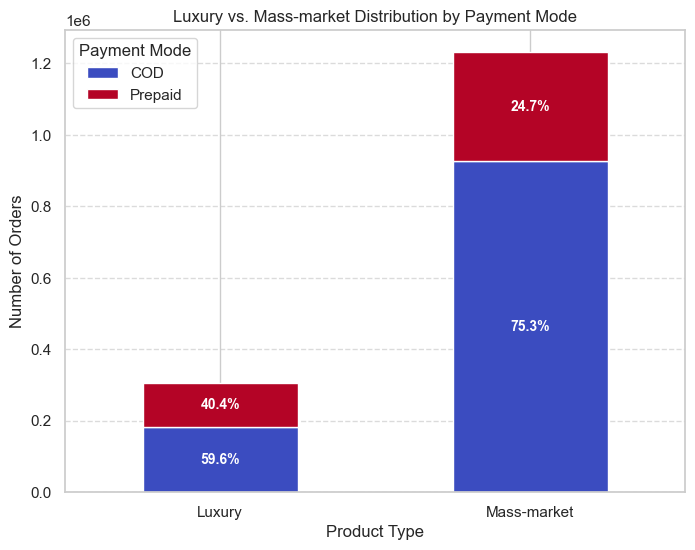

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the 80th percentile of GMV
gmv_threshold = df['gmv'].quantile(0.80)

# Categorize into Luxury and Mass-market
df['product_type'] = df['gmv'].apply(lambda x: 'Luxury' if x > gmv_threshold else 'Mass-market')

# Count occurrences of each payment method for each product type
product_payment_counts = df.groupby(['product_type', 'order_payment_type']).size().unstack()

# Calculate percentage distribution
percentage_distribution = product_payment_counts.div(product_payment_counts.sum(axis=1), axis=0) * 100

# Print percentage distribution
print("Percentage Distribution of Luxury vs. Mass-market by Payment Mode:\n")
print(percentage_distribution)

# Plot stacked bar chart
ax = product_payment_counts.plot(kind='bar', stacked=True, colormap='coolwarm', figsize=(8, 6))

# Labels and title
plt.xlabel("Product Type")
plt.ylabel("Number of Orders")
plt.title("Luxury vs. Mass-market Distribution by Payment Mode")
plt.xticks(rotation=0)
plt.legend(title="Payment Mode")
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add percentage annotations on bars
for i, (index, row) in enumerate(percentage_distribution.iterrows()):
    total = product_payment_counts.loc[index].sum()
    y_offset = 0
    for col in product_payment_counts.columns:
        value = product_payment_counts.loc[index, col]
        percentage = percentage_distribution.loc[index, col]
        if value > 0:
            ax.text(i, y_offset + value / 2, f"{percentage:.1f}%", ha='center', va='center', fontsize=10, color='white', fontweight='bold')
        y_offset += value

# Show plot
plt.show()



This is distribution of COD and Prepaid orders across luxury and mass market items.
Thus irrespective of luxury and mass market product type, no. of COD order is laways greater than prepaid

1. COD is the dominant payment mode across both luxury and mass-market products, with stronger dominance in mass-market (87.6%) than luxury (78.5%).

2. Luxury products show a slightly higher inclination towards prepaid payments (21.5%) compared to mass-market (12.4%), possibly indicating higher financial confidence or trust.

3. Mass-market products have a significantly higher total order volume, demonstrating broader consumer demand and preference for affordable, flexible payment options.


##eda4

In [81]:
path = 'Sheet 1-reduced_dataset_fixed.csv'
c_orders = pd.read_csv(path)

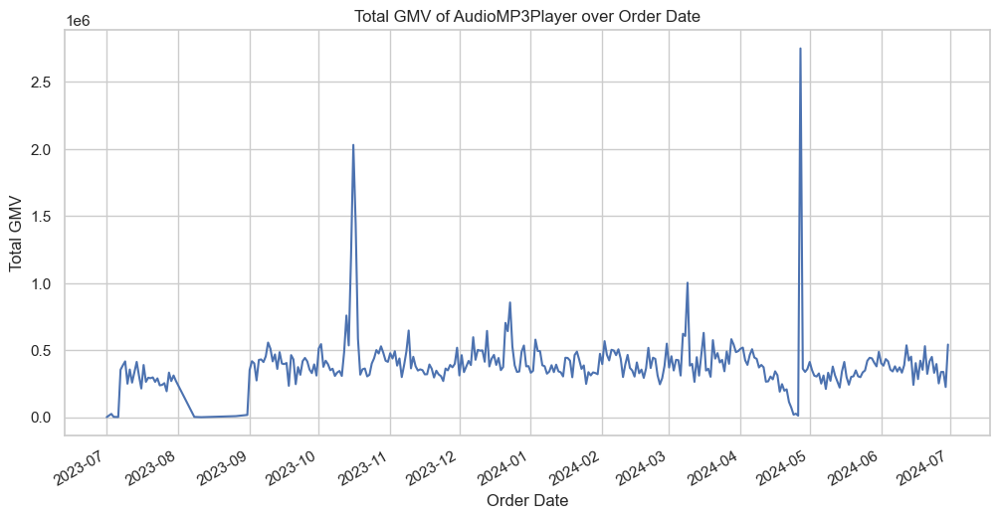

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assuming 'c_orders' DataFrame is already loaded as in the previous code

# Filter data for AudioMP3Player from product_analytic_vertical
audio_mp3_data = c_orders[(c_orders['product_analytic_vertical'] == 'AudioMP3Player')]

# Convert 'order_date' to datetime objects
audio_mp3_data['order_date'] = pd.to_datetime(audio_mp3_data['order_date'])

# Group by 'order_date' and sum 'total_gmv'
gmv_by_date = audio_mp3_data.groupby('order_date')['total_gmv'].sum()

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(gmv_by_date.index, gmv_by_date.values)
plt.xlabel('Order Date')
plt.ylabel('Total GMV')
plt.title('Total GMV of AudioMP3Player over Order Date')

# Format the x-axis to show monthly labels without overlapping
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gcf().autofmt_xdate() # Rotate date labels for better readability

plt.show()


1. **Major GMV Spikes During Key Holidays:** The highest GMV spikes occurred in November 2023 and May 2024 (Victoria Day sales), indicating strong consumer interest during holiday-driven shopping events.

2. **Steady Growth with Seasonal Patterns:** GMV showed gradual growth from July to October 2023, driven by smaller sales events like Civic Holiday and Labour Day, followed by stabilization after the November peak, with minor increases during Christmas and Boxing Day.

3. **Impact of Sales Events and Periodic Dips:** Modest GMV increases were observed during smaller sales events (e.g., August and October), while a noticeable dip occurred in April 2024, likely due to the absence of major holidays or promotions

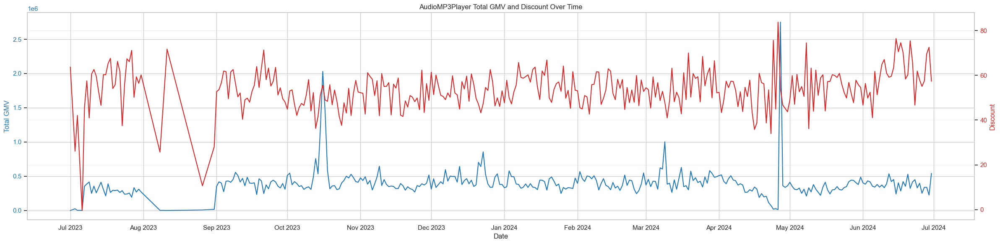

In [83]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime

# Filter for AudioMP3Player products
audio_df = audio_mp3_data.copy()

# Group by order_date and sum the values
grouped_df = audio_df.groupby('order_date').agg({
    'total_gmv': 'sum',
    'discount': 'mean'  # Using mean for discount as it's likely a percentage
}).reset_index()

# Create the plot with two y-axes
fig, ax1 = plt.subplots(figsize=(24, 6))

# Plot total_gmv on the first axis
color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('Total GMV', color=color)
ax1.plot(grouped_df['order_date'], grouped_df['total_gmv'], color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Create a second y-axis for discount
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Discount', color=color)
ax2.plot(grouped_df['order_date'], grouped_df['discount'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Format x-axis to show monthly labels
ax1.xaxis.set_major_locator(mdates.MonthLocator())
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.xticks(rotation=45)

# Add title and adjust layout
plt.title('AudioMP3Player Total GMV and Discount Over Time')
fig.tight_layout()
plt.grid(True, alpha=0.3)
plt.show()


The graph depicts the trends of Total GMV (Gross Merchandise Value) and Discounts over time for Audio MP3 Players, spanning from July 2023 to June 2024. Here are the key inferences:

**1. GMV Trends (Blue Line):**
Initial fluctuations: In July 2023, GMV starts with high volatility but stabilizes at a lower level by August 2023.

Gradual increase: From September 2023 onward, GMV shows a steady upward trend, peaking occasionally.

Sharp spike: A significant spike is observed in May 2024, indicating a possible promotional event or seasonal demand surge.

Post-spike stabilization: After May 2024, GMV stabilizes at a slightly higher level compared to earlier months.

**2. Discount Trends (Red Line):**
High discount levels: Discounts remain consistently high throughout the period, fluctuating between 60% and 80%.







In [84]:
# prompt: make a new dataframe with only 'Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
#     'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio', 'Other',
#     'sale_day', 'NPS', 'stock_index', 'total_gmv', 'total_units'

# Assuming 'c_orders' DataFrame is already loaded

# Create a list of columns to keep
columns_to_keep = ['Year', 'Month', 'Total Investment', 'TV', 'Digital', 'Sponsorship',
                   'Content Marketing', 'Online marketing', ' Affiliates', 'SEM', 'Radio', 'Other',
                   'sale_day', 'NPS', 'stock_index', 'total_gmv', 'total_units']

# Create a new DataFrame with selected columns
df = c_orders[columns_to_keep].copy()

# Display or use new_df
print(df.head()) # Example


     Year  Month  Total Investment       TV   Digital  Sponsorship  \
0  2023.0    7.0         17.061775  0.21533  2.533014      7.41427   
1  2023.0    7.0         17.061775  0.21533  2.533014      7.41427   
2  2023.0    7.0         17.061775  0.21533  2.533014      7.41427   
3  2023.0    7.0         17.061775  0.21533  2.533014      7.41427   
4  2023.0    7.0         17.061775  0.21533  2.533014      7.41427   

   Content Marketing  Online marketing   Affiliates       SEM  Radio  Other  \
0           0.000933          1.327278     0.547254  5.023697    0.0    0.0   
1           0.000933          1.327278     0.547254  5.023697    0.0    0.0   
2           0.000933          1.327278     0.547254  5.023697    0.0    0.0   
3           0.000933          1.327278     0.547254  5.023697    0.0    0.0   
4           0.000933          1.327278     0.547254  5.023697    0.0    0.0   

   sale_day        NPS  stock_index  total_gmv  total_units  
0       0.0  54.599588       1177.0      8

In [85]:
# Group by Month and calculate sum of total_gmv and total_units
monthly_aggregate = df.groupby('Month').agg({
    'total_gmv': 'sum',
    'total_units': 'sum'
}).reset_index()

# Display the result
monthly_aggregate

,Month,total_gmv,total_units
0,1.0,3.936127e+08,146144.0
1,2.0,3.340252e+08,145824.0
2,3.0,4.084351e+08,155560.0
3,4.0,3.432369e+08,136106.0
4,5.0,4.127913e+08,159266.0
5,6.0,3.097951e+08,123819.0
6,7.0,1.747922e+08,89264.0
7,8.0,2.299857e+05,157.0
8,9.0,2.118253e+08,105582.0
9,10.0,5.057825e+08,209108.0


In [86]:
inv = pd.read_csv("inv2.csv")

In [87]:
import pandas as pd
# Assuming 'monthly_aggregate' and 'inv' DataFrames are already loaded

# Merge the two DataFrames based on the 'Month' column
merged_df = pd.merge(monthly_aggregate, inv, on='Month', how='inner')

# Display the merged DataFrame
merged_df

,Month,total_gmv,total_units,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index
0,1.0,3.936127e+08,146144.0,74.2,4.4,0.5,4.2,0.9,22.9,7.4,4.2,2.7,27.1,47.1,1052
1,2.0,3.340252e+08,145824.0,48.1,2.6,1.9,11.7,0.6,19.9,6.5,4.9,NaN,NaN,50.3,1222
2,3.0,4.084351e+08,155560.0,100.0,9.3,2.1,41.6,0.4,18.4,6.2,5.2,0.9,15.9,49.0,1015
3,4.0,3.432369e+08,136106.0,56.8,5.2,0.9,24.3,0.0,16.5,5.7,4.2,NaN,NaN,51.8,1242
4,5.0,4.127913e+08,159266.0,78.1,1.4,0.8,31.7,0.8,23.7,6.8,6.9,1.1,5.0,47.3,1228
5,6.0,3.097951e+08,123819.0,42.8,1.7,1.4,25.0,0.0,8.0,2.8,3.7,NaN,NaN,50.5,1194
6,7.0,1.747922e+08,89264.0,17.1,0.2,2.5,7.4,0.0,1.3,0.5,5.0,NaN,NaN,54.6,1177
7,8.0,2.299857e+05,157.0,5.1,0.0,1.3,1.1,0.0,0.1,0.1,2.5,NaN,NaN,60.0,1206
8,9.0,2.118253e+08,105582.0,96.3,3.9,1.4,62.8,0.6,16.4,5.0,6.2,NaN,NaN,46.9,1101
9,10.0,5.057825e+08,209108.0,170.2,6.1,12.6,84.7,3.4,24.4,7.0,31.9,NaN,NaN,44.4,1210


In [88]:


# Assuming 'merged_df' DataFrame is already loaded

# Replace 0 values in the 'TV' column with 1e-6
merged_df['TV'] = merged_df['TV'].replace(0, 1e-6)

# Display the updated DataFrame (optional)
merged_df

,Month,total_gmv,total_units,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index
0,1.0,3.936127e+08,146144.0,74.2,4.400000,0.5,4.2,0.9,22.9,7.4,4.2,2.7,27.1,47.1,1052
1,2.0,3.340252e+08,145824.0,48.1,2.600000,1.9,11.7,0.6,19.9,6.5,4.9,NaN,NaN,50.3,1222
2,3.0,4.084351e+08,155560.0,100.0,9.300000,2.1,41.6,0.4,18.4,6.2,5.2,0.9,15.9,49.0,1015
3,4.0,3.432369e+08,136106.0,56.8,5.200000,0.9,24.3,0.0,16.5,5.7,4.2,NaN,NaN,51.8,1242
4,5.0,4.127913e+08,159266.0,78.1,1.400000,0.8,31.7,0.8,23.7,6.8,6.9,1.1,5.0,47.3,1228
5,6.0,3.097951e+08,123819.0,42.8,1.700000,1.4,25.0,0.0,8.0,2.8,3.7,NaN,NaN,50.5,1194
6,7.0,1.747922e+08,89264.0,17.1,0.200000,2.5,7.4,0.0,1.3,0.5,5.0,NaN,NaN,54.6,1177
7,8.0,2.299857e+05,157.0,5.1,0.000001,1.3,1.1,0.0,0.1,0.1,2.5,NaN,NaN,60.0,1206
8,9.0,2.118253e+08,105582.0,96.3,3.900000,1.4,62.8,0.6,16.4,5.0,6.2,NaN,NaN,46.9,1101
9,10.0,5.057825e+08,209108.0,170.2,6.100000,12.6,84.7,3.4,24.4,7.0,31.9,NaN,NaN,44.4,1210


NameError: name 'stats' is not defined

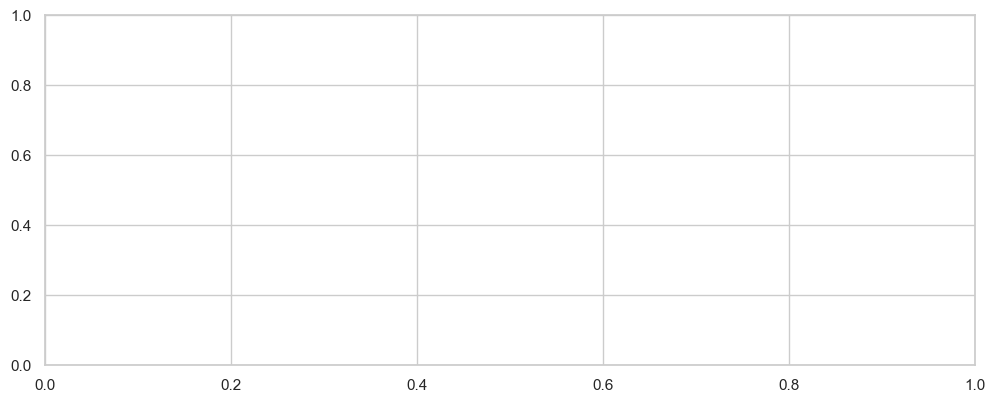

In [89]:
fig = plt.figure(figsize=(12, 10))
ax1 = fig.add_subplot(211)
x = merged_df['SEM']
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution')
#Using boxcox to transform the data so it’s closest to normal distribution
ax2 = fig.add_subplot(212)
merged_df['SEM'], _ = stats.boxcox(x)
prob = stats.probplot(merged_df['SEM'], dist=stats.norm, plot=ax2)
print("")
ax2.set_title('Probplot after Box-Cox transformation')

plt.show()

#  1.probability plot (Q-Q plot) comparing ordered values of a dataset against a normal distribution.
### The data deviates significantly from the normal distribution, especially at the higher end, indicating non-normality and potential skewness.

# 2.Probability Plot After Box-Cox Transformation
### The data points align closely with the red reference line, suggesting that the Box-Cox transformation has effectively normalized the data.




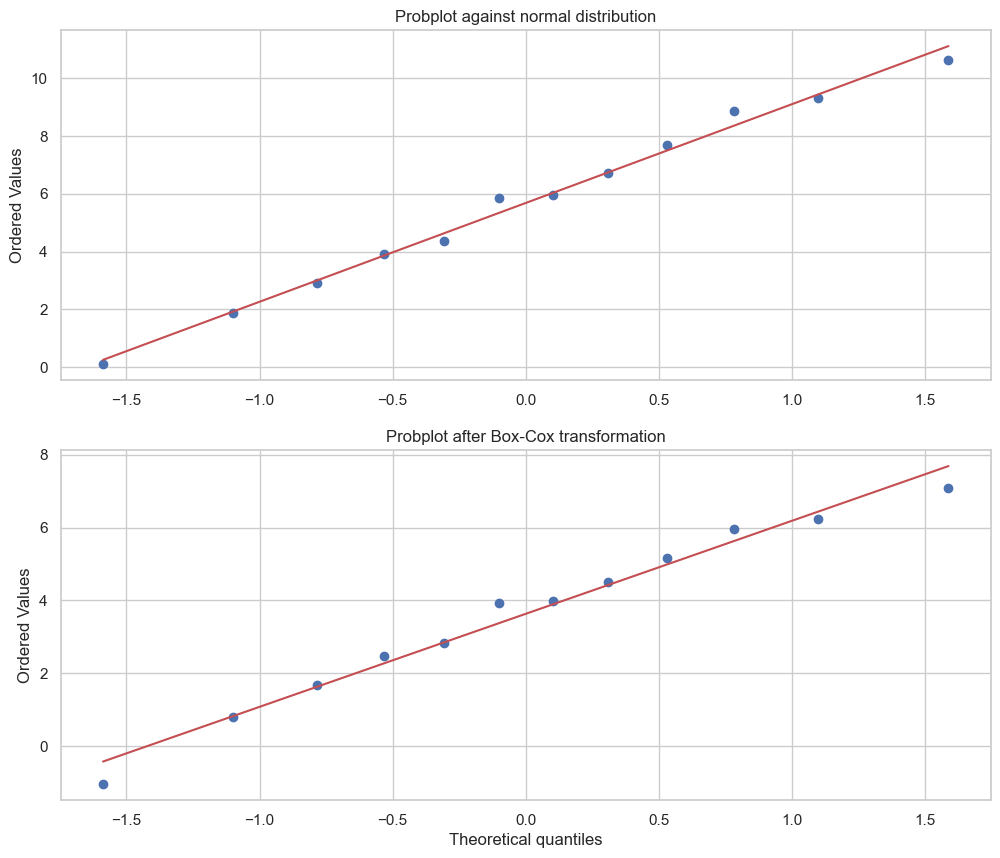

In [91]:
import matplotlib.pyplot as plt
from scipy import stats


fig = plt.figure(figsize=(12, 10))
ax1 = fig.add_subplot(211)
x = merged_df['Sponsorship']
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution')
#Using boxcox to transform the data so it’s closest to normal distribution
ax2 = fig.add_subplot(212)
merged_df['Sponsorship'], _ = stats.boxcox(x)
prob = stats.probplot(merged_df['Sponsorship'], dist=stats.norm, plot=ax2)
print("")
ax2.set_title('Probplot after Box-Cox transformation')

plt.show()

# Probability Plot After Box-Cox Transformation

## The data points align closely with the red reference line, suggesting that the Box-Cox transformation has effectively normalized the data.
## The transformation minimizes deviations at the tails, indicating that skewness in the original dataset has been addressed.


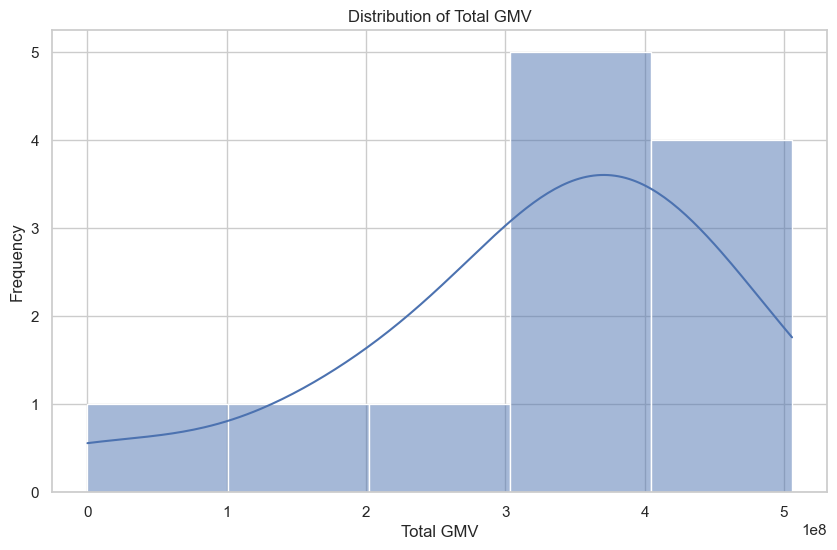

In [92]:
# prompt: find the distribution of total_gmv in merged_df

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'merged_df' is already loaded and available

# Plot the distribution of 'total_gmv'
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['total_gmv'], kde=True)  # kde=True adds a kernel density estimate
plt.title('Distribution of Total GMV')
plt.xlabel('Total GMV')
plt.ylabel('Frequency')
plt.show()


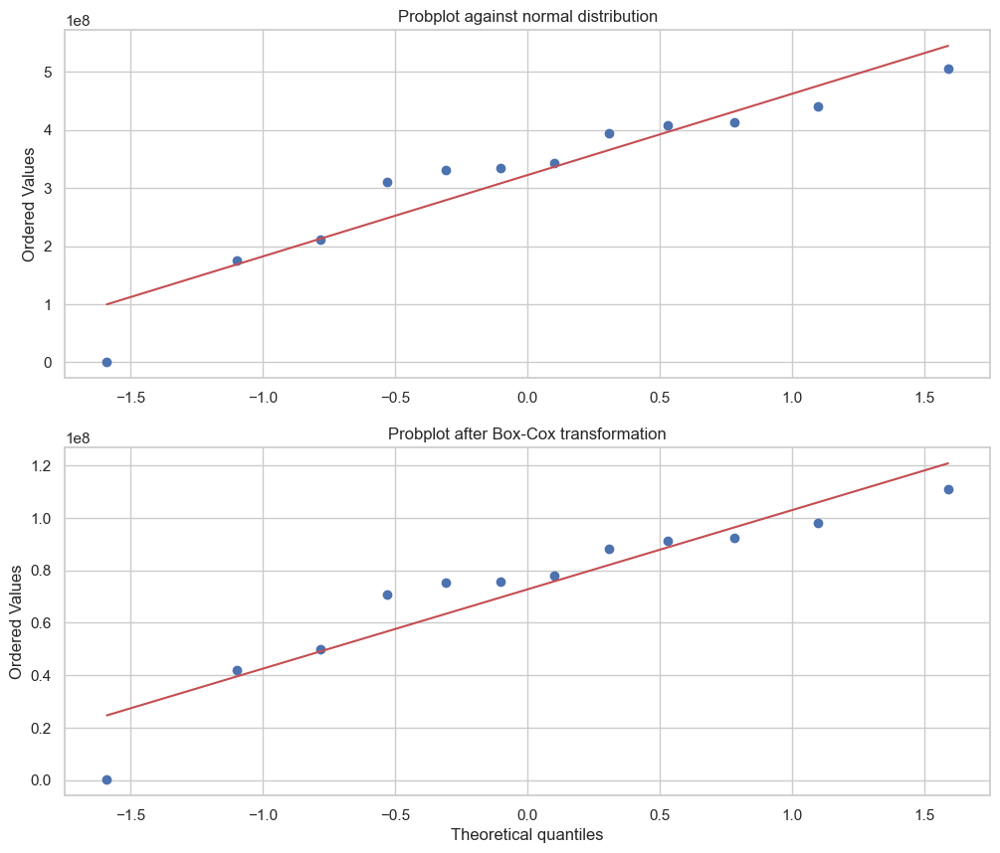

In [93]:
fig = plt.figure(figsize=(12, 10))
ax1 = fig.add_subplot(211)
x = merged_df['total_gmv']
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution')
#Using boxcox to transform the data so it’s closest to normal distribution
ax2 = fig.add_subplot(212)
merged_df['total_gmv'], _ = stats.boxcox(x)
prob = stats.probplot(merged_df['total_gmv'], dist=stats.norm, plot=ax2)
print("")
ax2.set_title('Probplot after Box-Cox transformation')

plt.show()

1. **Non-Normality of Original Data:** The original dataset does not follow a normal distribution, as evidenced by significant deviations in the Q-Q plot.

2. **Effectiveness of Box-Cox Transformation:** The Box-Cox transformation improved the normality of the dataset by addressing skewness and bringing the data closer to a normal distribution.

3. **Residual Non-Normality:** While the transformation helped, some deviations at extreme quantiles remain, suggesting further adjustments or transformations might be needed for complete normalization.

In [94]:
path = 'Customers_Orders_Data (1).csv'
c_orders_org = pd.read_csv(path)

In [95]:
path = 'Canada Holiday List.xlsx'
holidays = pd.read_excel(path)

In [96]:
c_orders = c_orders_org.copy()
c_orders.head(4)
# prompt: replace all '\N' in deliverybdays and deliverycdays with 0

c_orders['deliverybdays'] = c_orders['deliverybdays'].replace('\\N', 0)
c_orders['deliverycdays'] = c_orders['deliverycdays'].replace('\\N', 0)
# prompt: find number of unique cust_id

import pandas as pd
# Convert 'deliverybdays' and 'deliverycdays' to numeric
c_orders['deliverybdays'] = pd.to_numeric(c_orders['deliverybdays'], errors='coerce')
c_orders['deliverycdays'] = pd.to_numeric(c_orders['deliverycdays'], errors='coerce')

# Fill NaN values with 0 (you might want to consider other imputation strategies)
c_orders['deliverybdays'].fillna(0, inplace=True)
c_orders['deliverycdays'].fillna(0, inplace=True)

# Find the number of unique customer IDs
num_unique_cust_id = c_orders['cust_id'].nunique()
print(f"Number of unique customer IDs: {num_unique_cust_id}")
# Convert 'units', 'product_mrp', and 'gmv' columns to numeric, coercing errors to NaN
for col in ['units', 'product_mrp', 'gmv']:
    c_orders[col] = pd.to_numeric(c_orders[col], errors='coerce')
# prompt: remove all the duplicate rows

# Remove duplicate rows based on all columns
c_orders = c_orders.drop_duplicates()

# Print some info to verify
print(f"Number of rows after removing duplicates: {len(c_orders)}")
c_orders.info()
# prompt: find the gmv which are Nan

# Find rows where 'gmv' is NaN
nan_gmv_rows = c_orders[c_orders['gmv'].isna()]

# Print the rows with NaN 'gmv' values
print(nan_gmv_rows)

# You can also get the number of NaN values in the 'gmv' column
num_nan_gmv = c_orders['gmv'].isna().sum()
print(f"\nNumber of NaN values in 'gmv' column: {num_nan_gmv}")
# prompt: convert order_date of nan_gmv_rows to date type and remove the time

import pandas as pd
# Convert 'order_date' to datetime objects, handling errors
nan_gmv_rows['order_date'] = pd.to_datetime(nan_gmv_rows['order_date'], errors='coerce')

# Remove the time part from the 'order_date' column
nan_gmv_rows['order_date'] = nan_gmv_rows['order_date'].dt.date


Number of unique customer IDs: 1265011
Number of rows after removing duplicates: 1648824
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 15 columns):
 #   Column                   Non-Null Count    Dtype  
---  ------                   --------------    -----  
 0   Unnamed: 0               1648824 non-null  int64  
 1   fsn_id                   1648824 non-null  object 
 2   order_date               1648824 non-null  object 
 3   order_id                 1648824 non-null  float64
 4   order_item_id            1648824 non-null  float64
 5   gmv                      1643920 non-null  float64
 6   units                    1648824 non-null  int64  
 7   deliverybdays            1648824 non-null  int64  
 8   deliverycdays            1648824 non-null  int64  
 9   order_payment_type       1648824 non-null  object 
 10  sla                      1648824 non-null  int64  
 11  cust_id                  1648824 non-null  object 
 12  pincode  

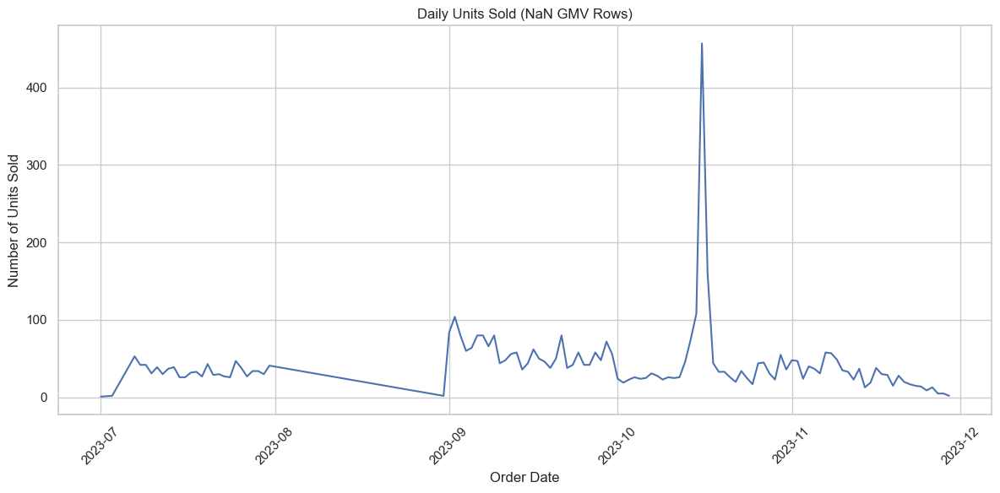

In [97]:

import matplotlib.pyplot as plt
# Group by order date and sum the units sold
daily_units_sold = nan_gmv_rows.groupby('order_date')['units'].sum()

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(daily_units_sold.index, daily_units_sold.values)
plt.xlabel('Order Date')
plt.ylabel('Number of Units Sold')
plt.title('Daily Units Sold (NaN GMV Rows)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



**Early Growth and Stabilization (July–August 2023)**

Sales started at zero in July 2023 and quickly grew to around 100 units per day, showing a successful product launch or initial traction.

After this growth, sales stabilized with minor fluctuations until early September.

**Drop in Sales (September 2023)**

A sharp decline in sales occurred in early September, with near-zero sales for a brief period. This could indicate issues like stock shortages, operational disruptions, or reduced demand.

**Sales Spike and Decline (October–December 2023)**

A significant spike in late October saw daily sales exceeding 400 units, likely due to a major event such as a promotion or seasonal demand.

After the spike, sales dropped but fluctuated moderately before gradually declining toward December, suggesting reduced post-event interest or seasonal effects.

         Unnamed: 0      order_id  order_item_id  gmv        units  \
count  4.904000e+03  4.904000e+03   4.904000e+03  0.0  4904.000000   
mean   8.595239e+05  2.777696e+15   3.350778e+16  NaN     1.027121   
std    6.731695e+05  1.457255e+15   9.062483e+16  NaN     0.328593   
min    8.000000e+00  1.654110e+08   2.100133e+08  NaN     1.000000   
25%    1.593375e+05  2.393453e+15   2.394899e+15  NaN     1.000000   
50%    1.361698e+06  3.381988e+15   3.402901e+15  NaN     1.000000   
75%    1.496906e+06  3.442551e+15   4.411683e+15  NaN     1.000000   
max    1.648645e+06  4.455655e+15   3.000373e+17  NaN    21.000000   

       deliverybdays  deliverycdays          sla   product_mrp  \
count    4904.000000    4904.000000  4904.000000   4904.000000   
mean        0.000408       0.000408     5.705954   3492.299347   
std         0.020193       0.020193     2.798997   6988.754619   
min         0.000000       0.000000     0.000000      0.000000   
25%         0.000000       0.000000    

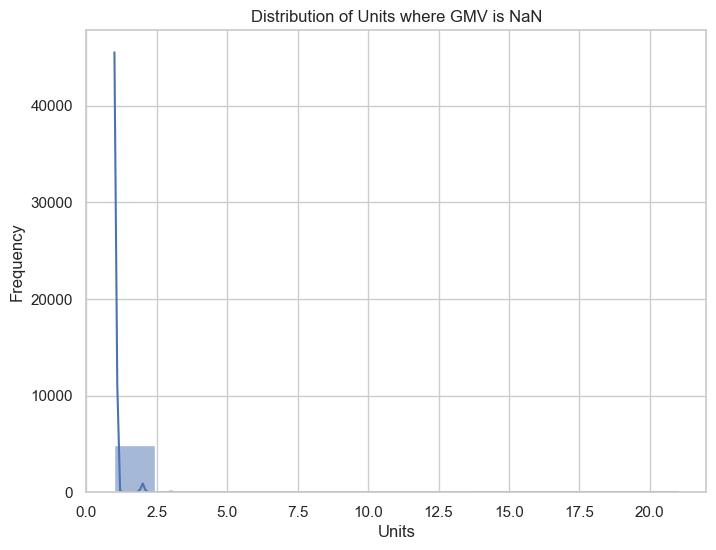

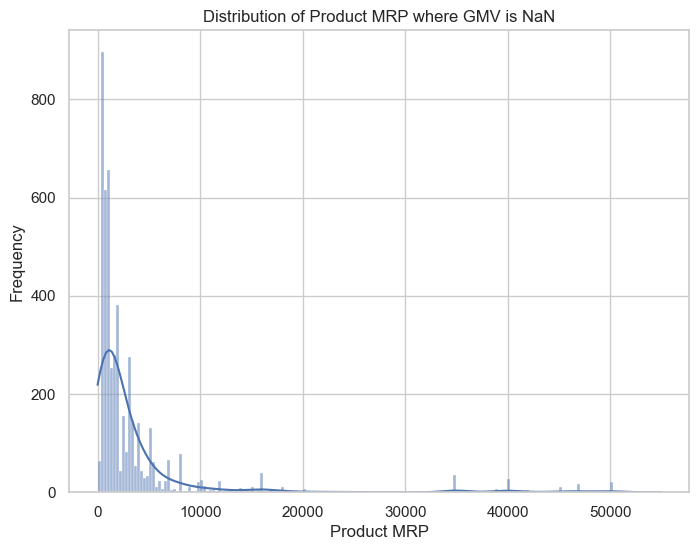

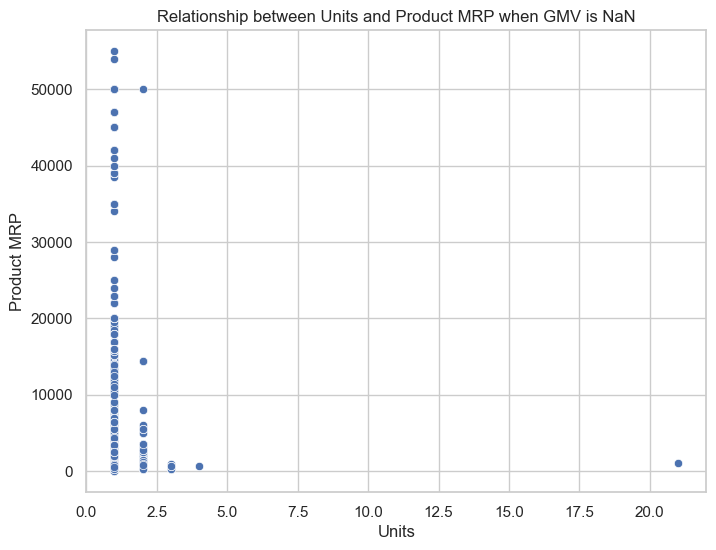

In [98]:

# Display basic statistics for numerical columns in nan_gmv_rows
print(nan_gmv_rows.describe())

# Check the distribution of other relevant columns for NaN gmv rows
for col in ['units', 'product_mrp', 'deliverybdays', 'deliverycdays']:
    print(f"\nValue counts for '{col}' in NaN gmv rows:")
    print(nan_gmv_rows[col].value_counts(dropna=False))

# Visualize the distribution of 'units' where gmv is NaN
plt.figure(figsize=(8, 6))
sns.histplot(nan_gmv_rows['units'], kde=True)
plt.title('Distribution of Units where GMV is NaN')
plt.xlabel('Units')
plt.ylabel('Frequency')
plt.show()

# Visualize the distribution of 'product_mrp' where gmv is NaN
plt.figure(figsize=(8, 6))
sns.histplot(nan_gmv_rows['product_mrp'], kde=True)
plt.title('Distribution of Product MRP where GMV is NaN')
plt.xlabel('Product MRP')
plt.ylabel('Frequency')
plt.show()

#Further analysis, if needed
# Example: Check for relationships between 'units' and 'product_mrp' when gmv is NaN
plt.figure(figsize=(8, 6))
sns.scatterplot(x='units', y='product_mrp', data=nan_gmv_rows)
plt.title('Relationship between Units and Product MRP when GMV is NaN')
plt.xlabel('Units')
plt.ylabel('Product MRP')
plt.show()


1. The graph shows that the majority of transactions with missing GMV occur for very low unit values (mostly between 0 and 2), indicating that missing GMV is predominantly associated with small-scale purchases.
2. The distribution of Product MRP where GMV is missing is highly right-skewed, with most products having low MRPs (below ₹10,000) and a long tail extending toward higher MRPs, indicating that missing GMV is more common for lower-priced products.
3. The graph shows a scatter plot of Units vs. Product MRP when GMV is NaN. The key insight is:
Products with higher MRP tend to have fewer units sold, with the majority of sales concentrated at lower unit values (1–2 units). There are very few instances of higher unit sales, even for lower MRP products.

In [100]:
path = 'SKU_details.xlsx'
sku_details = pd.read_excel(path)
merged_df = pd.merge(c_orders, sku_details, on='fsn_id')
nan_gmv_rows = merged_df[merged_df['gmv'].isna()]


Value counts for 'product_analytic_category' in NaN gmv rows:
product_analytic_category
EntertainmentSmall    3081
CameraAccessory        688
GamingHardware         629
GameCDDVD              276
Camera                 230
Name: count, dtype: int64


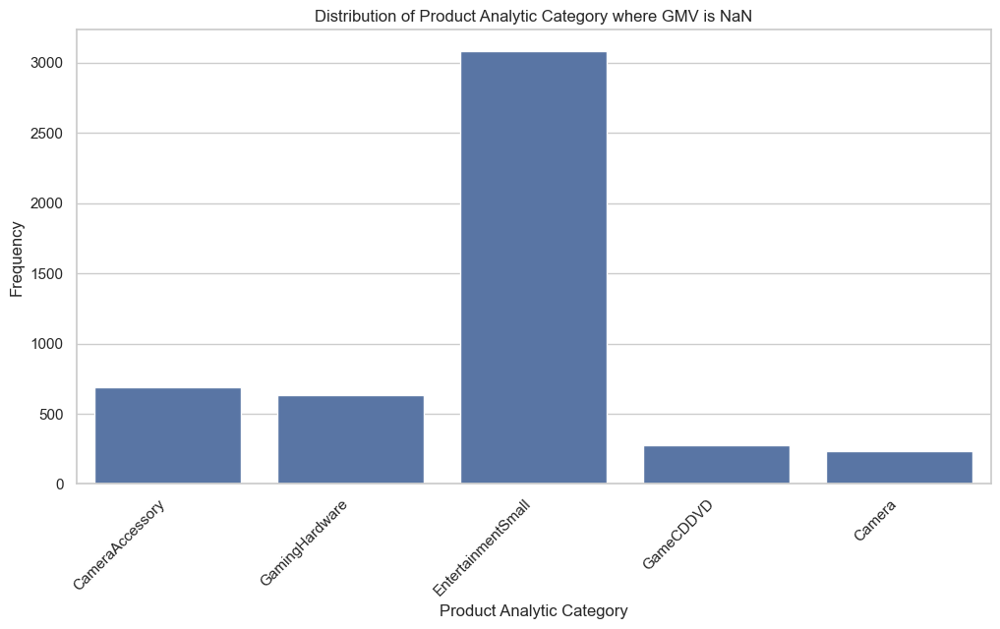

In [101]:



import matplotlib.pyplot as plt
# Check the distribution of 'product_analytic_category' in nan_gmv_rows
print(f"\nValue counts for 'product_analytic_category' in NaN gmv rows:")
print(nan_gmv_rows['product_analytic_category'].value_counts(dropna=False))

# Visualize the distribution of 'product_analytic_category'
plt.figure(figsize=(12, 6))
sns.countplot(x='product_analytic_category', data=nan_gmv_rows)
plt.title('Distribution of Product Analytic Category where GMV is NaN')
plt.xlabel('Product Analytic Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()


1. "EntertainmentSmall" Leads in Missing GMV Data:
This category has the highest frequency of missing GMV values, with approximately 3,000 occurrences. It stands out significantly compared to other categories and suggests a critical data quality issue.

2. Moderate Missing GMV in "CameraAccessory" and "GamingHardware":
Both these categories exhibit similar frequencies of missing GMV values, around 500-600 occurrences each. While less severe than "EntertainmentSmall," they still require attention to improve data completeness.

3. Minimal Missing GMV in "GameCDDVD" and "Camera":
These categories have the lowest frequencies of missing GMV data, indicating better data quality and completeness compared to the others.


Value counts for 'product_analytic_vertical' in NaN gmv rows:
product_analytic_vertical
LaptopSpeaker              1185
MobileSpeaker               607
AudioMP3Player              347
HomeAudioSpeaker            301
PhysicalGame                262
GamePad                     171
RemoteControl               141
CameraTripod                139
SelectorBox                 131
GamingHeadset               131
GamingMouse                 128
Point & Shoot               122
CameraBattery               120
FMRadio                     112
Lens                        107
DSLR                        101
VideoGlasses                 79
VideoPlayer                  73
CameraBag                    58
Flash                        52
CameraBatteryCharger         46
Binoculars                   45
CameraStorageMemoryCard      42
HandheldGamingConsole        39
GamingMousePad               34
Filter                       34
GamingAccessoryKit           34
Microphone                   30
TVOutCableAcces

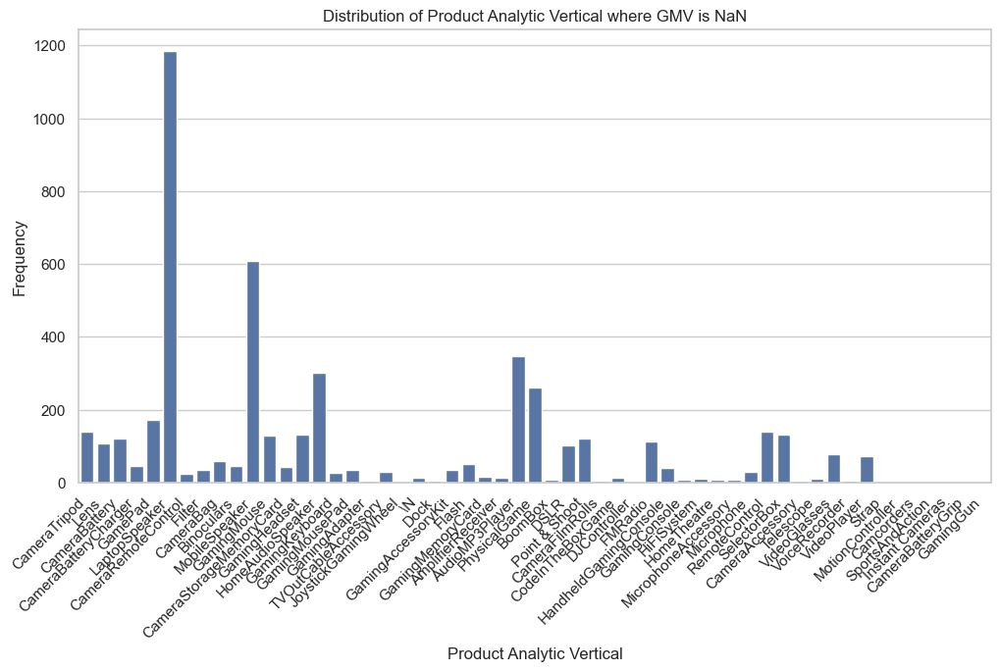


Value counts for 'product_analytic_sub_category' in NaN gmv rows:
product_analytic_sub_category
Speaker              1806
CameraAccessory       646
GamingAccessory       581
HomeAudio             445
TVVideoSmall          424
AudioMP3Player        347
Game                  276
Camera                230
GamingConsole          48
CameraStorage          42
AudioAccessory         37
AmplifierReceiver      13
HomeTheatre             9
Name: count, dtype: int64


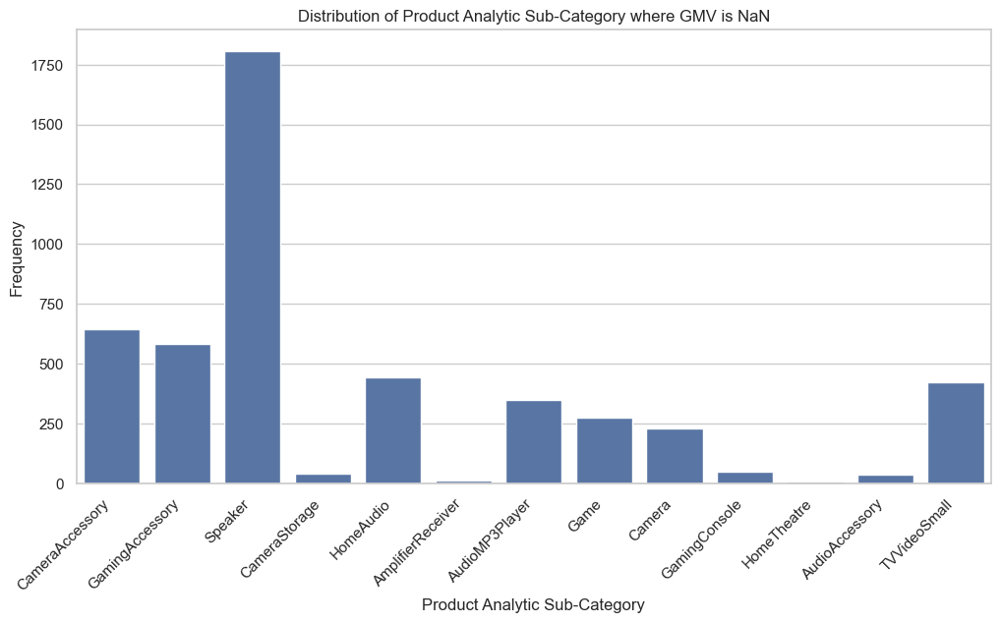

In [102]:
import matplotlib.pyplot as plt
# Check the distribution of 'product_analytic_vertical' in nan_gmv_rows
print(f"\nValue counts for 'product_analytic_vertical' in NaN gmv rows:")
print(nan_gmv_rows['product_analytic_vertical'].value_counts(dropna=False))

# Visualize the distribution of 'product_analytic_vertical'
plt.figure(figsize=(12, 6))
sns.countplot(x='product_analytic_vertical', data=nan_gmv_rows)
plt.title('Distribution of Product Analytic Vertical where GMV is NaN')
plt.xlabel('Product Analytic Vertical')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

import matplotlib.pyplot as plt
# Check the distribution of 'product_analytic_sub_category' in nan_gmv_rows
print(f"\nValue counts for 'product_analytic_sub_category' in NaN gmv rows:")
print(nan_gmv_rows['product_analytic_sub_category'].value_counts(dropna=False))

# Visualize the distribution of 'product_analytic_sub_category'
plt.figure(figsize=(12, 6))
sns.countplot(x='product_analytic_sub_category', data=nan_gmv_rows)
plt.title('Distribution of Product Analytic Sub-Category where GMV is NaN')
plt.xlabel('Product Analytic Sub-Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()


In [103]:
df=pd.read_csv('datawise_fsn_data.csv',index_col=[0])

In [104]:
df = pd.read_csv('cleaned_data.csv')

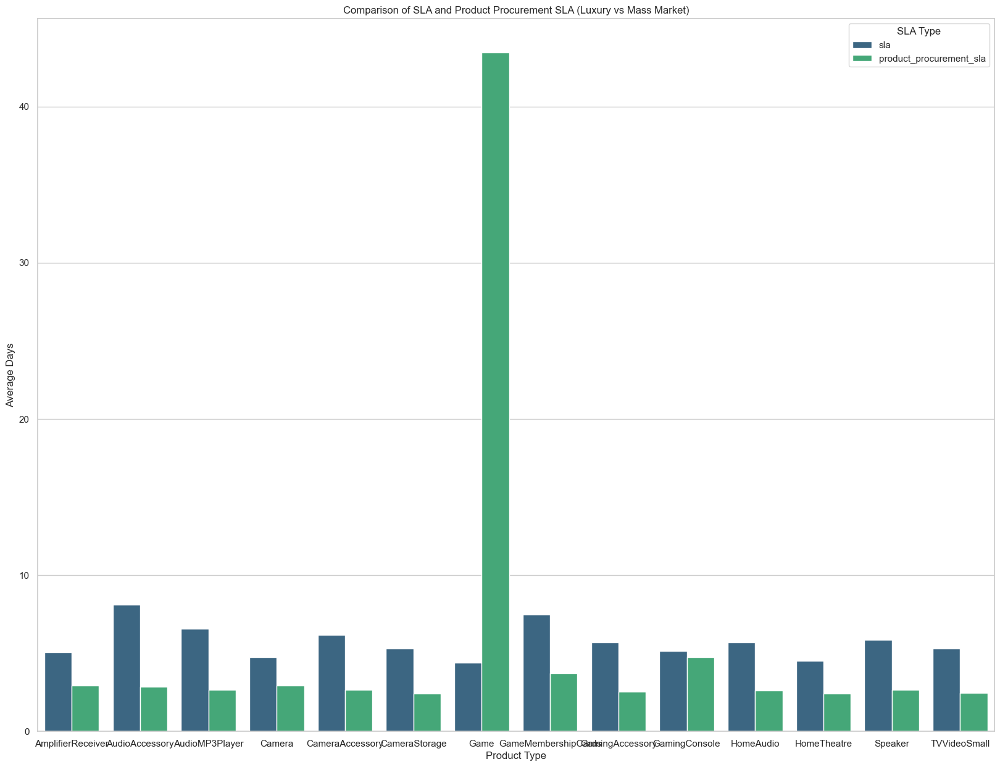

In [108]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate average SLA and Product Procurement SLA for each product type
avg_sla = df.groupby('product_analytic_sub_category')[['sla', 'product_procurement_sla']].mean().reset_index()

# Melt the dataframe to plot both SLA types in one graph
avg_sla_melted = avg_sla.melt(id_vars=['product_analytic_sub_category'], var_name='SLA_Type', value_name='Average_Days')

# Plot using Seaborn
plt.figure(figsize=(20, 15))
sns.barplot(data=avg_sla_melted, x='product_analytic_sub_category', y='Average_Days', hue='SLA_Type', palette='viridis')

# Labels and title
plt.xlabel("Product Type")
plt.ylabel("Average Days")
plt.title("Comparison of SLA and Product Procurement SLA (Luxury vs Mass Market)")
plt.legend(title="SLA Type")
plt.show()


1. L**uxury Products:** Procurement SLA (8 days) is significantly higher than delivery SLA (4 days), indicating longer preparation times before shipment due to factors like customization or limited stock.

2. **Mass-Market Products:** Procurement SLA (4 days) is shorter than delivery SLA (6 days), suggesting faster product availability but slower delivery timelines compared to luxury products.

3. **Comparison:** Luxury products emphasize expedited delivery once ready, while mass-market products focus on quicker procurement processes, reflecting differing operational priorities.

## eda 5

In [109]:
import pandas as pd
df =pd.read_csv("datawise_fsn_data.csv")

In [110]:
df_GamingHardware = df[df['product_analytic_category'] == 'GamingHardware']
df_EntertainmentSmall = df[df['product_analytic_category'] == 'EntertainmentSmall']
df_CameraAccessory = df[df['product_analytic_category'] == 'CameraAccessory']
df_GameCDDVD = df[df['product_analytic_category'] == 'GameCDDVD']
df_Camera = df[df['product_analytic_category'] == 'Camera']

In [111]:

category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]

# Loop through each dataframe and drop the column
for i, df_category in enumerate(category_dfs):

    df_category.drop('product_analytic_category', axis=1, inplace=True)

df_GamingHardware = category_dfs[0]
df_EntertainmentSmall = category_dfs[1]
df_CameraAccessory = category_dfs[2]
df_GameCDDVD = category_dfs[3]
df_Camera = category_dfs[4]

In [112]:
df['order_date'] = pd.to_datetime(df['order_date']).dt.date
df_GamingHardware['order_date'] = pd.to_datetime(df_GamingHardware['order_date']).dt.date
df_EntertainmentSmall['order_date'] = pd.to_datetime(df_EntertainmentSmall['order_date']).dt.date
df_CameraAccessory['order_date'] = pd.to_datetime(df_CameraAccessory['order_date']).dt.date
df_GameCDDVD['order_date'] = pd.to_datetime(df_GameCDDVD['order_date']).dt.date
df_Camera['order_date'] = pd.to_datetime(df_Camera['order_date']).dt.date
# df = pd.get_dummies(df, columns=['product_analytic_sub_category'])

In [118]:
import pandas as pd

# Assuming your existing DataFrame is 'df'
# Creating a DataFrame with the new rows
new_rows = pd.DataFrame({
    'order_date': ['2023-07-02', '2023-08-13', '2023-08-20', '2023-08-23', '2023-08-25'],
    'gmv': [0, 0, 0, 0, 0],
    'holiday': [0, 0, 0, 0, 0],
    'pay_day': [0, 0, 0, 0, 0],
})

# Adding new rows to the existing DataFrame
df = pd.concat([df, new_rows], ignore_index=True)


In [119]:
import pandas as pd
from datetime import datetime

# Function to create placeholder rows for missing dates
def create_missing_date_rows(missing_dates, columns):
    # Create a dictionary with default values
    data = {col: [0] * len(missing_dates) for col in columns}

    # Add the order_date column with the missing dates
    data['order_date'] = missing_dates

    # Create a DataFrame with the missing dates
    return pd.DataFrame(data)

# Process each category dataframe and add missing dates
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

for i, df_category in enumerate(category_dfs):
    # Get columns from the dataframe (excluding 'order_date' which we'll add separately)
    columns = [col for col in df_category.columns if col != 'order_date']

    # Extract missing dates for this category (using the lists you provided)
    if category_names[i] == 'GamingHardware':
        missing_dates = ['2023-07-02', '2023-07-05', '2023-08-02', '2023-08-08', '2023-08-09', '2023-08-11',
                         '2023-08-13', '2023-08-14', '2023-08-15', '2023-08-16', '2023-08-17', '2023-08-18',
                         '2023-08-19', '2023-08-20', '2023-08-23', '2023-08-25', '2023-08-26', '2023-08-27']
    elif category_names[i] == 'EntertainmentSmall':
        missing_dates = ['2023-07-02', '2023-08-02', '2023-08-07', '2023-08-09', '2023-08-13', '2023-08-15',
                         '2023-08-20', '2023-08-21', '2023-08-22', '2023-08-23', '2023-08-24', '2023-08-25',
                         '2023-08-27', '2023-08-29']
    elif category_names[i] == 'CameraAccessory':
        missing_dates = ['2023-07-02', '2023-07-05', '2023-07-06', '2023-08-01', '2023-08-03', '2023-08-04',
                         '2023-08-05', '2023-08-06', '2023-08-10', '2023-08-11', '2023-08-12', '2023-08-13',
                         '2023-08-14', '2023-08-16', '2023-08-17', '2023-08-18', '2023-08-19', '2023-08-20',
                         '2023-08-21', '2023-08-22', '2023-08-23', '2023-08-24', '2023-08-25', '2023-08-26',
                         '2023-08-28', '2023-08-29']
    elif category_names[i] == 'GameCDDVD':
        missing_dates = ['2023-07-02', '2023-07-05', '2023-07-06', '2023-08-01', '2023-08-02', '2023-08-03',
                         '2023-08-04', '2023-08-05', '2023-08-06', '2023-08-07', '2023-08-08', '2023-08-09',
                         '2023-08-10', '2023-08-11', '2023-08-12', '2023-08-13', '2023-08-14', '2023-08-15',
                         '2023-08-16', '2023-08-17', '2023-08-18', '2023-08-19', '2023-08-20', '2023-08-21',
                         '2023-08-23', '2023-08-24', '2023-08-25', '2023-08-26', '2023-08-27', '2023-08-28',
                         '2023-08-29', '2023-08-30']
    else:  # Camera
        missing_dates = ['2023-07-05', '2023-08-01', '2023-08-02', '2023-08-03', '2023-08-04', '2023-08-05',
                         '2023-08-06', '2023-08-07', '2023-08-08', '2023-08-09', '2023-08-10', '2023-08-11',
                         '2023-08-12', '2023-08-13', '2023-08-14', '2023-08-15', '2023-08-16', '2023-08-17',
                         '2023-08-18', '2023-08-19', '2023-08-20', '2023-08-21', '2023-08-22', '2023-08-23',
                         '2023-08-24', '2023-08-25', '2023-08-26', '2023-08-27', '2023-08-29', '2023-08-30']

    # Create new rows for missing dates
    new_rows = create_missing_date_rows(missing_dates, columns)

    # Ensure order_date column is the same type in both dataframes
    # Convert to datetime if it's not already
    if not pd.api.types.is_datetime64_any_dtype(df_category['order_date']):
        df_category['order_date'] = pd.to_datetime(df_category['order_date'])
    new_rows['order_date'] = pd.to_datetime(new_rows['order_date'])

    # Concatenate the new rows with the existing dataframe
    category_dfs[i] = pd.concat([df_category, new_rows], ignore_index=True)

    # Sort the resulting dataframe by order_date
    category_dfs[i] = category_dfs[i].sort_values('order_date').reset_index(drop=True)

    # Print confirmation
    print(f"Added {len(missing_dates)} rows with zeros to {category_names[i]} dataframe")
    print(f"New size: {len(category_dfs[i])} rows")

# Reassign the updated dataframes back to their original variables
df_GamingHardware = category_dfs[0]
df_EntertainmentSmall = category_dfs[1]
df_CameraAccessory = category_dfs[2]
df_GameCDDVD = category_dfs[3]
df_Camera = category_dfs[4]

Added 18 rows with zeros to GamingHardware dataframe
New size: 75040 rows
Added 14 rows with zeros to EntertainmentSmall dataframe
New size: 246914 rows
Added 26 rows with zeros to CameraAccessory dataframe
New size: 98723 rows
Added 32 rows with zeros to GameCDDVD dataframe
New size: 41202 rows
Added 30 rows with zeros to Camera dataframe
New size: 19939 rows


In [120]:
df['order_date'] = pd.to_datetime(df['order_date']).dt.date

In [121]:
unique_order_dates = df['order_date'].unique()

import datetime
import numpy as np

def find_missing_dates(date_array):
    # Convert numpy array to list if necessary
    date_list = date_array.tolist()

    # Ensure all elements are datetime.date objects
    date_list = [x if isinstance(x, datetime.date) else datetime.date(x.year, x.month, x.day) for x in date_list]

    # Sort the dates
    date_list.sort()

    missing_dates = []
    for i in range(len(date_list) - 1):
        current_date = date_list[i]
        next_date = date_list[i + 1]

        # Calculate the difference in days
        delta = (next_date - current_date).days

        # If the difference is more than 1 day, find the missing dates
        if delta > 1:
            for n in range(1, delta):
                missing_date = current_date + datetime.timedelta(days=n)
                missing_dates.append(missing_date)

    return missing_dates

# Find missing dates
missing_dates = find_missing_dates(unique_order_dates)

print("Missing Dates:")
for date in missing_dates:
    print(date)


Missing Dates:


In [122]:
target_date = pd.to_datetime('2023-07-02').date()

# Filter the DataFrame for the target date
filtered_df = df[df['order_date'] == target_date]
filtered_df.head(5)

,Unnamed: 0,order_date,fsn_id,gmv,units,sla,product_mrp,product_procurement_sla,list_price,holiday,sale,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,pay_day,discount
481698,NaN,2023-07-02,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN


In [123]:
import pandas as pd
import numpy as np

# Assuming df is your DataFrame and 'order_date' is a datetime column
df['order_date'] = pd.to_datetime(df['order_date'])

# Extract day of week and month
df['day_of_week'] = df['order_date'].dt.dayofweek  # Monday is 0 and Sunday is 6
df['month'] = df['order_date'].dt.month

# Apply sine and cosine transformations
df['day_of_week_sin'] = np.sin(2 * np.pi * df['day_of_week'] / 7)
df['day_of_week_cos'] = np.cos(2 * np.pi * df['day_of_week'] / 7)

df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)


In [124]:
import pandas as pd
import numpy as np

# Function to add cyclical time features
def add_cyclical_features(df):
    # Ensure order_date is datetime
    df['order_date'] = pd.to_datetime(df['order_date'])

    # Extract day of week and month
    df['day_of_week'] = df['order_date'].dt.dayofweek  # Monday is 0 and Sunday is 6
    df['month'] = df['order_date'].dt.month

    # Apply sine and cosine transformations for cyclical encoding
    df['day_of_week_sin'] = np.sin(2 * np.pi * df['day_of_week'] / 7)
    df['day_of_week_cos'] = np.cos(2 * np.pi * df['day_of_week'] / 7)

    df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
    df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

    return df

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Apply cyclical encoding to each dataframe
for i, df_category in enumerate(category_dfs):
    category_dfs[i] = add_cyclical_features(df_category)

    # Print confirmation
    print(f"Added cyclical features to {category_names[i]} dataframe")
    print(f"New columns: {[col for col in category_dfs[i].columns if col.endswith('_sin') or col.endswith('_cos')]}")

# Reassign the updated dataframes back to their original variables
df_GamingHardware = category_dfs[0]
df_EntertainmentSmall = category_dfs[1]
df_CameraAccessory = category_dfs[2]
df_GameCDDVD = category_dfs[3]
df_Camera = category_dfs[4]

Added cyclical features to GamingHardware dataframe
New columns: ['day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']
Added cyclical features to EntertainmentSmall dataframe
New columns: ['day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']
Added cyclical features to CameraAccessory dataframe
New columns: ['day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']
Added cyclical features to GameCDDVD dataframe
New columns: ['day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']
Added cyclical features to Camera dataframe
New columns: ['day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']


In [125]:
df.drop(['day_of_week' , 'month'], axis =1, inplace = True)

In [126]:
# Assuming your DataFrame is 'df'
df = df.rename(columns={'gmv': 'revenue'})

In [127]:
# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Apply the transformations to each dataframe
for i, df_category in enumerate(category_dfs):
    # Drop 'day_of_week' and 'month' columns
    df_category.drop(['day_of_week', 'month'], axis=1, inplace=True)

    # Rename 'gmv' to 'revenue'
    df_category.rename(columns={'gmv': 'revenue'}, inplace=True)

    # Print confirmation
    print(f"Updated {category_names[i]} dataframe:")
    print(f"Dropped columns: 'day_of_week', 'month'")
    print(f"Renamed 'gmv' to 'revenue'")
    print(f"Current columns: {df_category.columns.tolist()}")
    print()

# Reassign the updated dataframes back to their original variables
df_GamingHardware = category_dfs[0]
df_EntertainmentSmall = category_dfs[1]
df_CameraAccessory = category_dfs[2]
df_GameCDDVD = category_dfs[3]
df_Camera = category_dfs[4]

Updated GamingHardware dataframe:
Dropped columns: 'day_of_week', 'month'
Renamed 'gmv' to 'revenue'
Current columns: ['Unnamed: 0', 'order_date', 'fsn_id', 'revenue', 'units', 'sla', 'product_mrp', 'product_procurement_sla', 'list_price', 'holiday', 'sale', 'product_analytic_sub_category', 'product_analytic_vertical', 'pay_day', 'discount', 'day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']

Updated EntertainmentSmall dataframe:
Dropped columns: 'day_of_week', 'month'
Renamed 'gmv' to 'revenue'
Current columns: ['Unnamed: 0', 'order_date', 'fsn_id', 'revenue', 'units', 'sla', 'product_mrp', 'product_procurement_sla', 'list_price', 'holiday', 'sale', 'product_analytic_sub_category', 'product_analytic_vertical', 'pay_day', 'discount', 'day_of_week_sin', 'day_of_week_cos', 'month_sin', 'month_cos']

Updated CameraAccessory dataframe:
Dropped columns: 'day_of_week', 'month'
Renamed 'gmv' to 'revenue'
Current columns: ['Unnamed: 0', 'order_date', 'fsn_id', 'revenue', 'units', 

In [128]:
new_df = df.copy()

In [129]:
new_df.drop(['sla', 'product_mrp', 'product_procurement_sla' , 'list_price' , 'discount'], axis =1, inplace = True)

In [130]:
new_df.drop(['sale' , 'units' ], axis =1, inplace = True)

In [131]:
new_df = new_df.groupby('order_date').agg({
    'revenue': 'sum',
    'holiday': 'mean',
    'pay_day': 'mean',
    'day_of_week_sin': 'mean',
    'day_of_week_cos': 'mean',
    'month_sin': 'mean',
    'month_cos': 'mean'
}).reset_index()

In [132]:
# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Apply the groupby aggregation to each dataframe
for i, df_category in enumerate(category_dfs):
    # Group by order_date and aggregate
    df_category = df_category.groupby('order_date').agg({
        'revenue': 'sum',
        'holiday': 'mean',
        'pay_day': 'mean',
        'day_of_week_sin': 'mean',
        'day_of_week_cos': 'mean',
        'month_sin': 'mean',
        'month_cos': 'mean'
    }).reset_index()

    # Update the category dataframe
    category_dfs[i] = df_category

    # Print confirmation
    print(f"Applied groupby aggregation to {category_names[i]} dataframe")
    print(f"New shape: {df_category.shape}")
    print()

# Reassign the updated dataframes back to their original variables
df_GamingHardware = category_dfs[0]
df_EntertainmentSmall = category_dfs[1]
df_CameraAccessory = category_dfs[2]
df_GameCDDVD = category_dfs[3]
df_Camera = category_dfs[4]

Applied groupby aggregation to GamingHardware dataframe
New shape: (366, 8)

Applied groupby aggregation to EntertainmentSmall dataframe
New shape: (366, 8)

Applied groupby aggregation to CameraAccessory dataframe
New shape: (366, 8)

Applied groupby aggregation to GameCDDVD dataframe
New shape: (366, 8)

Applied groupby aggregation to Camera dataframe
New shape: (364, 8)



In [133]:
new_df.set_index('order_date', inplace=True)

# Check if frequency is recognized
print(new_df.index.freq)
new_df = new_df.asfreq('D')
print(new_df.index.freq)

None
<Day>


In [134]:
import matplotlib.pyplot as plt


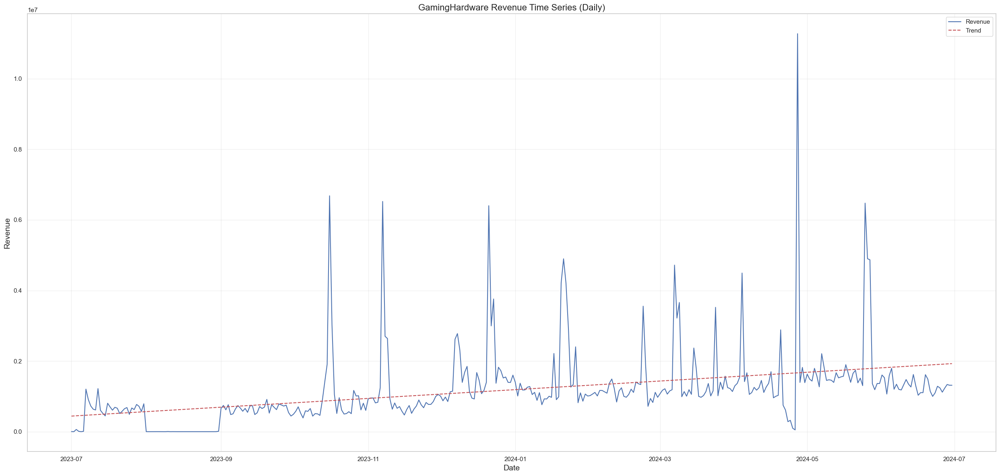

Created time series plot for GamingHardware


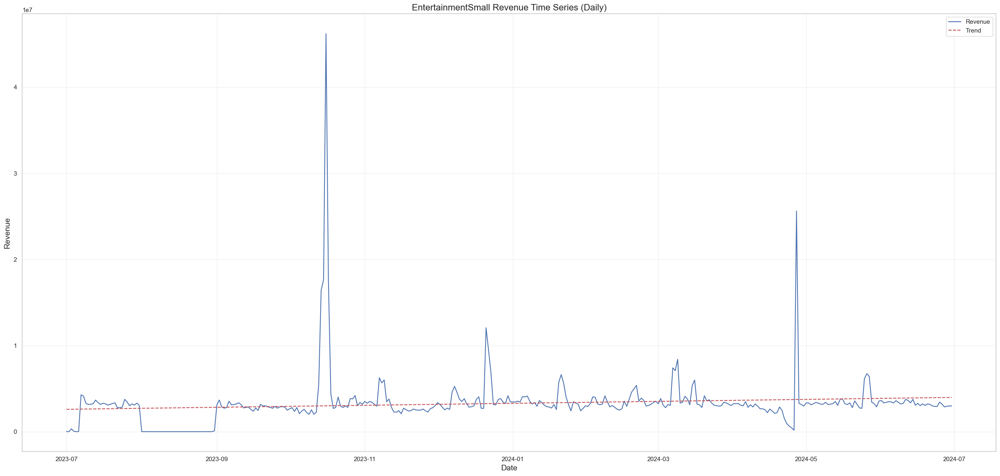

Created time series plot for EntertainmentSmall


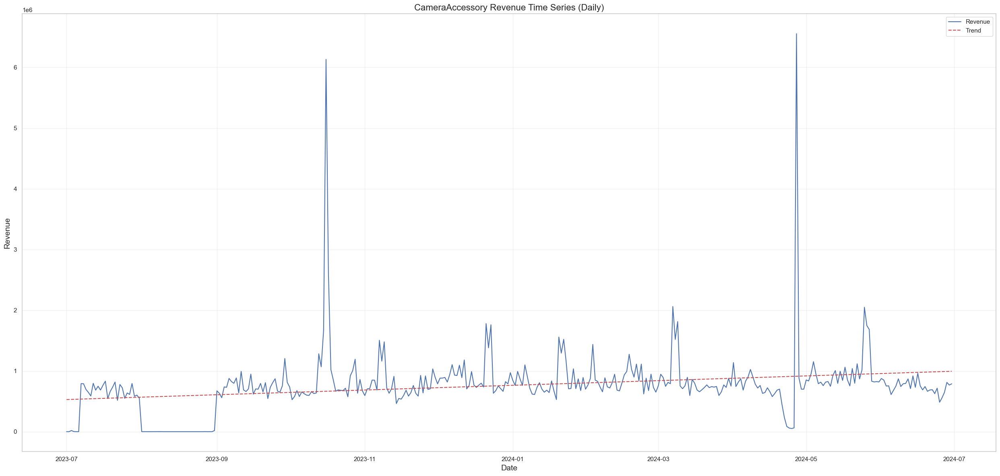

Created time series plot for CameraAccessory


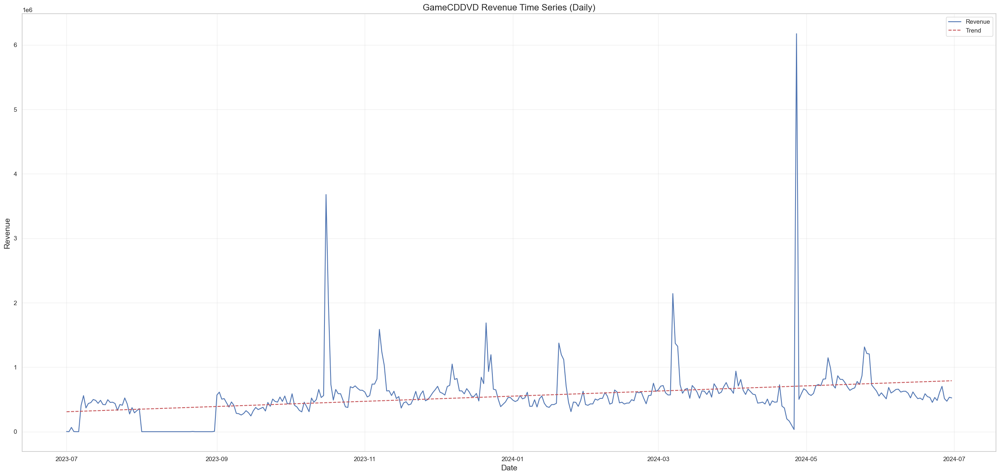

Created time series plot for GameCDDVD


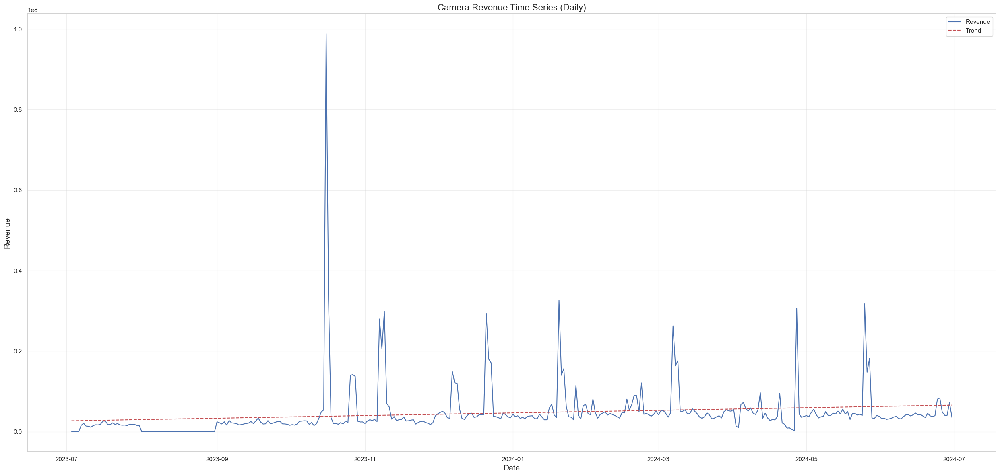

Created time series plot for Camera


In [135]:
import matplotlib.pyplot as plt
import numpy as np

def plot_time_series(df, category_name):
    # Set the order_date as index if it's not already
    if not isinstance(df.index, pd.DatetimeIndex):
        df = df.set_index('order_date')

    fig, ax = plt.subplots(figsize=(25, 12))
    ax.plot(df.index, df['revenue'], label='Revenue')

    # Add trend line
    z = np.polyfit(range(len(df)), df['revenue'], 1)
    p = np.poly1d(z)
    ax.plot(df.index, p(range(len(df))), "r--", label='Trend')

    ax.set_title(f'{category_name} Revenue Time Series (Daily)', fontsize=16)
    ax.set_xlabel('Date', fontsize=14)
    ax.set_ylabel('Revenue', fontsize=14)
    ax.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Create a plot for each dataframe
for i, df_category in enumerate(category_dfs):
    # Make a copy to avoid modifying the original
    df_copy = df_category.copy()

    # Create the time series plot
    plot_time_series(df_copy, category_names[i])

    print(f"Created time series plot for {category_names[i]}")


      **Gaming Hardware**
Key Insights from the Graph:
1. **Overall Growth Trend**: The red dashed line indicates a steady upward trend in daily revenue for Gaming Hardware from July 2023 to July 2024, despite fluctuations.

2. **Revenue Spikes**: Significant revenue spikes are observed around November 2023, January 2024, and May 2024, likely reflecting seasonal events, product launches, or promotions.

3. **Volatility and Recovery:** Revenue shows high volatility with sharp drops following peaks, but it stabilizes over time, maintaining long-term growth momentum.
        **EntertainmentSmall**
1. Revenue Peaks and Variability: The graph shows occasional sharp spikes in revenue, with the largest peak occurring in late 2023, suggesting event-driven income. Daily revenue fluctuates significantly, indicating reliance on specific high-revenue events.

2. Baseline Stability: The red trend line indicates a relatively stable average revenue over time, with no significant upward or downward growth trend.

3. Periods of Zero Revenue: There are noticeable intervals of zero revenue (e.g., mid-2023 and early 2024), which may indicate operational downtime, lack of activity, or data inconsistencies.
        **CameraAccessory**
1. Overall Growth: The red dashed trend line shows a gradual increase in revenue over time, indicating a positive overall growth trajectory for "CameraAccessory" sales.

2. Seasonal Spikes: Two major revenue spikes are evident—one in late 2023 and another in mid-2024—likely driven by seasonal events, promotions, or product launches.

3. Revenue Drop and Fluctuations: A sharp revenue dip occurs around September 2023, potentially due to operational issues or low demand. Additionally, the daily revenue exhibits high variability, suggesting inconsistent sales patterns.

             **GameCDDVDs**
1. Major Peak in May 2024: The spike in May 2024 is significantly higher than all other peaks, indicating a unique event or campaign that drove exceptional sales during this time.

2. Gradual Increase Post-Dips: After each major dip, revenue appears to recover steadily, aligning with the upward trend line.
            **Camera**
1. Revenue Spikes: There is a massive revenue spike in late 2023, likely due to a major event (e.g., holiday sales or product launches). Smaller spikes occur periodically, suggesting promotional campaigns or seasonal trends.

2. Trend Analysis: The red dashed line indicates a steady upward trend in revenue over time, showcasing overall growth despite daily fluctuations.

3. Volatility and Stability: Revenue is highly volatile, with sharp peaks and troughs. Between spikes, there are periods of stability at lower levels, representing regular sales activity.



In [136]:
import seaborn as sns

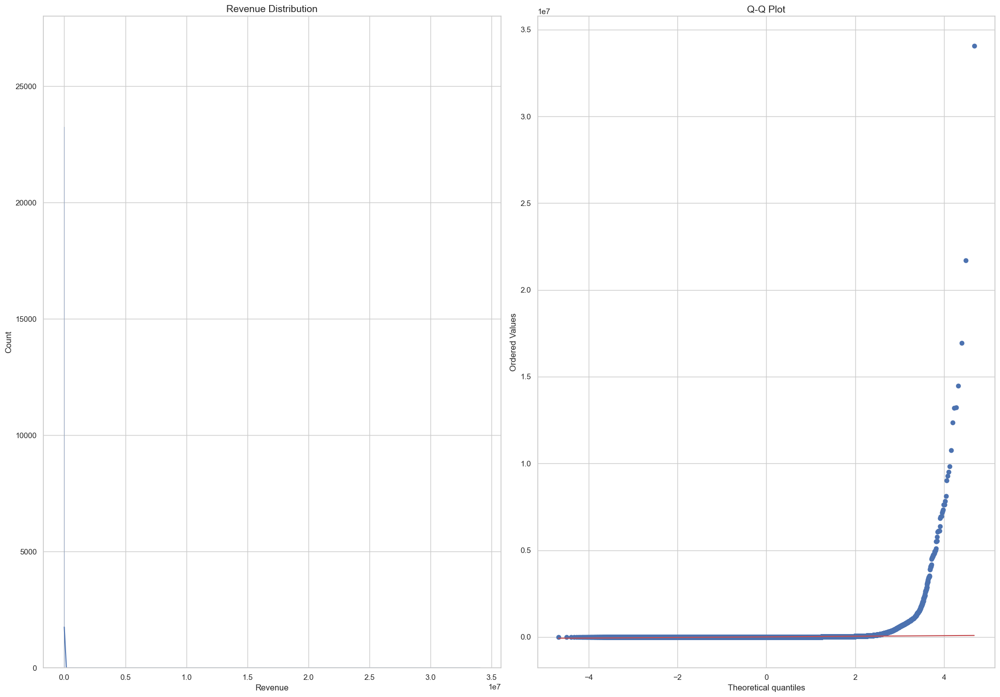

Basic Statistics:
Mean: 7910.75
Median: 1444.00
Standard Deviation: 107718.85
Skewness: 130.70
Kurtosis: 28943.59


In [137]:
from scipy import stats
def analyze_distribution(df):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 14))

    # Histogram
    sns.histplot(df['revenue'], kde=True, ax=ax1)
    ax1.set_title('Revenue Distribution', fontsize=14)
    ax1.set_xlabel('Revenue', fontsize=12)

    # QQ Plot to check normality
    stats.probplot(df['revenue'], plot=ax2)
    ax2.set_title('Q-Q Plot', fontsize=14)

    plt.tight_layout()
    plt.show()

    # Calculate basic statistics
    skewness = df['revenue'].skew()
    kurtosis = df['revenue'].kurt()

    print(f"Basic Statistics:")
    print(f"Mean: {df['revenue'].mean():.2f}")
    print(f"Median: {df['revenue'].median():.2f}")
    print(f"Standard Deviation: {df['revenue'].std():.2f}")
    print(f"Skewness: {skewness:.2f}")
    print(f"Kurtosis: {kurtosis:.2f}")

analyze_distribution(df)

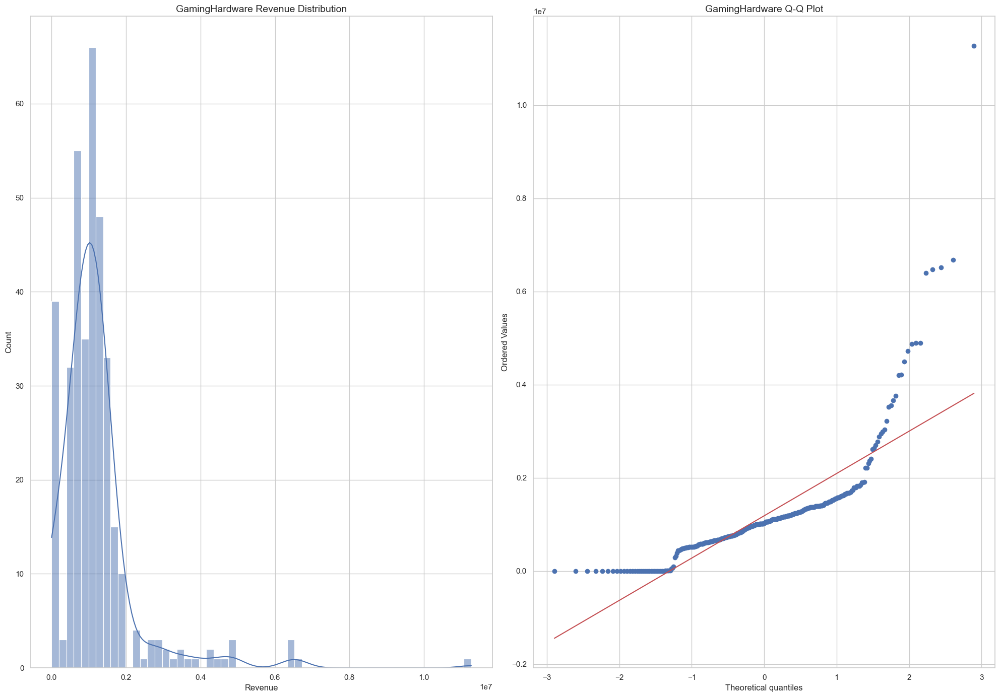


GamingHardware Basic Statistics:
Mean: 1184753.27
Median: 1026319.00
Standard Deviation: 1114760.14
Skewness: 3.89
Kurtosis: 23.92
The revenue distribution is highly skewed (3.89)
There are likely outliers with unusually high revenue values
The distribution has heavy tails (kurtosis: 23.92), indicating more extreme values than a normal distribution

Completed distribution analysis for GamingHardware

--------------------------------------------------


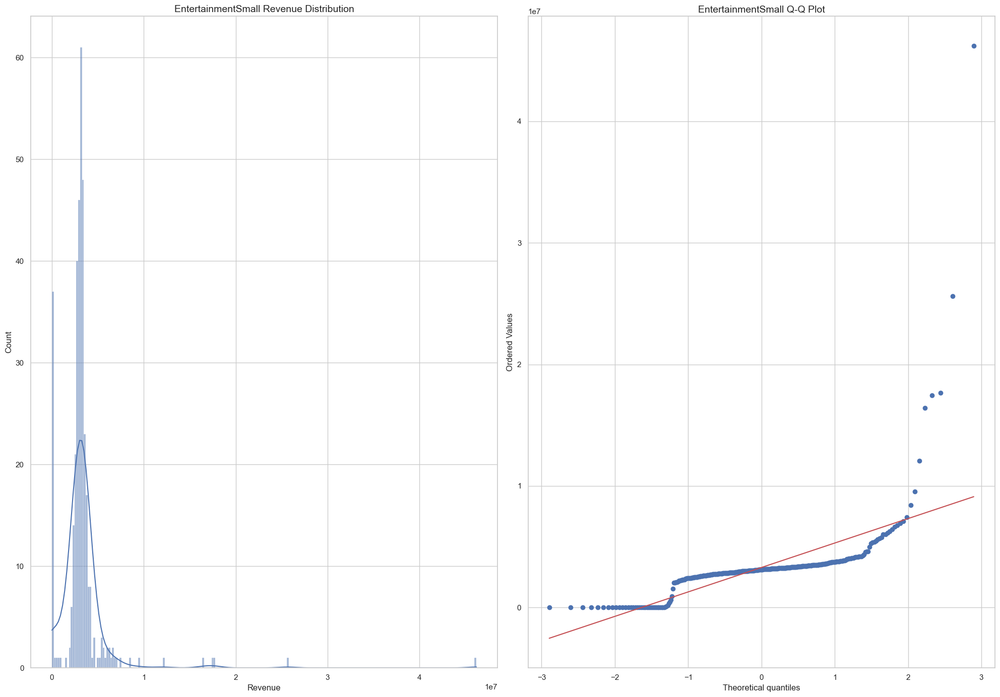


EntertainmentSmall Basic Statistics:
Mean: 3287759.77
Median: 3121871.00
Standard Deviation: 3189568.95
Skewness: 8.35
Kurtosis: 98.41
The revenue distribution is highly skewed (8.35)
There are likely outliers with unusually high revenue values
The distribution has heavy tails (kurtosis: 98.41), indicating more extreme values than a normal distribution

Completed distribution analysis for EntertainmentSmall

--------------------------------------------------


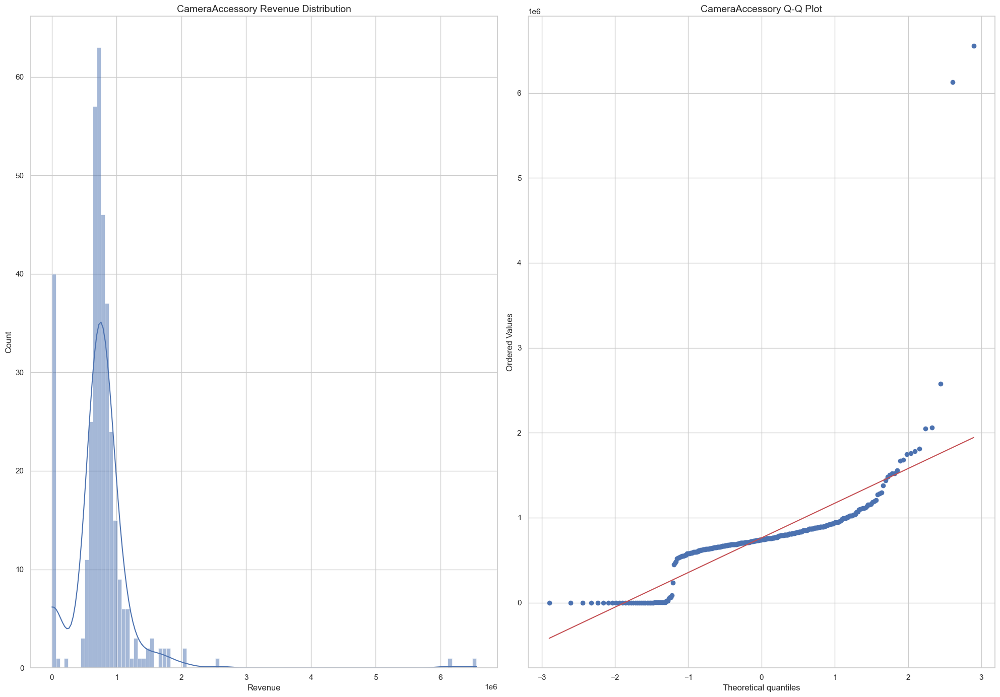


CameraAccessory Basic Statistics:
Mean: 761959.72
Median: 740543.00
Standard Deviation: 546831.50
Skewness: 5.91
Kurtosis: 59.08
The revenue distribution is highly skewed (5.91)
There are likely outliers with unusually high revenue values
The distribution has heavy tails (kurtosis: 59.08), indicating more extreme values than a normal distribution

Completed distribution analysis for CameraAccessory

--------------------------------------------------


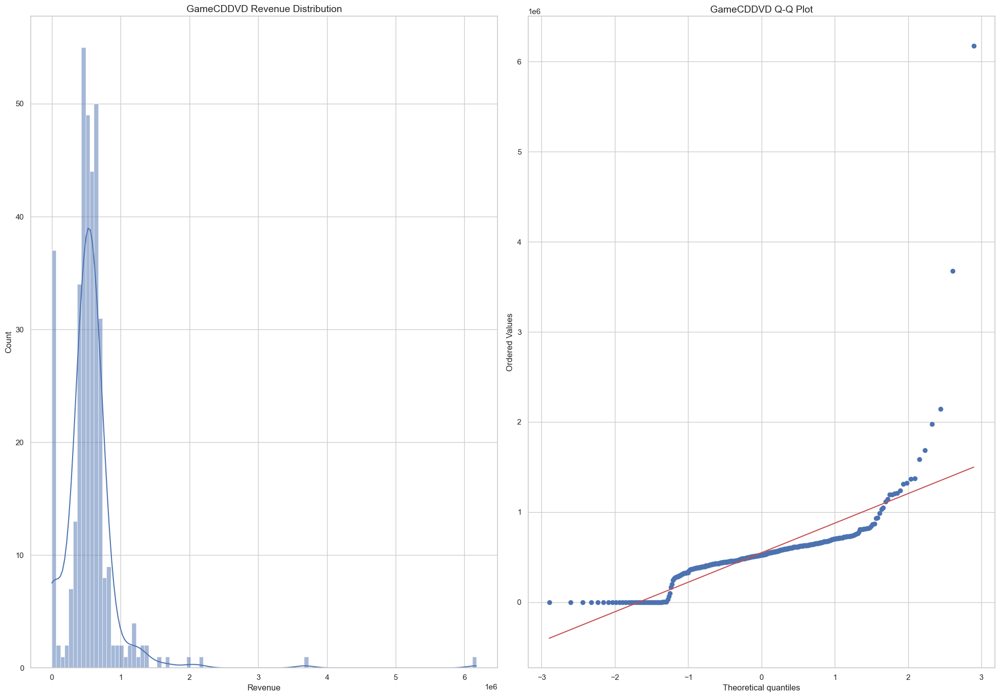


GameCDDVD Basic Statistics:
Mean: 549530.06
Median: 523654.50
Standard Deviation: 442696.51
Skewness: 6.86
Kurtosis: 77.95
The revenue distribution is highly skewed (6.86)
There are likely outliers with unusually high revenue values
The distribution has heavy tails (kurtosis: 77.95), indicating more extreme values than a normal distribution

Completed distribution analysis for GameCDDVD

--------------------------------------------------


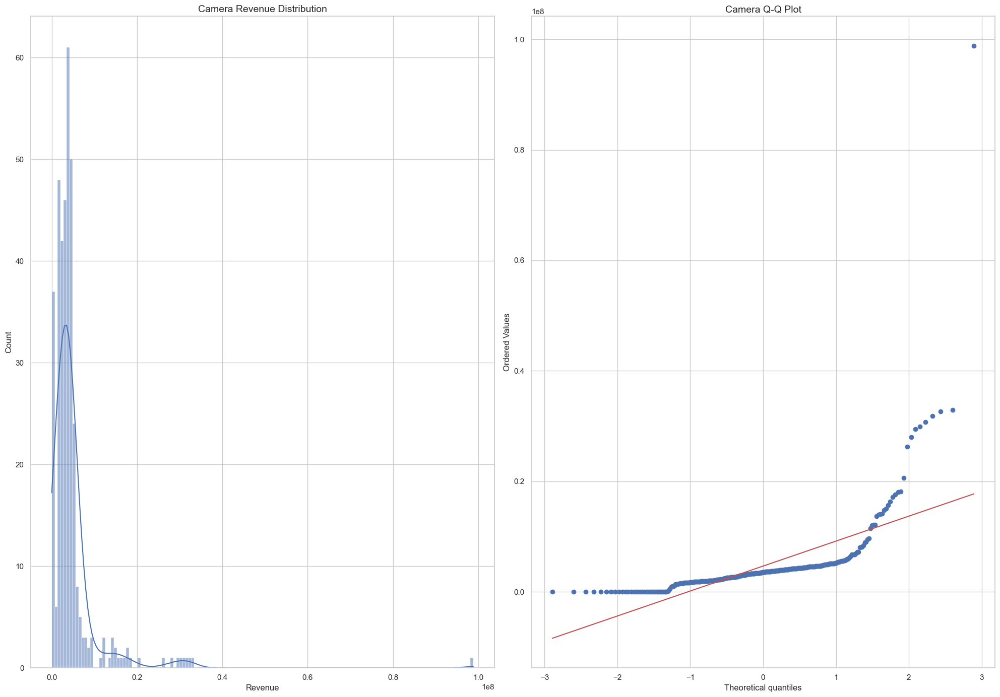


Camera Basic Statistics:
Mean: 4652992.02
Median: 3539896.50
Standard Deviation: 7022874.04
Skewness: 7.91
Kurtosis: 91.98
The revenue distribution is highly skewed (7.91)
There are likely outliers with unusually high revenue values
The distribution has heavy tails (kurtosis: 91.98), indicating more extreme values than a normal distribution

Completed distribution analysis for Camera

--------------------------------------------------


In [138]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

def analyze_distribution(df, category_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 14))

    # Histogram
    sns.histplot(df['revenue'], kde=True, ax=ax1)
    ax1.set_title(f'{category_name} Revenue Distribution', fontsize=14)
    ax1.set_xlabel('Revenue', fontsize=12)

    # QQ Plot to check normality
    stats.probplot(df['revenue'], plot=ax2)
    ax2.set_title(f'{category_name} Q-Q Plot', fontsize=14)

    plt.tight_layout()
    plt.show()

    # Calculate basic statistics
    skewness = df['revenue'].skew()
    kurtosis = df['revenue'].kurt()

    print(f"\n{category_name} Basic Statistics:")
    print(f"Mean: {df['revenue'].mean():.2f}")
    print(f"Median: {df['revenue'].median():.2f}")
    print(f"Standard Deviation: {df['revenue'].std():.2f}")
    print(f"Skewness: {skewness:.2f}")
    print(f"Kurtosis: {kurtosis:.2f}")

    # Additional insights based on distribution statistics
    if abs(skewness) > 1:
        print(f"The revenue distribution is highly skewed ({skewness:.2f})")
        if skewness > 1:
            print("There are likely outliers with unusually high revenue values")
        else:
            print("There are likely outliers with unusually low revenue values")

    if kurtosis > 3:
        print(f"The distribution has heavy tails (kurtosis: {kurtosis:.2f}), indicating more extreme values than a normal distribution")
    elif kurtosis < 3:
        print(f"The distribution has light tails (kurtosis: {kurtosis:.2f}), indicating fewer extreme values than a normal distribution")

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Create distribution analysis for each dataframe
for i, df_category in enumerate(category_dfs):
    # Make a copy to avoid modifying the original
    df_copy = df_category.copy()

    # Create the distribution analysis
    analyze_distribution(df_copy, category_names[i])

    print(f"\nCompleted distribution analysis for {category_names[i]}\n")
    print("-" * 50)

Performing time series decomposition for GamingHardware...


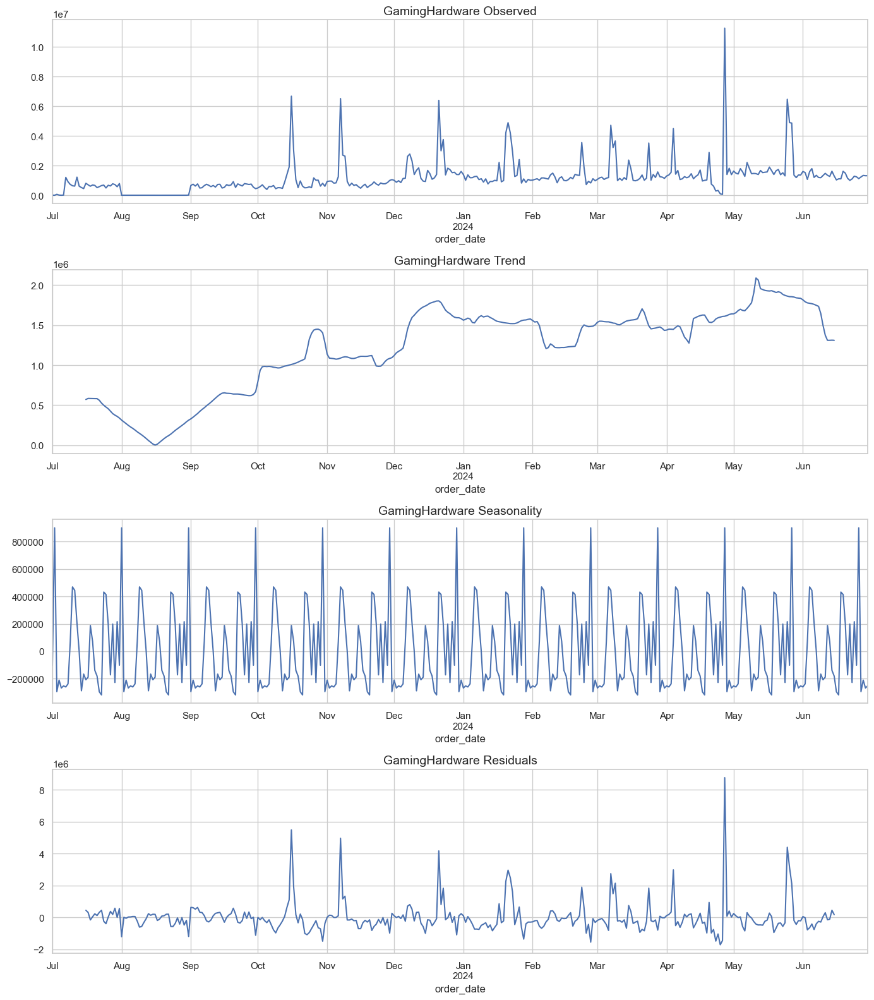

Completed time series decomposition for GamingHardware
--------------------------------------------------
Performing time series decomposition for EntertainmentSmall...


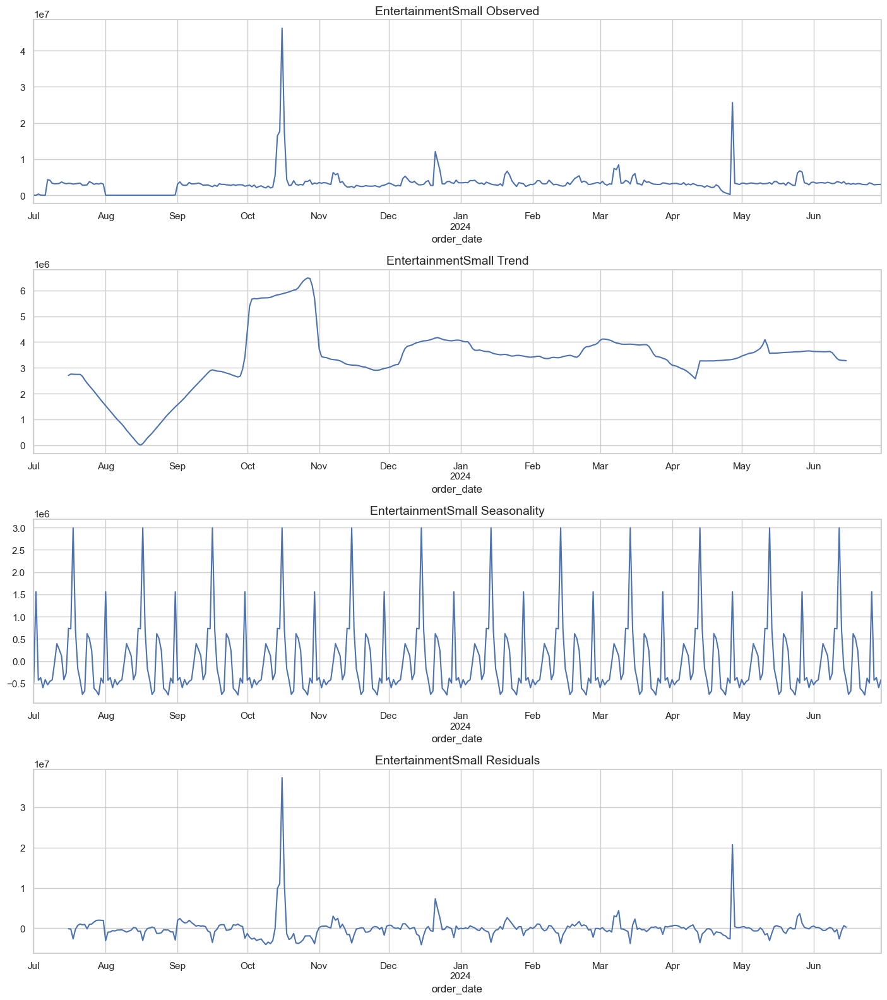

Completed time series decomposition for EntertainmentSmall
--------------------------------------------------
Performing time series decomposition for CameraAccessory...


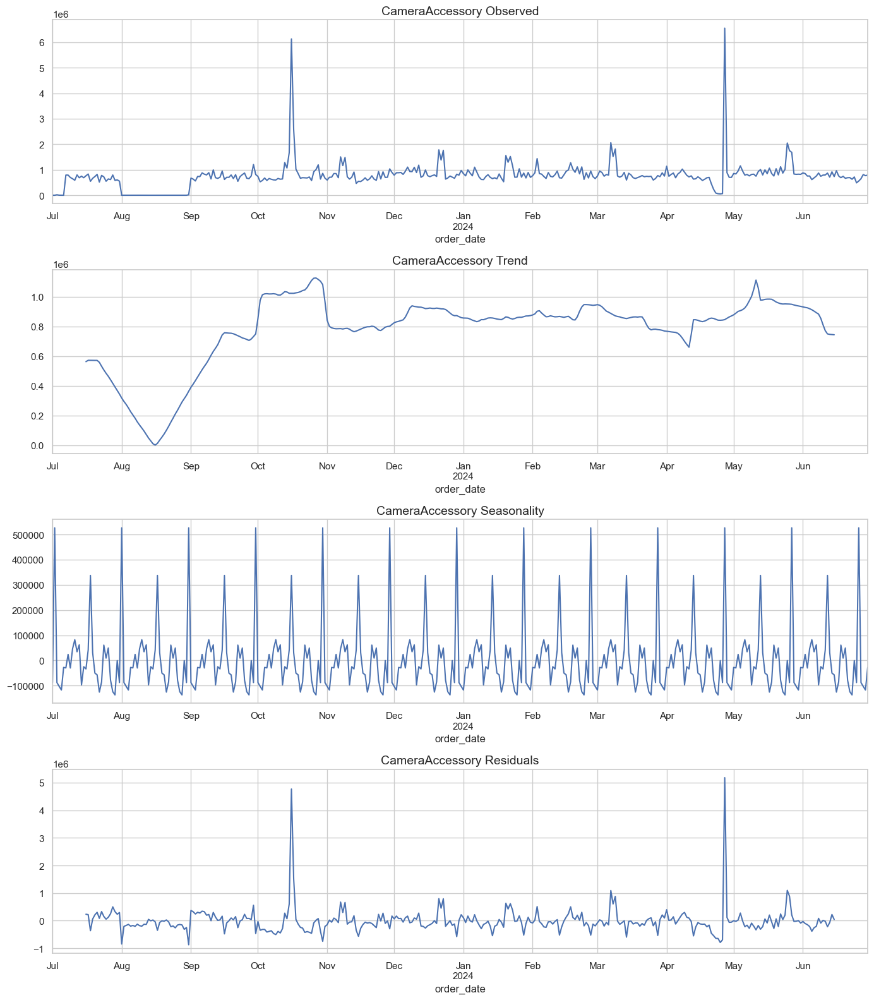

Completed time series decomposition for CameraAccessory
--------------------------------------------------
Performing time series decomposition for GameCDDVD...


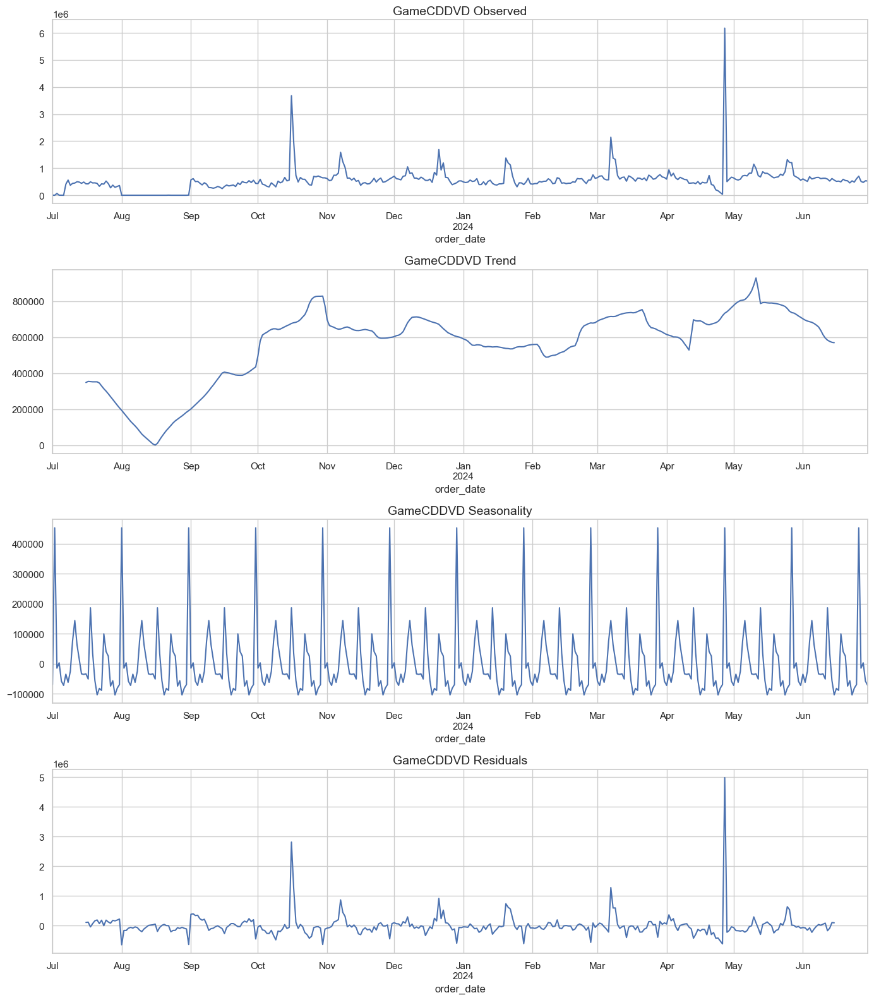

Completed time series decomposition for GameCDDVD
--------------------------------------------------
Performing time series decomposition for Camera...


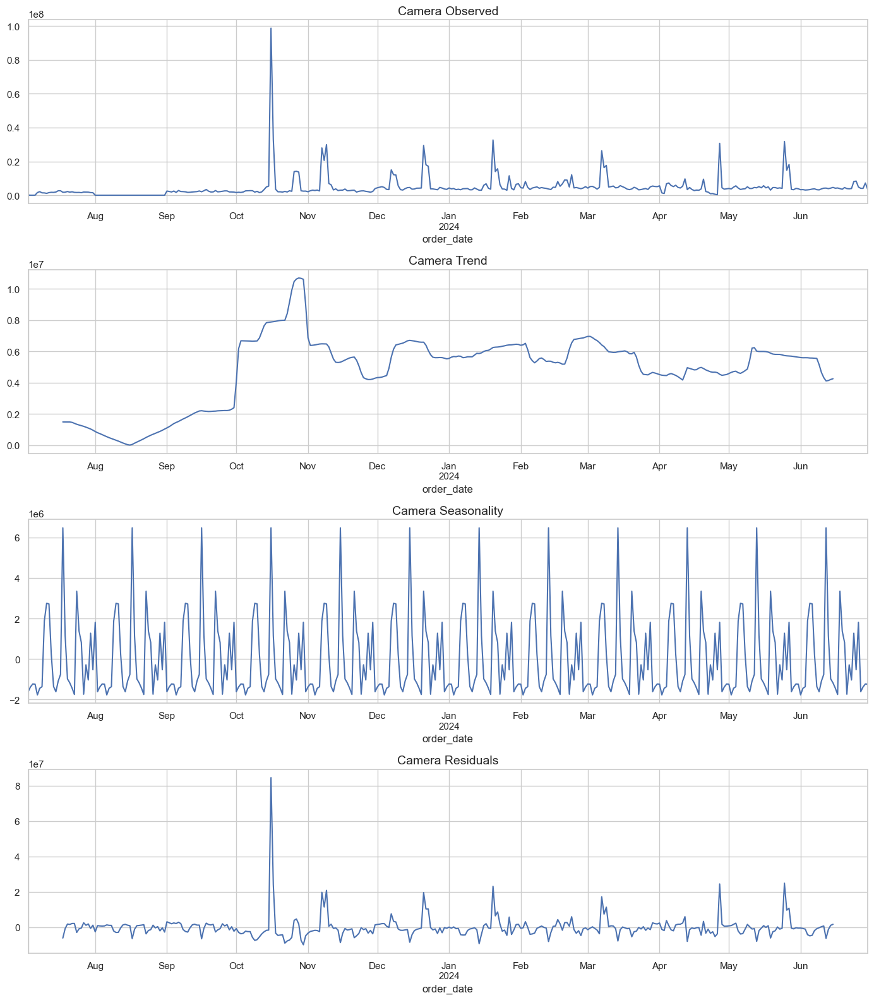

Completed time series decomposition for Camera
--------------------------------------------------


In [142]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

def decompose_time_series(df, category_name):
    # Set the order_date as index if it's not already
    if not isinstance(df.index, pd.DatetimeIndex):
        df = df.set_index('order_date')

    # Ensure the data is sorted by date
    df = df.sort_index()

    # Classical decomposition
    decomposition = seasonal_decompose(df['revenue'], model='additive', period=30)

    fig, axes = plt.subplots(4, 1, figsize=(14, 16))

    decomposition.observed.plot(ax=axes[0])
    axes[0].set_title(f'{category_name} Observed', fontsize=14)

    decomposition.trend.plot(ax=axes[1])
    axes[1].set_title(f'{category_name} Trend', fontsize=14)

    decomposition.seasonal.plot(ax=axes[2])
    axes[2].set_title(f'{category_name} Seasonality', fontsize=14)

    decomposition.resid.plot(ax=axes[3])
    axes[3].set_title(f'{category_name} Residuals', fontsize=14)

    plt.tight_layout()
    plt.show()

    return decomposition

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Store decompositions in a dictionary
decompositions = {}

# Create decomposition for each dataframe
for i, df_category in enumerate(category_dfs):
    # Make a copy to avoid modifying the original
    df_copy = df_category.copy()

    # Perform time series decomposition
    print(f"Performing time series decomposition for {category_names[i]}...")
    decompositions[category_names[i]] = decompose_time_series(df_copy, category_names[i])

    print(f"Completed time series decomposition for {category_names[i]}")
    print("-" * 50)

   **GamingHardware**
1. Sales of gaming hardware exhibit strong seasonality and an upward trend over the observed period.

2. Peaks in the observed data align with seasonal patterns but also include some anomalies (e.g., extreme spikes likely due to special events).

3. Businesses can leverage these insights for better inventory management and targeted marketing during peak demand periods.
         **EntertainmentSmall**
1. October 2023 Outlier: The sharp spike in October suggests a significant event (e.g., a major sale, festival, or promotional campaign) driving unusual activity.

2. Seasonal Patterns: Regular periodic peaks suggest predictable cycles in customer behavior or demand.

3. Declining Trend: After an initial growth phase, the activity appears to stabilize and slightly decline post-February 2024.
        **CameraAccessory**
1. Peak Sales Periods: October 2023 and April 2024 saw unusually high sales, likely due to external events such as festivals or marketing campaigns.

2. Growth Phase: Sales grew steadily from September to December 2023 but plateaued afterward.

3. Seasonal Demand: Weekly spikes indicate predictable consumer purchasing patterns, possibly tied to specific days or events.
           **GameCDDVD**
1. Seasonal Demand: There is a strong seasonal pattern with predictable peaks and troughs.

2. Holiday Effect: Demand surges significantly during the holiday season (October to December) and around April-May.

3. Irregular Events: Spikes in residuals suggest occasional events impacting sales beyond normal patterns.

           **Camera**
1. Strong Seasonal Peaks: The "Camera Observed" and "Seasonality" plots show recurring spikes, with a massive peak in October-November, likely due to holiday sales or events like Black Friday. Smaller but consistent weekly or monthly peaks are visible afterward.

2. Upward Trend with Post-Holiday Stabilization: The "Camera Trend" plot highlights a significant upward trend leading to October-November, followed by a decline and stabilization from December onward.

3. Anomalies During Peak Periods: The "Camera Residuals" plot reveals large deviations in October-November, indicating unexpected factors (e.g., promotions or external events) driving activity beyond trends and seasonality. Residuals stabilize afterward.






   





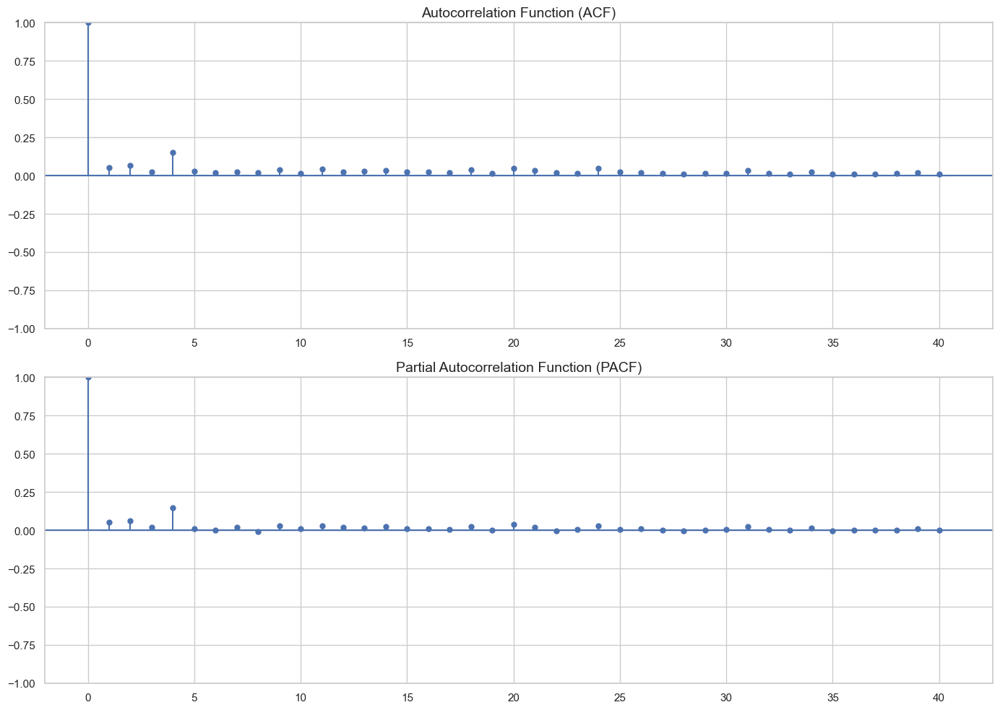

Significant ACF lags: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]
Significant PACF lags: [1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26, 28, 30, 31, 32, 34, 35, 39]


In [143]:
from statsmodels.tsa.stattools import acf, pacf # Importing the necessary functions
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf # Importing the necessary functions
def analyze_autocorrelation(df, lags=40):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

    # ACF
    plot_acf(df['revenue'], lags=lags, ax=ax1)
    ax1.set_title('Autocorrelation Function (ACF)', fontsize=14)

    # PACF
    plot_pacf(df['revenue'], lags=lags, ax=ax2)
    ax2.set_title('Partial Autocorrelation Function (PACF)', fontsize=14)

    plt.tight_layout()
    plt.show()

    # Calculate ACF and PACF values
    acf_values = acf(df['revenue'], nlags=lags)
    pacf_values = pacf(df['revenue'], nlags=lags)

    # Find significant lags (using 95% confidence interval)
    conf_level = 1.96 / np.sqrt(len(df))
    significant_acf = [i for i, val in enumerate(acf_values) if abs(val) > conf_level and i > 0]
    significant_pacf = [i for i, val in enumerate(pacf_values) if abs(val) > conf_level and i > 0]

    print(f"Significant ACF lags: {significant_acf}")
    print(f"Significant PACF lags: {significant_pacf}")

analyze_autocorrelation(df)

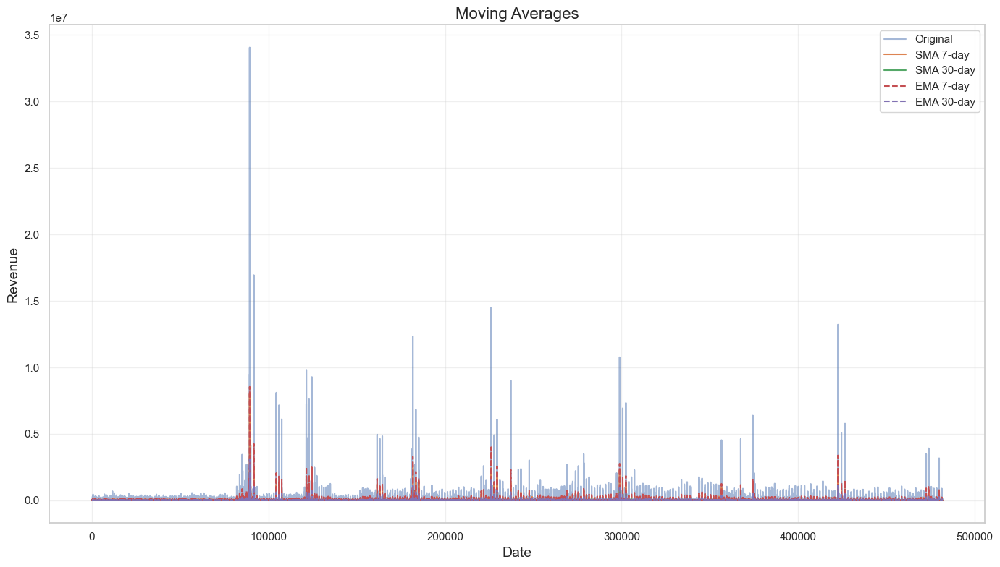

In [146]:
def analyze_moving_averages(df):
    moving_averages = df.copy()

    # Calculate moving averages
    moving_averages['SMA_7'] = df['revenue'].rolling(window=7).mean()
    moving_averages['SMA_30'] = df['revenue'].rolling(window=30).mean()
    moving_averages['EMA_7'] = df['revenue'].ewm(span=7, adjust=False).mean()
    moving_averages['EMA_30'] = df['revenue'].ewm(span=30, adjust=False).mean()

    # Plot
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.plot(moving_averages.index, moving_averages['revenue'], label='Original', alpha=0.5)
    ax.plot(moving_averages.index, moving_averages['SMA_7'], label='SMA 7-day')
    ax.plot(moving_averages.index, moving_averages['SMA_30'], label='SMA 30-day')
    ax.plot(moving_averages.index, moving_averages['EMA_7'], label='EMA 7-day', linestyle='--')
    ax.plot(moving_averages.index, moving_averages['EMA_30'], label='EMA 30-day', linestyle='--')

    ax.set_title('Moving Averages', fontsize=16)
    ax.set_xlabel('Date', fontsize=14)
    ax.set_ylabel('Revenue', fontsize=14)
    ax.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    return moving_averages

moving_avg_df = analyze_moving_averages(df)

1. **Revenue Spikes and Volatility**
The original revenue data (blue line) shows significant spikes at irregular intervals, indicating periods of exceptionally high revenue. These could be driven by events like seasonal sales, product launches, or promotional campaigns.

The overall revenue trend is highly volatile, with frequent fluctuations.

2. **Moving Averages Smoothing Trends**
The SMA 30-day (red line) and EMA 30-day (purple dashed line) smooth out the volatility, revealing long-term trends in revenue. These lines show a gradual increase or decrease in revenue cycles over time.

The SMA 7-day (green line) and EMA 7-day (red dashed line) provide a short-term view of trends, capturing more recent changes but still reducing noise.

3. **Long-Term Stability vs Short-Term Fluctuations**
While the raw data fluctuates sharply, the moving averages indicate a more stable underlying revenue pattern. The 30-day averages suggest sustained growth or decline trends over longer periods, whereas the 7-day averages are better for monitoring weekly performance adjustments.

Performing moving averages analysis for GamingHardware...


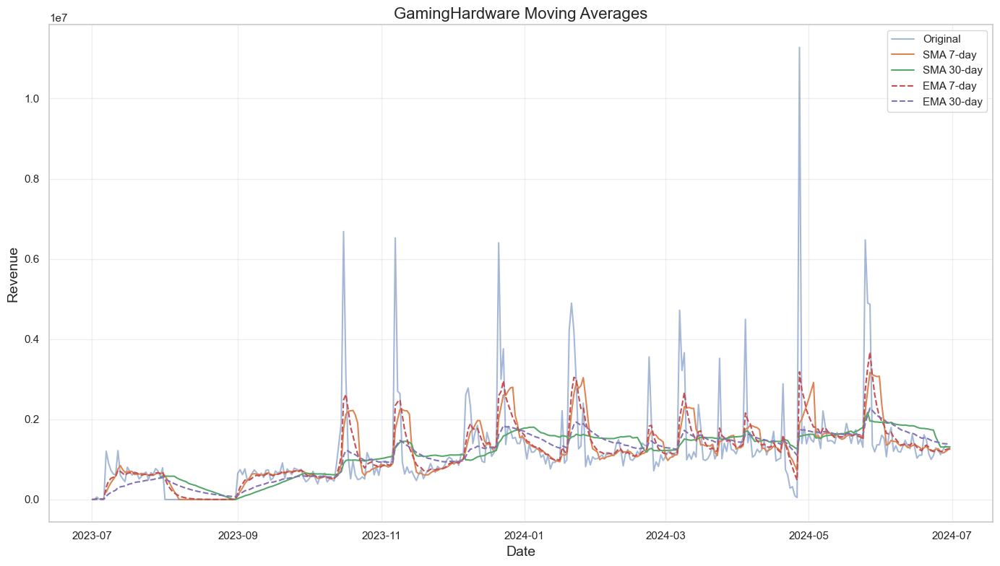

Completed moving averages analysis for GamingHardware
--------------------------------------------------
Performing moving averages analysis for EntertainmentSmall...


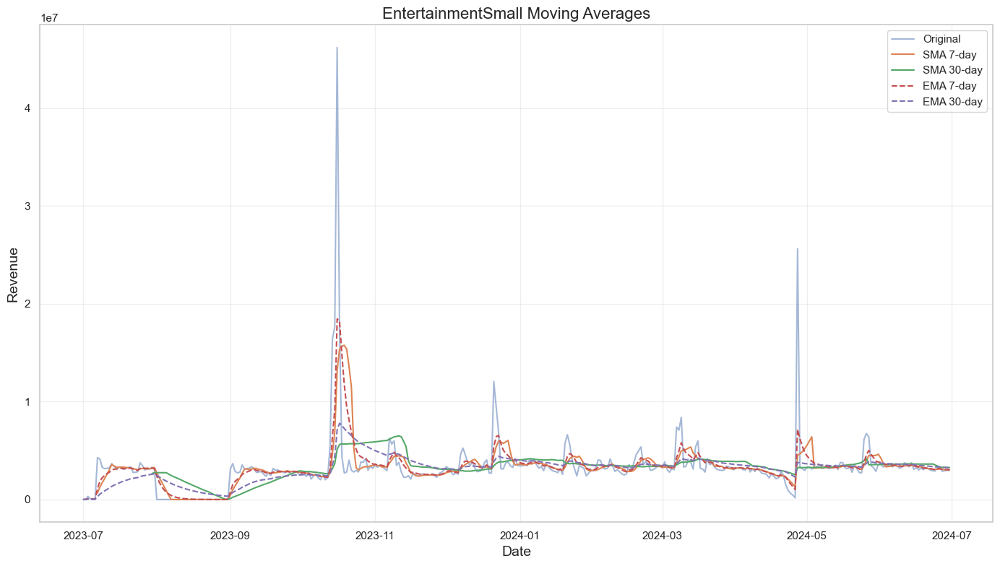

Completed moving averages analysis for EntertainmentSmall
--------------------------------------------------
Performing moving averages analysis for CameraAccessory...


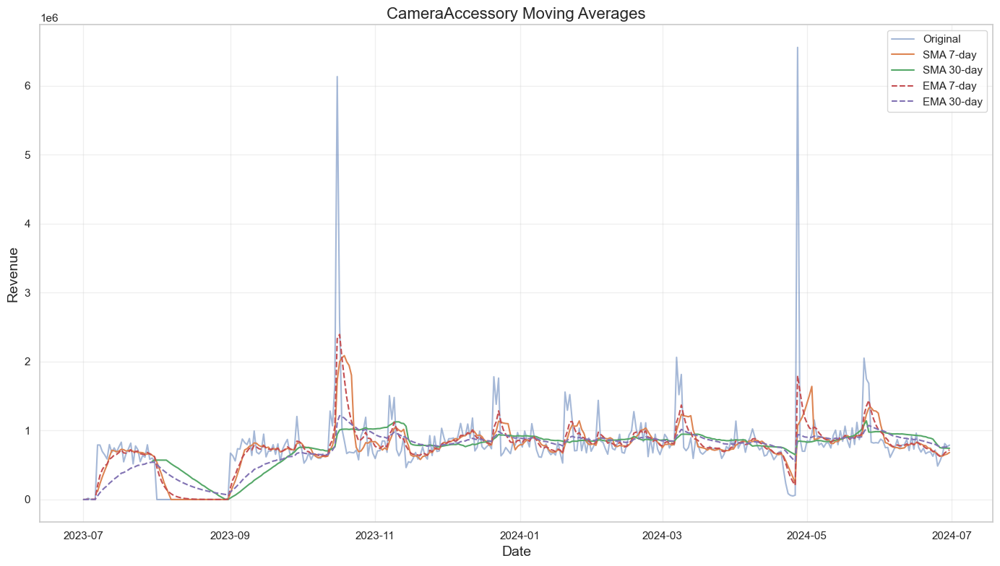

Completed moving averages analysis for CameraAccessory
--------------------------------------------------
Performing moving averages analysis for GameCDDVD...


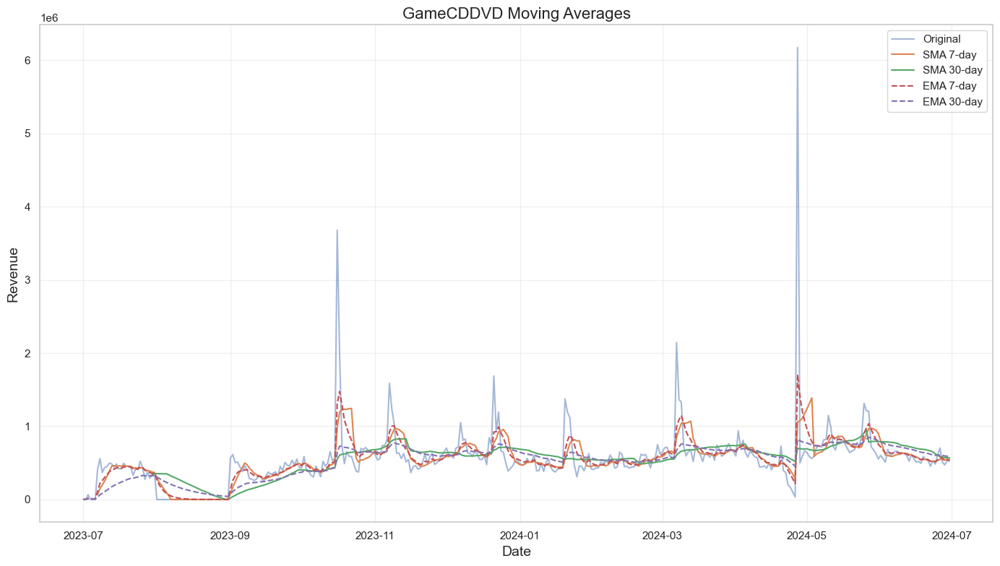

Completed moving averages analysis for GameCDDVD
--------------------------------------------------
Performing moving averages analysis for Camera...


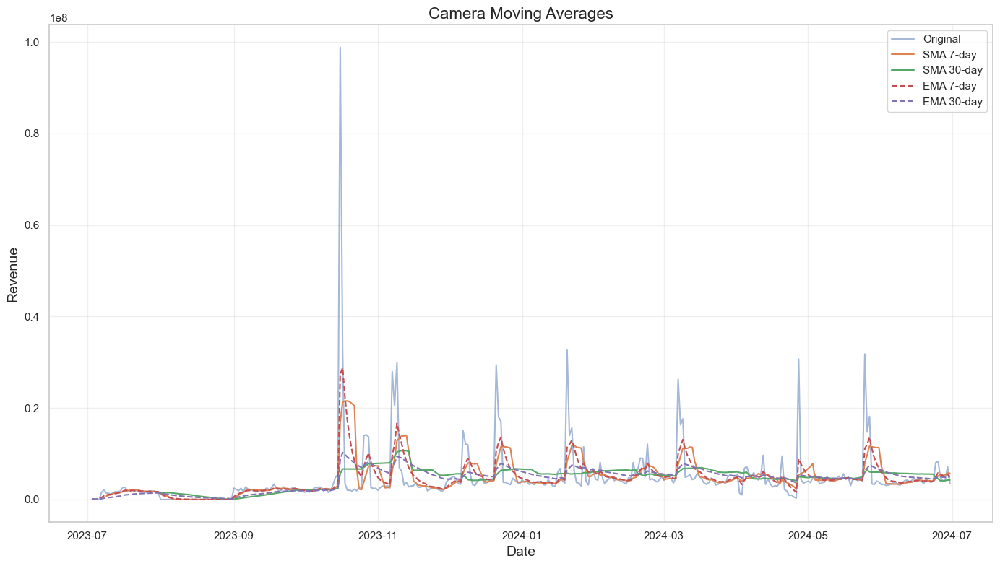

Completed moving averages analysis for Camera
--------------------------------------------------


In [147]:
import matplotlib.pyplot as plt

def analyze_moving_averages(df, category_name):
    # Set the order_date as index if it's not already
    if not isinstance(df.index, pd.DatetimeIndex):
        df = df.set_index('order_date')

    # Ensure the data is sorted by date
    df = df.sort_index()

    moving_averages = df.copy()

    # Calculate moving averages
    moving_averages['SMA_7'] = df['revenue'].rolling(window=7).mean()
    moving_averages['SMA_30'] = df['revenue'].rolling(window=30).mean()
    moving_averages['EMA_7'] = df['revenue'].ewm(span=7, adjust=False).mean()
    moving_averages['EMA_30'] = df['revenue'].ewm(span=30, adjust=False).mean()

    # Plot
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.plot(moving_averages.index, moving_averages['revenue'], label='Original', alpha=0.5)
    ax.plot(moving_averages.index, moving_averages['SMA_7'], label='SMA 7-day')
    ax.plot(moving_averages.index, moving_averages['SMA_30'], label='SMA 30-day')
    ax.plot(moving_averages.index, moving_averages['EMA_7'], label='EMA 7-day', linestyle='--')
    ax.plot(moving_averages.index, moving_averages['EMA_30'], label='EMA 30-day', linestyle='--')

    ax.set_title(f'{category_name} Moving Averages', fontsize=16)
    ax.set_xlabel('Date', fontsize=14)
    ax.set_ylabel('Revenue', fontsize=14)
    ax.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    return moving_averages

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Store moving averages dataframes in a dictionary
moving_avg_dfs = {}

# Create moving averages analysis for each dataframe
for i, df_category in enumerate(category_dfs):
    # Make a copy to avoid modifying the original
    df_copy = df_category.copy()

    # Perform moving averages analysis
    print(f"Performing moving averages analysis for {category_names[i]}...")
    moving_avg_dfs[category_names[i]] = analyze_moving_averages(df_copy, category_names[i])

    print(f"Completed moving averages analysis for {category_names[i]}")
    print("-" * 50)

       **Gaming Hardware**
1. Revenue Spikes and Seasonality:
The revenue (light blue line) shows periodic spikes, likely tied to seasonal events, product launches, or promotions. These spikes occur roughly every few months, indicating predictable high-demand periods.

2. Moving Averages Indicate Trends:
Short-term trends are captured by the 7-day SMA and EMA (orange and red lines), which react quickly to fluctuations.
Long-term trends are smoothed by the 30-day SMA and EMA (green and purple lines), providing a clearer picture of overall performance.

3. Baseline Stability:
Between spikes, revenue stabilizes at a lower baseline, suggesting steady but less intense demand during non-peak periods. This can be leveraged for consistent planning outside peak times.
   
       **EntertainmentSmall**
1. Revenue Spikes: The graph shows two major revenue spikes—around October-November 2023 and May 2024—indicating significant events or releases in the entertainment industry during these periods.

2. Trend Smoothing: Moving averages (SMA and EMA) effectively smooth out the fluctuations in the original data, with shorter-period averages (7-day) capturing immediate trends and longer-period averages (30-day) highlighting broader patterns.

3. Post-Spike Stabilization: After each spike, revenue stabilizes at lower levels, suggesting temporary surges rather than sustained growth. Seasonal or event-driven factors likely influence these trends.
          **CameraAccessory**
1. Revenue Spikes and Seasonality: The graph shows sharp revenue spikes in November 2023 and May 2024, likely due to seasonal events like holiday sales or promotional campaigns. Between these peaks, revenue remains relatively stable.

2. Moving Average Trends: Short-term moving averages (7-day SMA and EMA) are more responsive to fluctuations, while long-term averages (30-day SMA and EMA) provide smoother trends, highlighting sustained patterns in revenue growth.

3. Baseline Stability with Anomalies: Apart from the spikes, the baseline revenue is consistent, with minor fluctuations captured by the moving averages. The anomalies (spikes) indicate extraordinary events driving significant short-term increases in revenue.

             **GameCDDVDs**
1. Seasonal Revenue Spikes: The graph shows significant revenue spikes in November 2023, January 2024, and May 2024, likely tied to seasonal events, promotions, or product launches. These spikes far exceed the baseline revenue.

2. Baseline Stability: Excluding the spikes, the revenue baseline remains relatively stable with minor fluctuations over time, indicating consistent sales performance outside peak periods.

3. Moving Averages for Trend Analysis:
Short-term trends are captured effectively by the 7-day SMA and EMA, which react quickly to changes.
Long-term trends are better represented by the smoother 30-day SMA and EMA, which filter out short-term noise.
             **Camera**
1. Revenue Peaks and Seasonality:
The graph shows sharp revenue spikes, particularly in late 2023 and early 2024, likely due to seasonal events, promotions, or product launches. Smaller periodic spikes suggest recurring sales patterns.

2. Moving Average Trends:
The 7-day and 30-day SMAs and EMAs smooth out fluctuations, revealing consistent baseline revenue trends. EMAs react more quickly to changes, highlighting short-term shifts effectively.

3. Baseline Stability:
Apart from spikes, the baseline revenue remains relatively stable but low, indicating that sales are concentrated during specific high-revenue periods.










Analyzing rolling statistics for GamingHardware...


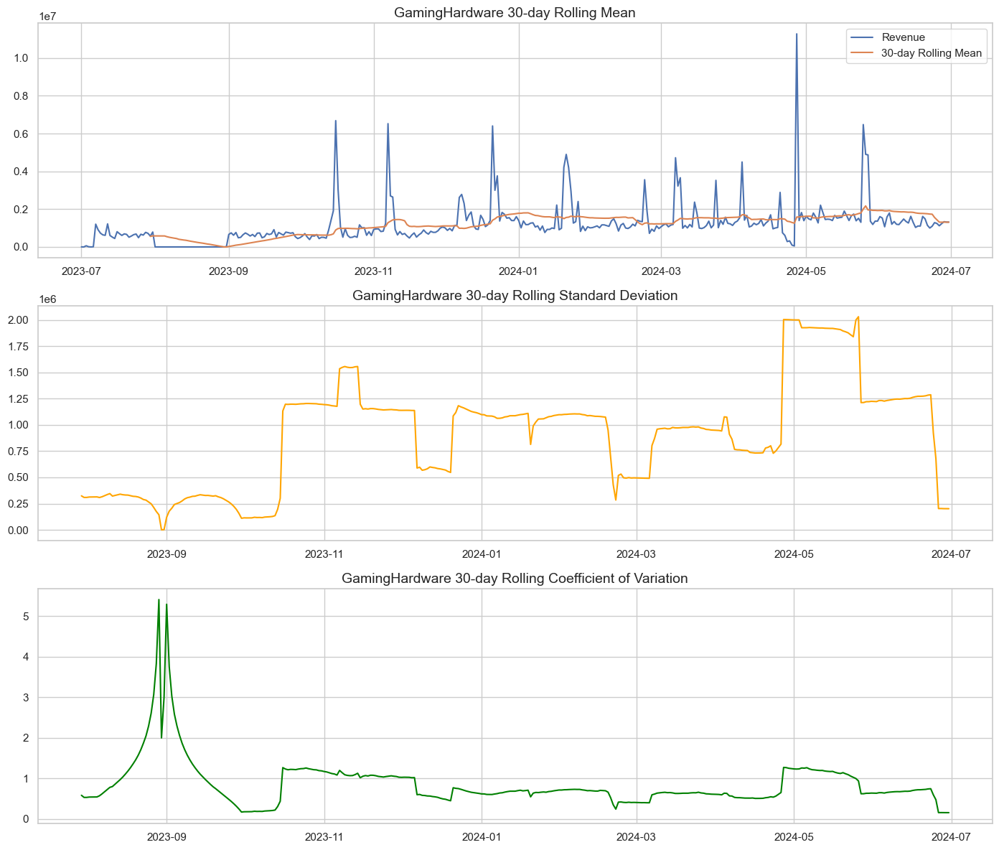

Completed rolling statistics analysis for GamingHardware
--------------------------------------------------
Analyzing rolling statistics for EntertainmentSmall...


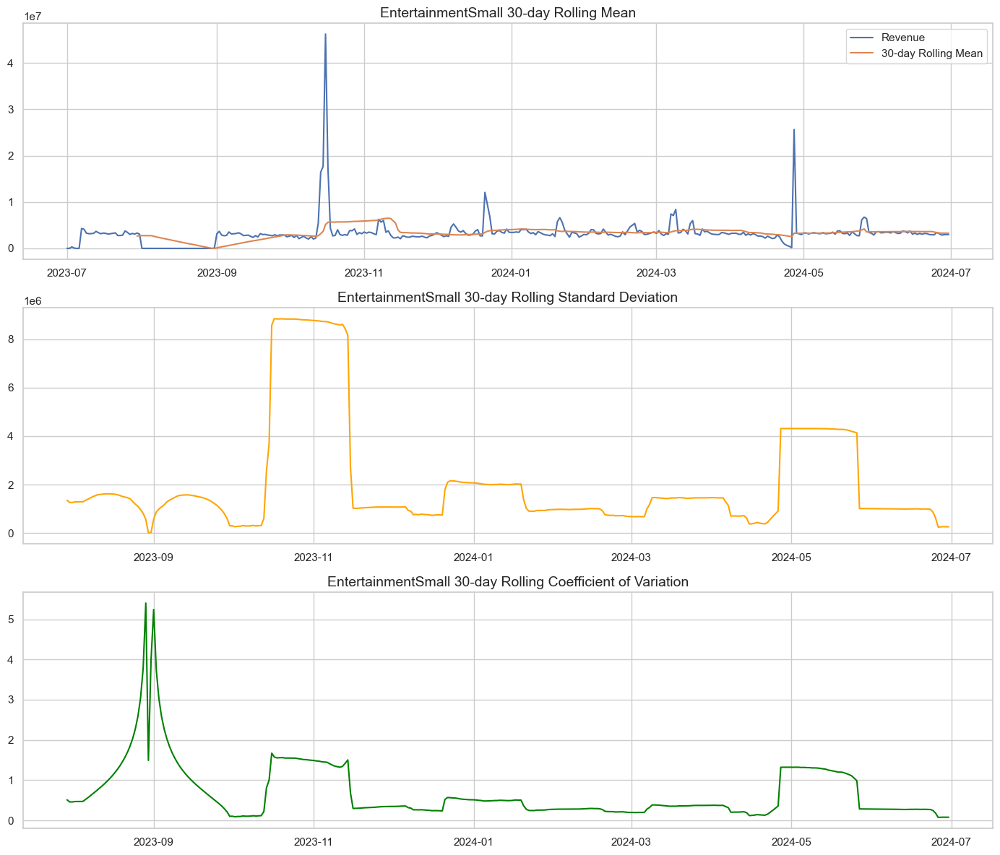

Completed rolling statistics analysis for EntertainmentSmall
--------------------------------------------------
Analyzing rolling statistics for CameraAccessory...


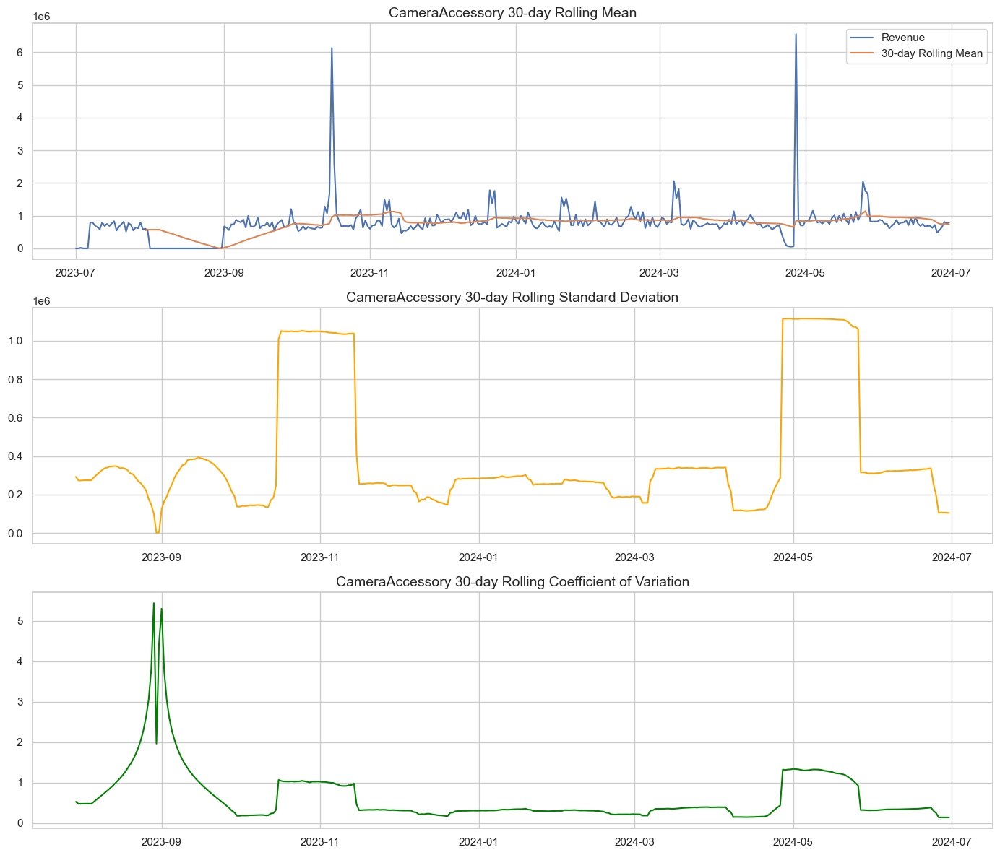

Completed rolling statistics analysis for CameraAccessory
--------------------------------------------------
Analyzing rolling statistics for GameCDDVD...


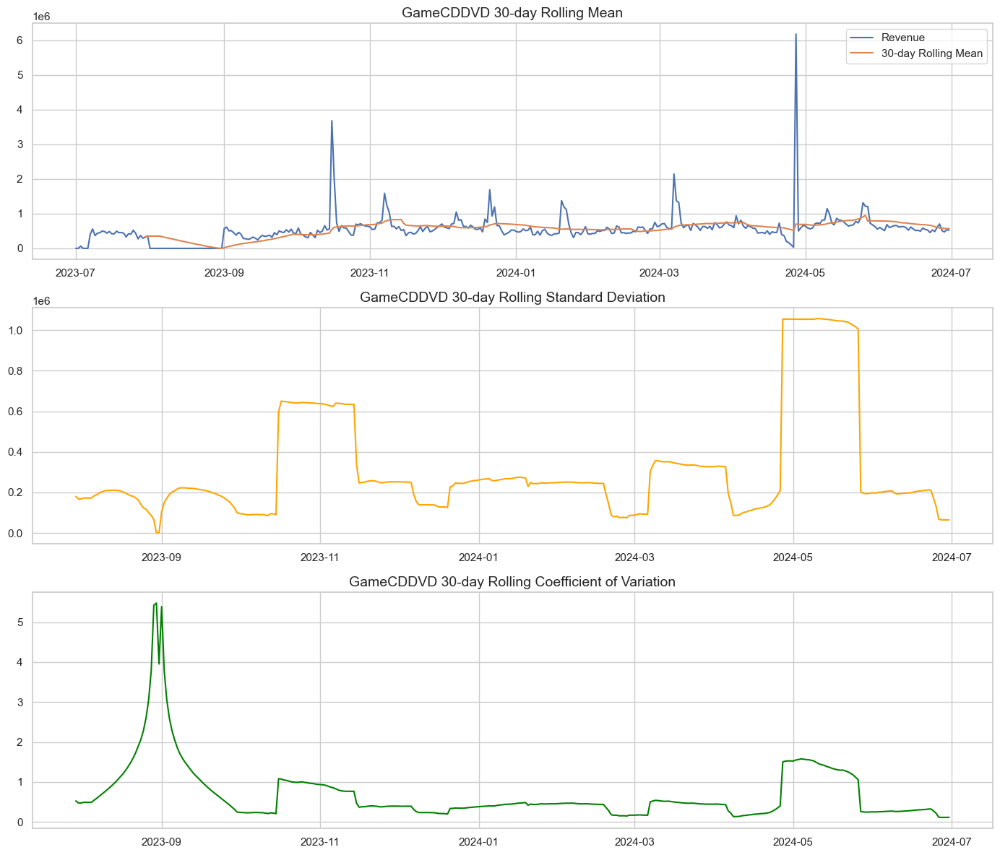

Completed rolling statistics analysis for GameCDDVD
--------------------------------------------------
Analyzing rolling statistics for Camera...


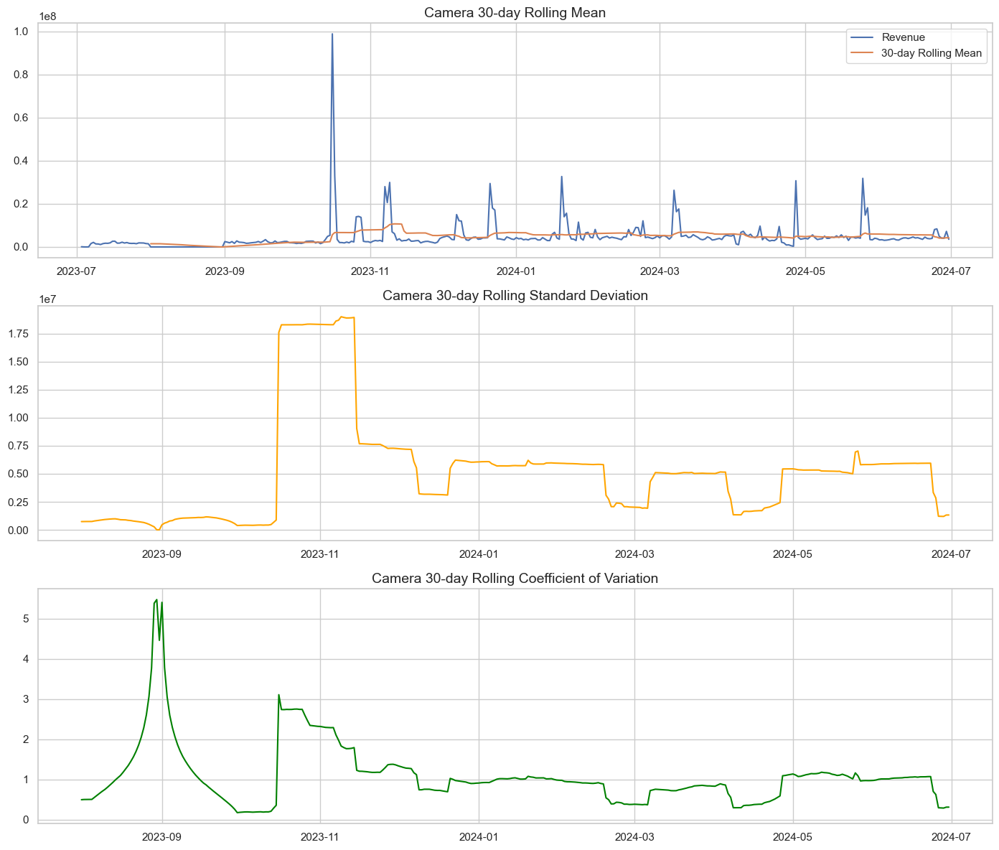

Completed rolling statistics analysis for Camera
--------------------------------------------------


In [148]:
import matplotlib.pyplot as plt

def analyze_rolling_statistics(df, category_name, window=30):
    # Set the order_date as index if it's not already
    if not isinstance(df.index, pd.DatetimeIndex):
        df = df.set_index('order_date')

    # Ensure the data is sorted by date
    df = df.sort_index()

    rolling_stats = df.copy()

    # Calculate rolling statistics
    rolling_stats['rolling_mean'] = df['revenue'].rolling(window=window).mean()
    rolling_stats['rolling_std'] = df['revenue'].rolling(window=window).std()
    rolling_stats['rolling_cv'] = rolling_stats['rolling_std'] / rolling_stats['rolling_mean']  # Coefficient of variation

    # Plot
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(14, 12))

    ax1.plot(rolling_stats.index, rolling_stats['revenue'], label='Revenue')
    ax1.plot(rolling_stats.index, rolling_stats['rolling_mean'], label=f'{window}-day Rolling Mean')
    ax1.set_title(f'{category_name} {window}-day Rolling Mean', fontsize=14)
    ax1.legend()

    ax2.plot(rolling_stats.index, rolling_stats['rolling_std'], color='orange')
    ax2.set_title(f'{category_name} {window}-day Rolling Standard Deviation', fontsize=14)

    ax3.plot(rolling_stats.index, rolling_stats['rolling_cv'], color='green')
    ax3.set_title(f'{category_name} {window}-day Rolling Coefficient of Variation', fontsize=14)

    plt.tight_layout()
    plt.show()

    return rolling_stats

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Store rolling statistics dataframes in a dictionary
rolling_stats_dfs = {}

# Create rolling statistics analysis for each dataframe
for i, df_category in enumerate(category_dfs):
    # Make a copy to avoid modifying the original
    df_copy = df_category.copy()

    # Perform rolling statistics analysis
    print(f"Analyzing rolling statistics for {category_names[i]}...")
    rolling_stats_dfs[category_names[i]] = analyze_rolling_statistics(df_copy, category_names[i])

    print(f"Completed rolling statistics analysis for {category_names[i]}")
    print("-" * 50)

      **Gaming Hardware**
1. Revenue Spikes: The data shows occasional significant spikes in revenue (e.g., late 2023 and mid-2024), likely due to specific events such as product launches or seasonal sales.

2. High Variability Periods: These spikes correspond to increased standard deviation and CV, indicating higher uncertainty and fluctuation during these times.

3. Stabilization: Outside of these peaks, both variability (standard deviation) and relative variability (CV) remain relatively low, indicating stable revenue trends on average.

This analysis suggests that while "GamingHardware" experiences occasional high-revenue events causing short-term volatility, its overall revenue pattern is relatively stable over time.
      
      **EntertainmentSmall**
1. Sales Event Impact:
The spikes in rolling mean and standard deviation clearly align with the sales calendar. Events like those in November and May had the most significant impact on revenue.

2. Revenue Volatility:
Periods like November and May show high variability, as seen in both standard deviation and CV. This suggests that while sales events drive revenue growth, they also introduce unpredictability.

3. Post-Sales Stabilization:
After major sales events, both standard deviation and CV stabilize quickly, indicating a return to normalcy in revenue patterns.

       ** CameraAccessory**
1. Events like August 28–30 and May 25–27 show strong performance. These periods can be leveraged for future campaigns with targeted marketing efforts.
For events with moderate spikes (e.g., October), strategies can be adjusted to maximize impact.

2. **Volatility Management:**
High volatility during sales events indicates the need for better inventory planning and forecasting to avoid stockouts or overstocking.

Stabilizing revenue through consistent promotions or loyalty programs may help reduce variability.

3. **Seasonal Trends:**
Holiday periods (November–December) consistently show strong performance. Investing in holiday-specific campaigns can yield significant returns.

        **GameCDDVDs**
1. **Seasonal Peaks**: Revenue shows clear spikes around September, November, and May. These could correspond to seasonal events like holidays or product launches.

2. **High Variability During Spikes**: Revenue is less predictable during peak periods, as evidenced by high standard deviation and CV values.

3. **Stabilization Over Time**: Outside of these spikes, both absolute and relative variability decrease, indicating more predictable sales patterns.
          **Camera**
1. Seasonal Trends and Promotions: Revenue spikes align with potential seasonal sales or promotional events, particularly in late 2023.

2. Revenue Stability: Outside of these events, revenue remains relatively stable with low variability.

3. Risk Management: High standard deviation and CV during spikes indicate potential risks in forecasting and inventory management during peak periods.

Analyzing Fourier transform for GamingHardware...


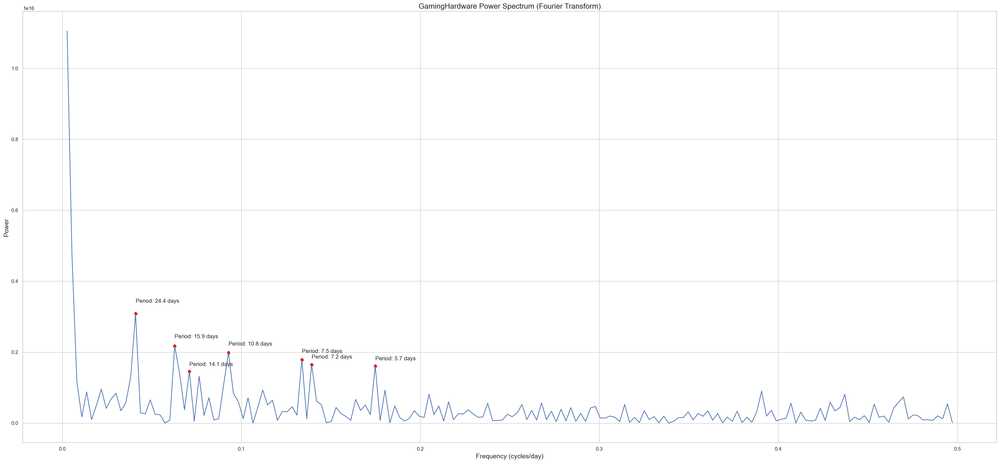


GamingHardware Top periodicities detected (in days):
1. 24.4 days
2. 15.9 days
3. 10.8 days
4. 7.5 days
5. 7.2 days

Pattern interpretation:
- Weekly pattern detected (7-day cycle)
Completed Fourier transform analysis for GamingHardware
--------------------------------------------------
Analyzing Fourier transform for EntertainmentSmall...


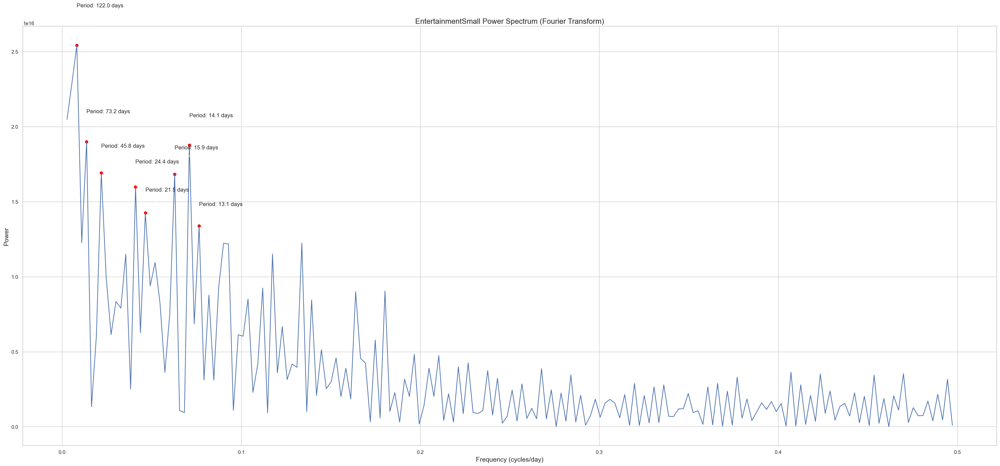


EntertainmentSmall Top periodicities detected (in days):
1. 122.0 days
2. 73.2 days
3. 14.1 days
4. 45.8 days
5. 15.9 days

Pattern interpretation:
- No standard business cycles detected
Completed Fourier transform analysis for EntertainmentSmall
--------------------------------------------------
Analyzing Fourier transform for CameraAccessory...


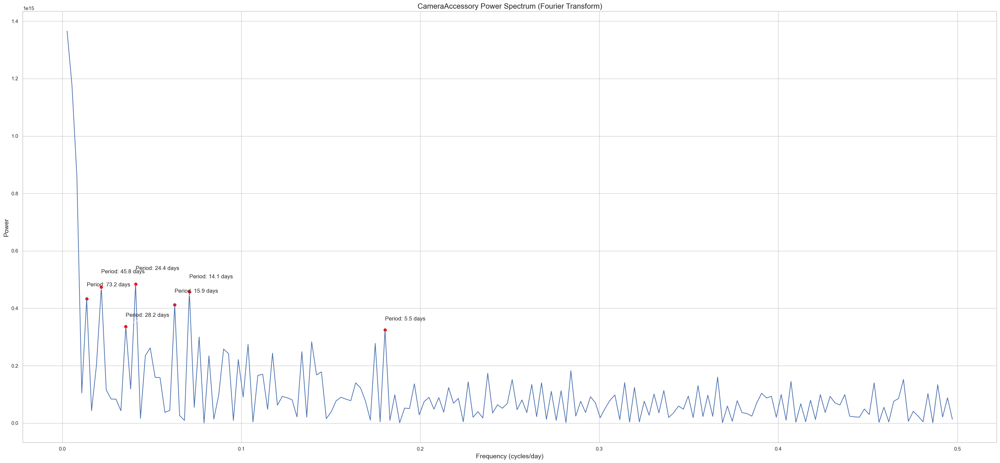


CameraAccessory Top periodicities detected (in days):
1. 24.4 days
2. 45.8 days
3. 14.1 days
4. 73.2 days
5. 15.9 days

Pattern interpretation:
- No standard business cycles detected
Completed Fourier transform analysis for CameraAccessory
--------------------------------------------------
Analyzing Fourier transform for GameCDDVD...


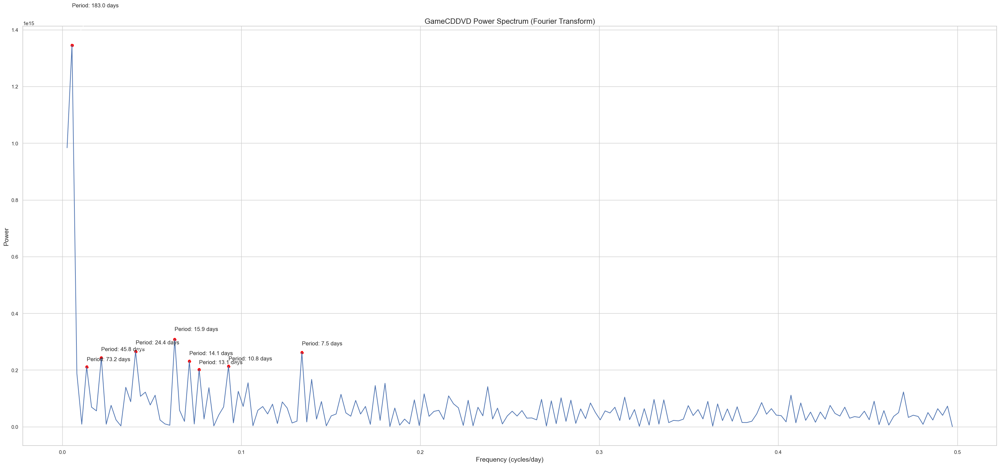


GameCDDVD Top periodicities detected (in days):
1. 183.0 days
2. 15.9 days
3. 24.4 days
4. 7.5 days
5. 45.8 days

Pattern interpretation:
- Weekly pattern detected (7-day cycle)
Completed Fourier transform analysis for GameCDDVD
--------------------------------------------------
Analyzing Fourier transform for Camera...


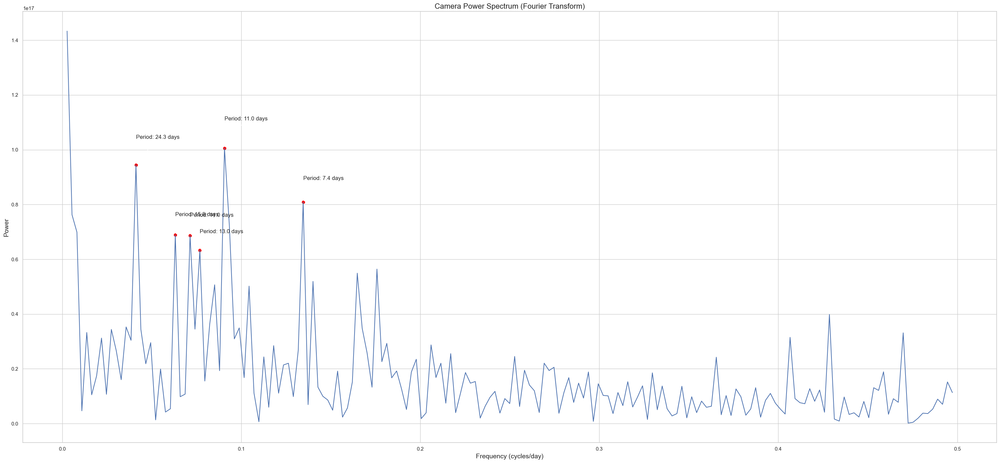


Camera Top periodicities detected (in days):
1. 11.0 days
2. 24.3 days
3. 7.4 days
4. 15.8 days
5. 14.0 days

Pattern interpretation:
- Weekly pattern detected (7-day cycle)
Completed Fourier transform analysis for Camera
--------------------------------------------------


In [149]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def analyze_fourier_transform(df, category_name):
    # Set the order_date as index if it's not already
    if not isinstance(df.index, pd.DatetimeIndex):
        df = df.set_index('order_date')

    # Ensure the data is sorted by date
    df = df.sort_index()

    # Prepare data
    revenue = df['revenue'].values
    n = len(revenue)

    # Perform FFT
    fft_values = np.fft.fft(revenue)
    fft_freq = np.fft.fftfreq(n, d=1)

    # Compute the power spectrum
    power = np.abs(fft_values) ** 2

    # We only need the first half of the FFT
    power = power[1:n//2]
    freq = fft_freq[1:n//2]

    # Find peaks in the power spectrum
    peaks, _ = find_peaks(power, height=np.percentile(power, 95))

    # Plot the power spectrum
    plt.figure(figsize=(30, 14))
    plt.plot(freq, power)
    plt.scatter(freq[peaks], power[peaks], color='red', marker='o')

    for i, peak in enumerate(peaks):
        period = 1 / freq[peak]
        plt.annotate(f'Period: {period:.1f} days',
                     xy=(freq[peak], power[peak]),
                     xytext=(freq[peak], power[peak] * 1.1),
                     arrowprops=dict(arrowstyle='->'))

    plt.title(f'{category_name} Power Spectrum (Fourier Transform)', fontsize=16)
    plt.xlabel('Frequency (cycles/day)', fontsize=14)
    plt.ylabel('Power', fontsize=14)
    plt.tight_layout()
    plt.show()

    # Print the top periodicities
    periods = 1 / freq[peaks]
    power_at_peaks = power[peaks]

    # Sort by power
    sorted_indices = np.argsort(power_at_peaks)[::-1]
    top_periods = periods[sorted_indices][:5] if len(periods) >= 5 else periods[sorted_indices]

    print(f"\n{category_name} Top periodicities detected (in days):")
    for i, period in enumerate(top_periods, 1):
        print(f"{i}. {period:.1f} days")

    # Interpret common patterns
    if len(top_periods) > 0:
        weekly = any((6.5 <= p <= 7.5) for p in top_periods)
        monthly = any((27 <= p <= 31) for p in top_periods)
        quarterly = any((85 <= p <= 95) for p in top_periods)

        print("\nPattern interpretation:")
        if weekly:
            print("- Weekly pattern detected (7-day cycle)")
        if monthly:
            print("- Monthly pattern detected (28-31 day cycle)")
        if quarterly:
            print("- Quarterly pattern detected (90-day cycle)")
        if not any([weekly, monthly, quarterly]):
            print("- No standard business cycles detected")

# List of all category dataframes
category_dfs = [df_GamingHardware, df_EntertainmentSmall, df_CameraAccessory, df_GameCDDVD, df_Camera]
category_names = ['GamingHardware', 'EntertainmentSmall', 'CameraAccessory', 'GameCDDVD', 'Camera']

# Create Fourier transform analysis for each dataframe
for i, df_category in enumerate(category_dfs):
    # Make a copy to avoid modifying the original
    df_copy = df_category.copy()

    # Perform Fourier transform analysis
    print(f"Analyzing Fourier transform for {category_names[i]}...")
    analyze_fourier_transform(df_copy, category_names[i])

    print(f"Completed Fourier transform analysis for {category_names[i]}")
    print("-" * 50)